In [544]:
times

array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
       2458516.08417223, 2458516.08556108, 2458516.08694993])

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import lightkurve as lk

from scipy import optimize
from scipy.signal import find_peaks
from astropy.stats import LombScargle

from matplotlib import rcParams
rcParams["figure.dpi"] = 150

from lmfit import Model

import scipy.special
import math

from astropy.io import fits

import random

from astropy.time import Time

import os

from scipy.ndimage import gaussian_filter
from astropy.stats import sigma_clip

In [2]:
from matplotlib import rcParams
rcParams["figure.dpi"] = 150

In [3]:
#The following lines are just a nice looking progress bar.
#Have a look at https://github.com/kuk/log-progress
#If you do not want to use it, remove log_progress() from every loop in the next cell. 

def log_progress(sequence, every=None, size=None, name='Items'):
    from ipywidgets import IntProgress, HTML, VBox
    from IPython.display import display

    is_iterator = False
    if size is None:
        try:
            size = len(sequence)
        except TypeError:
            is_iterator = True
    if size is not None:
        if every is None:
            if size <= 200:
                every = 1
            else:
                every = int(size / 200)     # every 0.5%
    else:
        assert every is not None, 'sequence is iterator, set every'

    if is_iterator:
        progress = IntProgress(min=0, max=1, value=1)
        progress.bar_style = 'info'
    else:
        progress = IntProgress(min=0, max=size, value=0)
    label = HTML()
    box = VBox(children=[label, progress])
    display(box)

    index = 0
    try:
        for index, record in enumerate(sequence, 1):
            if index == 1 or index % every == 0:
                if is_iterator:
                    label.value = '{name}: {index} / ?'.format(
                        name=name,
                        index=index
                    )
                else:
                    progress.value = index
                    label.value = u'{name}: {index} / {size}'.format(
                        name=name,
                        index=index,
                        size=size
                    )
            yield record
    except:
        progress.bar_style = 'danger'
        raise
    else:
        progress.bar_style = 'success'
        progress.value = index
        label.value = "{name}: {index}".format(
            name=name,
            index=str(index or '?')
        )

# Extract times&mags of bPic

SearchResult containing 4 data products.

target_name                     productFilename                     description  distance
----------- ------------------------------------------------------- ------------ --------
  270577175 tess2018292075959-s0004-0000000270577175-0124-s_lc.fits Light curves      0.0
  270577175 tess2018319095959-s0005-0000000270577175-0125-s_lc.fits Light curves      0.0
  270577175 tess2018349182459-s0006-0000000270577175-0126-s_lc.fits Light curves      0.0
  270577175 tess2019006130736-s0007-0000000270577175-0131-s_lc.fits Light curves      0.0


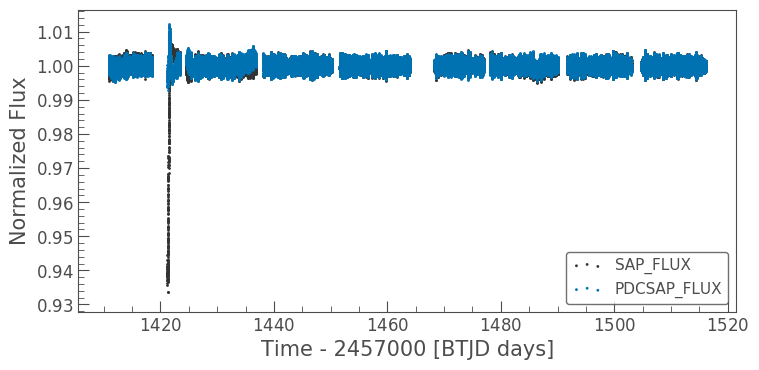

In [4]:
for name in ['beta Pictoris']:
    sr = lk.search_lightcurvefile(name)
    print(sr)

    if len(sr) > 0:

        #Download data
        lcfs = sr.download_all()

        # Use the normalized PDCSAP_FLUX
        lc0 = lcfs[0].SAP_FLUX.normalize()
        lc1 = lcfs[0].PDCSAP_FLUX.normalize()

        # Loop through the rest of the LCFS, appending to the first light curve
        for lcf in lcfs[1:]:
            lc0 = lc0.append(lcf.SAP_FLUX.normalize())
            lc1 = lc1.append(lcf.PDCSAP_FLUX.normalize())

        #Remove bad quality and nans
        q0 = lc0.quality == 0
        lc0 = lc0[q0].remove_nans()
        q1 = lc1.quality == 0
        lc1 = lc1[q1].remove_nans()
        #Plot data
        ax = lc0.scatter(label = 'SAP_FLUX')
        lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')

        
        #Times & Mags
        times = lc1.time + 2457000
        mags = -2.5 * np.log10(lc1.flux)
        mags = mags - np.median(mags)
        
        x = times
        y = mags

In [5]:
#Amplitude Spectrum Function
def AS(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(df, 120, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))

In [6]:
#Fourier Function
def fourier_sum(freqs, amps, phase, y_noise, x):
    y = []
    for j in range(0, len(x)):
        temp = []
        temp.append(y_noise[j])
        for i in range(0, len(freqs)):
            #next line: sum(amplitude_i * sine(freq_i * x + phase_i)) for all pulsations i 
            temp.append(amps[i]*np.sin(2.*np.pi*freqs[i]*x[j]+phase[i]))
        y.append(sum(temp))
    return y

def lc_sim(freqs, amps, phs, time_start, time_end, cadence, precision):
    freqs = np.array(freqs)
    amps = np.array(amps)
    phs = np.array(phs)
    
    time = np.arange(time_start, time_end, cadence)
    noise = np.random.normal(0, precision, len(time))
    
    multisine = np.array(fourier_sum(freqs, amps, phs, noise, time))

    return [freqs, amps, phs, time, multisine]

def lc_model(freqs, amps, phs, time_start, time_end, cadence_model):
    freqs = np.array(freqs)
    amps = np.array(amps)
    phs = np.array(phs)
    
    time_model = np.arange(time_start, time_end, cadence_model)
    noise_model = [0 for i in time_model]    

    multisine_model = np.array(fourier_sum(freqs, amps, phs, noise_model, time_model))

    return [freqs, amps, phs, time_model, multisine_model]

def lc_model_times(freqs, amps, phs, times):
    freqs = np.array(freqs)
    amps = np.array(amps)
    phs = np.array(phs)
    
    time_model = times
    noise_model = [0 for i in time_model]  

    multisine_model = np.array(fourier_sum(freqs, amps, phs, noise_model, time_model))

    return [freqs, amps, phs, time_model, multisine_model]

def lc_model_times(freqs, amps, phs, times, precision):
    freqs = np.array(freqs)
    amps = np.array(amps)
    phs = np.array(phs)
    
    time_model = times
    noise_model = np.random.normal(0, precision, len(time_model))
    #noise_model = [0 for i in time_model]  

    multisine_model = np.array(fourier_sum(freqs, amps, phs, noise_model, time_model))

    return [freqs, amps, phs, time_model, multisine_model]

In [7]:
def dft_phase(x, y, freq):
    """ 
    Discrete fourier transform to calculate the ASTC phase
    given x, y, and an array of frequencies
    
    Parameters
    ----------
        x : `array`
            Array in which to calculate 
        x : `array`
    
    Returns:
    ----------
        phase : `list`
            A list of phases for the given frequencies
    """

    freq = np.asarray(freq)
    x = np.array(x)
    y = np.array(y)
    phase = []
    for f in freq:
        expo = 2.0 * np.pi * f * x
        ft_real = np.sum(y * np.cos(expo))
        ft_imag = np.sum(y * np.sin(expo))
        phase.append(np.arctan2(ft_imag,ft_real))
        
        
    ## my phase wrapping patch
    tmp = []
    for i in phase:
        if i < 0:
            tmp.append(i + 2 * np.pi)
        else:
            tmp.append(i)

    p = np.array(tmp)
    p = (- p + np.pi/2) % (2 * np.pi)

    return p

In [8]:
def sin(x: np.ndarray, amp: float, f: float, phase: float) -> np.ndarray:
    """
    Sinus function, used for fitting.

    :param x: Time axis
    :param amp: amplitude
    :param f: frequency
    :param phase: phase, normed to 1
    """
    return amp * np.sin(2. * np.pi * (f * x + phase))

def phases_simon(times, magnitudes, f_fix, a_guess, p_guess):
    
    freqs = []
    amps = []
    phases = []
    phases_err = []
    
    for i in range(len(f_fix)):

        model1 = Model(sin)
        #model1.set_param_hint('amp', value=a_guess[i], vary=False)
        model1.set_param_hint('amp', value=a_guess[i], min=0.5 * a_guess[i], max=1.5 * a_guess[i])
        model1.set_param_hint('f', value=f_fix[i], vary=False)
        model1.set_param_hint('phase', value=p_guess[i], min=0, max=1)
        result1 = model1.fit(magnitudes, x=times, method='least_squares')

        # after first fit, vary only phase
        model2 = Model(sin)
        model2.set_param_hint('amp', value=result1.values['amp'], vary=False)
        model2.set_param_hint('f', value=f_fix[i], vary=False)
        model2.set_param_hint('phase', value=result1.values['phase'], min=0, max=1)
        result2 = model2.fit(magnitudes, x=times, method='least_squares')

        freqs.append(result2.values['f'])
        amps.append(result2.values['amp'])
        phases.append(result2.values['phase'])
        phases_err.append(np.sqrt(np.diag(result2.covar)[0]))
        
    freqs = np.array(freqs)
    amps = np.array(amps)
    phases = np.array(phases)
    phases_err = np.array(phases_err)
        
    return(freqs, amps, phases, phases_err)

# AS of bPic

In [9]:
lower = min(times)+27
upper = min(times)+39

Calculate AS


82
Calculate Phases
Calculate Model for selected Freqs and Calc. AS
Calculate Model for Comparison


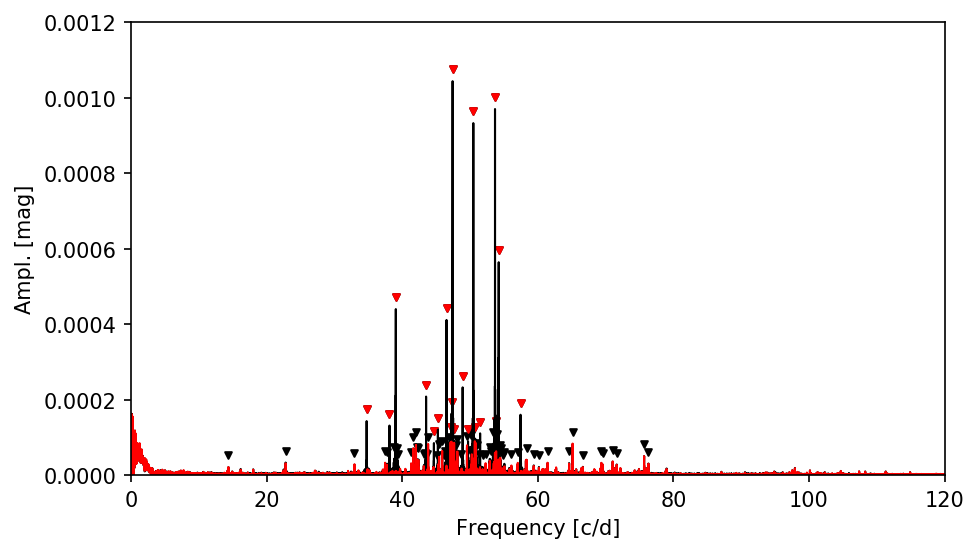

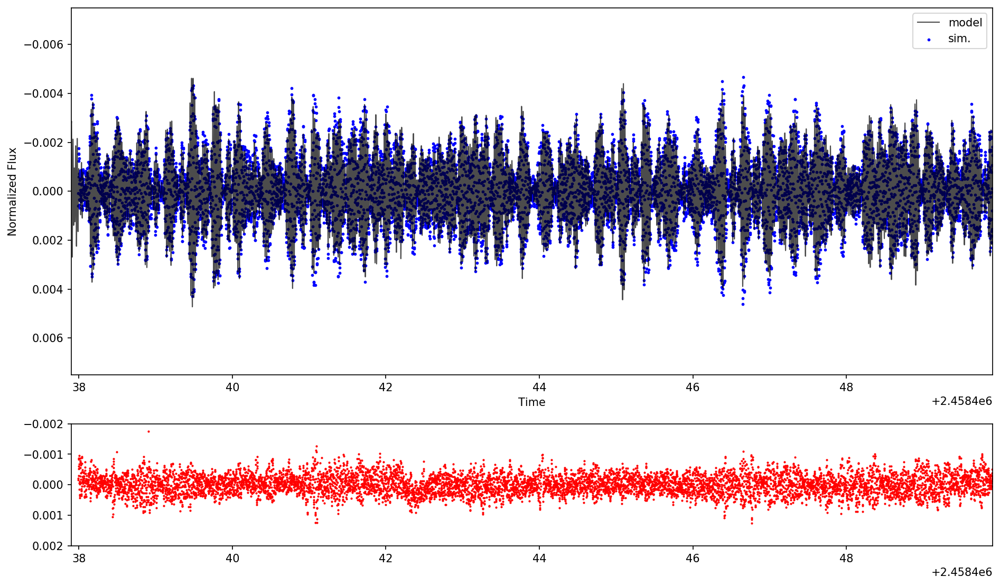

In [10]:
print('Calculate AS')
#AS
freq, amp = AS(times, mags, 15)

fig, ax = plt.subplots(1, 1, figsize=(7, 4))

ax.plot(freq, amp, c = 'k', lw = 1)


freq=freq[5000:]
amp=amp[5000:]
#ax.plot(freq, amp, c = 'k', lw = 1)


# PEAKS
max_power = amp.max()

peaks, _ = find_peaks(amp, height=max_power*0.02, distance=200)
ax.scatter(freq[peaks], amp[peaks] + 0.03*max_power, marker="v", s=10, c='k')

ax.set_xlim(0,120)
ax.set_ylim(0, 0.0012)
ax.set_xlabel('Frequency [c/d]')
ax.set_ylabel('Ampl. [mag]')


# FREQS SORTED BY AMPLITUDE
sort_idx = np.argsort(amp[peaks])[::-1]
f_TESS = freq[peaks][sort_idx]
a_TESS = amp[peaks][sort_idx]
print(len(f_TESS))


print('Calculate Phases')
# PHASES
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)



# SELECT HOW MANY FREQS FOR COMPARISON

n = 20

f_TESS = f_TESS[:20]
a_TESS = a_TESS[:20]
p_TESS = p_TESS[:20]


# MARK SELECTED FREQS IN FIRST PLOT
ax.scatter(f_TESS, a_TESS + 0.03*max_power, marker="v", s=10, c='r')

print('Calculate Model for selected Freqs and Calc. AS')
# SUBTRACT FREQS FROM AMPLITUDE SPECTRUM 

model_times_all = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times, 0)

freq, amp = AS(times, mags-model_times_all[4], 15)

ax.plot(freq, amp, c = 'r', lw = 1)


#################
# COMPARISON PLOT

# lower = min(times)+30
# upper = min(times)+31

m1 = times < upper
m2 = times > lower
m0 = m1 & m2


print('Calculate Model for Comparison')
# CALCULATE MODEL FOR COMPARISON

model = lc_model(f_TESS, a_TESS, p_TESS*2*np.pi, lower, upper, 2/1440/20)
model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times[m0], 0)

# MAKE PLOT

fig, ax = plt.subplots(2, 1, figsize=(15, 9), gridspec_kw = {'height_ratios':[3, 1]})

ax[0].scatter(times[m0], mags[m0], s=3, c='b', label = 'sim.')
ax[0].plot(model[3], model[4], c='k', linewidth=1, label = 'model',alpha=0.7)

ax[0].set_xlabel('Time')
ax[0].set_ylabel('Normalized Flux')

ax[1].scatter(times[m0], mags[m0]-model_times[4], s=1, c='r') # Residuals

ax[0].set_ylim(-0.0075, 0.0075)
ax[1].set_ylim(-0.002, 0.002)

for i in range(2):
    ax[i].set_xlim(lower, upper)
    ax[i].invert_yaxis()



ax[0].legend()


plt.savefig('c20_normal.png')




improve = False

if improve == True:
    print('Improved SOL: CHI2')
    # IMPROVE MODEL

    print(np.array_equal(times, x))
    print(np.array_equal(mags, y))
    
    def chi2(nu):
        arg = 2*np.pi*nu[None, :]*x[:, None]
        D = np.concatenate([np.cos(arg), np.sin(arg),
                    np.ones((len(x), 1))],
                    axis=1)

        # Solve for the amplitudes and phases of the oscillations
        DTD = np.matmul(D.T, D)
        DTy = np.matmul(D.T, y[:, None])
        w = np.linalg.solve(DTD, DTy)
        model = np.squeeze(np.matmul(D, w))

        chi2_val = np.sum(np.square(y - model))
        return chi2_val

    res = optimize.minimize(chi2, [f_TESS], method="L-BFGS-B")
    print(res.x)

    sol = phases_simon(times, mags, res.x, a_TESS, p_TESS)


    print('Improved SOL: New Model')
    # CALCULATE MODEL FOR COMPARISON

    model = lc_model(sol[0], sol[1], sol[2]*2*np.pi, lower, upper, 2/1440/20)
    model_times = lc_model_times(sol[0], sol[1], sol[2]*2*np.pi, times[m0], 0)

    # MAKE PLOT

    fig, ax = plt.subplots(2, 1, figsize=(15, 9), gridspec_kw = {'height_ratios':[3, 1]})

    ax[0].scatter(times[m0], mags[m0], s=3, c='b', label = 'sim.')
    ax[0].plot(model[3], model[4], c='k', linewidth=1, label = 'model',alpha=0.7)

    ax[0].set_xlabel('Time')
    ax[0].set_ylabel('Normalized Flux')

    ax[1].scatter(times[m0], mags[m0]-model_times[4], s=1, c='r') # Residuals

    for i in range(2):
        ax[i].set_xlim(lower, upper)
        ax[i].invert_yaxis()

    ax[0].set_ylim(-0.01, 0.01)
    ax[1].set_ylim(-0.003, 0.003)

    ax[0].legend()

# LOAD SOLUTIONS FROM PREVIOUS ANALYSIS

# SEC 5-7

In [43]:
import os
datadir = os.getcwd()
datafile = '/freqs_table_m.txt'

f_TESS04, a_TESS04, p_TESS04 = np.loadtxt(datadir+datafile, usecols=(0,1,2)).T

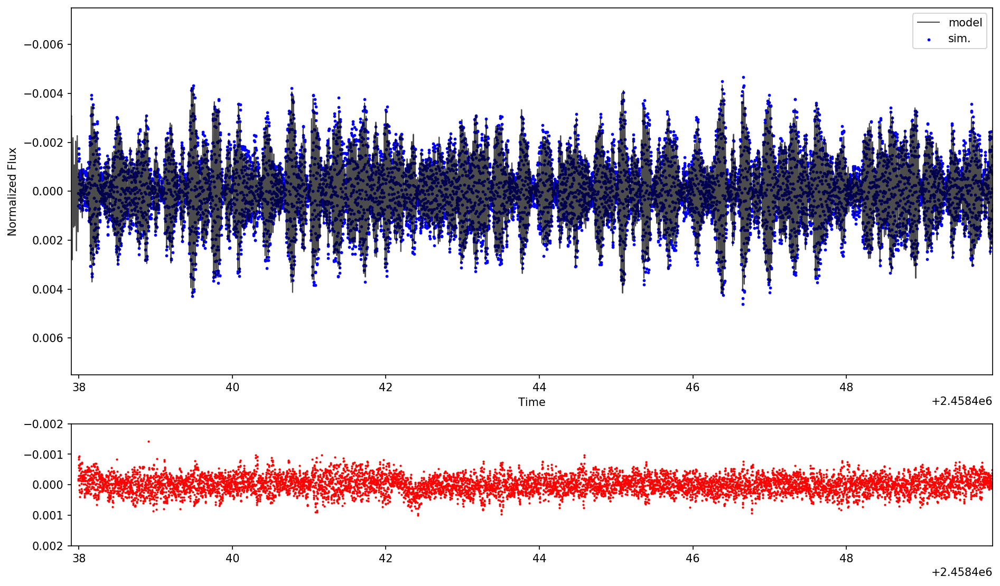

In [44]:
#AS

f_TESS = f_TESS04[:20]
a_TESS = a_TESS04[:20]
p_TESS = p_TESS04[:20]

T0 = 1.437992888476919461e+03

p_TESS_test = []
for i in range(20):
    p_TESS_test.append((-(2457000+T0)*f_TESS[i]+p_TESS[i])%1)
p_TESS_test = np.array(p_TESS_test)

p_TESS = p_TESS_test


# lower = min(times)+30
# upper = min(times)+31

m1 = times < upper
m2 = times > lower
m0 = m1 & m2


model = lc_model(f_TESS, a_TESS, p_TESS*2*np.pi, lower, upper, 2/1440/20)



model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times[m0], 0)

#Plot
fig, ax = plt.subplots(2, 1, figsize=(15, 9), gridspec_kw = {'height_ratios':[3, 1]})

ax[0].scatter(times, mags, s=3, c='b', label = 'sim.')
#ax.scatter(lc_rand[3], lc_rand[5], s=3, c='r')
ax[0].plot(model[3], model[4], c='k', linewidth=1, label = 'model',alpha=0.7)


ax[0].set_xlabel('Time')
ax[0].set_ylabel('Normalized Flux')

ax[1].scatter(times[m0], mags[m0]-model_times[4], s=1, c='r')

ax[0].set_ylim(-0.0075, 0.0075)
ax[1].set_ylim(-0.002, 0.002)

for i in range(2):
    ax[i].set_xlim(lower, upper)
    ax[i].invert_yaxis()

#ax[0].set_ylim(min(y[m0])-(max(y[m0])-min(y[m0]))*0.15, max(y[m0])+(max(y[m0])-min(y[m0]))*0.15)
#ax[1].set_ylim((min(y[m0])-(max(y[m0])-min(y[m0]))*0.15)/3, (max(y[m0])+(max(y[m0])-min(y[m0]))*0.15)/3)



ax[0].legend()

#plt.savefig('c20_57.png')

# GAUSSIAN

In [45]:
import os
datadir = os.getcwd()
datafile = '/freqs_table_m_gauss.txt'

f_TESS04, a_TESS04, p_TESS04 = np.loadtxt(datadir+datafile, usecols=(0,1,2)).T

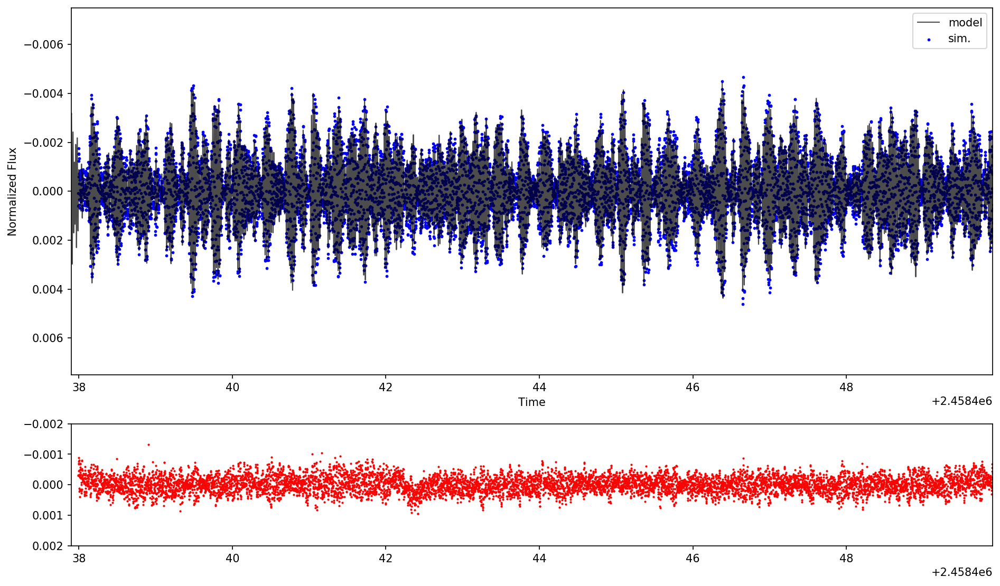

In [46]:
#AS

f_TESS = f_TESS04[:20]
a_TESS = a_TESS04[:20]
p_TESS = p_TESS04[:20]

p_TESS_test = []
for i in range(20):
    p_TESS_test.append((-2457000*f_TESS04[i]+p_TESS04[i])%1)
p_TESS_test = np.array(p_TESS_test)

p_TESS = p_TESS_test


# lower = min(times)+30
# upper = min(times)+31

m1 = times < upper
m2 = times > lower
m0 = m1 & m2


model = lc_model(f_TESS, a_TESS, p_TESS*2*np.pi, lower, upper, 2/1440/20)
model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times[m0], 0)

#Plot
fig, ax = plt.subplots(2, 1, figsize=(15, 9), gridspec_kw = {'height_ratios':[3, 1]})

ax[0].scatter(times, mags, s=3, c='b', label = 'sim.')
#ax.scatter(lc_rand[3], lc_rand[5], s=3, c='r')
ax[0].plot(model[3], model[4], c='k', linewidth=1, label = 'model',alpha=0.7)


ax[0].set_xlabel('Time')
ax[0].set_ylabel('Normalized Flux')

ax[1].scatter(times[m0], mags[m0]-model_times[4], s=1, c='r')


ax[0].set_ylim(-0.0075, 0.0075)
ax[1].set_ylim(-0.002, 0.002)

for i in range(2):
    ax[i].set_xlim(lower, upper)
    ax[i].invert_yaxis()

#ax[0].set_ylim(min(y[m0])-(max(y[m0])-min(y[m0]))*0.15, max(y[m0])+(max(y[m0])-min(y[m0]))*0.15)
#ax[1].set_ylim((min(y[m0])-(max(y[m0])-min(y[m0]))*0.15)/3, (max(y[m0])+(max(y[m0])-min(y[m0]))*0.15)/3)


ax[0].legend()

#plt.savefig('c20_gaussian.png')

# Back to Good Old FREQS

In [12]:
print('Calculate AS')
#AS
freq, amp = AS(times, mags, 15)

freq=freq[5000:]
amp=amp[5000:]

# PEAKS
max_power = amp.max()

peaks, _ = find_peaks(amp, height=max_power*0.02, distance=200)

# FREQS SORTED BY AMPLITUDE
sort_idx = np.argsort(amp[peaks])[::-1]
f_TESS = freq[peaks][sort_idx]
a_TESS = amp[peaks][sort_idx]
print(len(f_TESS))


print('Calculate Phases')
# PHASES
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)



# SELECT HOW MANY FREQS FOR COMPARISON

n = 20

f_TESS = f_TESS[:20]
a_TESS = a_TESS[:20]
p_TESS = p_TESS[:20]

Calculate AS
82
Calculate Phases


# Correlated noise

In [427]:
import numpy as np

length = 10000
nn = 1

noises = []
t_noises = []
for i in range(nn): 
    noise = np.random.normal(0,1,length)
    t_noise = np.arange(len(noise))
    noises.append(noise)
    t_noises.append(t_noise)

In [428]:
#binning fuction\n",
def bins(time, flux, binsize):
    n_bins = len(time) // binsize
    indexes = np.array_split(np.arange(len(time)), n_bins)
    #print((indexes[0]).size)
    binned_time = np.array([np.mean(time[a]) for a in indexes])
    binned_flux = np.array([np.mean(flux[a]) for a in indexes])
    binned_flux_err = np.array([np.std(flux[a])/np.sqrt(a.size) for a in indexes])
    rms = np.sqrt(np.mean(binned_flux**2))
    return (binned_time, binned_flux, binned_flux_err, rms)

In [445]:
#iters = np.concatenate((np.linspace(1, 10, 10), np.linspace(10, 100, 100), np.linspace(100, 1000, 1000), np.linspace(1000, length, 200)), axis=None)
iters = np.logspace(0, np.log10(length), 1000)

In [446]:
# i = 1 -> n_bin = len(dataset)
# So if Gaussian: rms = 1

rmsss = []
n_binss = []

for ii in range(nn):
    rmss = []
    n_bins = []
    for i in iters:
        #print(i)
        #print(len(t_noise) // i)
        n_bins.append(len(t_noises[ii]) // i)
        #print(bins(t_noise, noise, i)[3])
        rmss.append(bins(t_noises[ii], noises[ii], i)[3])

    rmss = np.array(rmss)
    n_bins = np.array(n_bins)
    
    rmsss.append(rmss)
    n_binss.append(n_bins)

In [447]:
x_sqrtN = np.linspace(1,length, 10)
y_sqrtN = x_sqrtN**(-1/2)

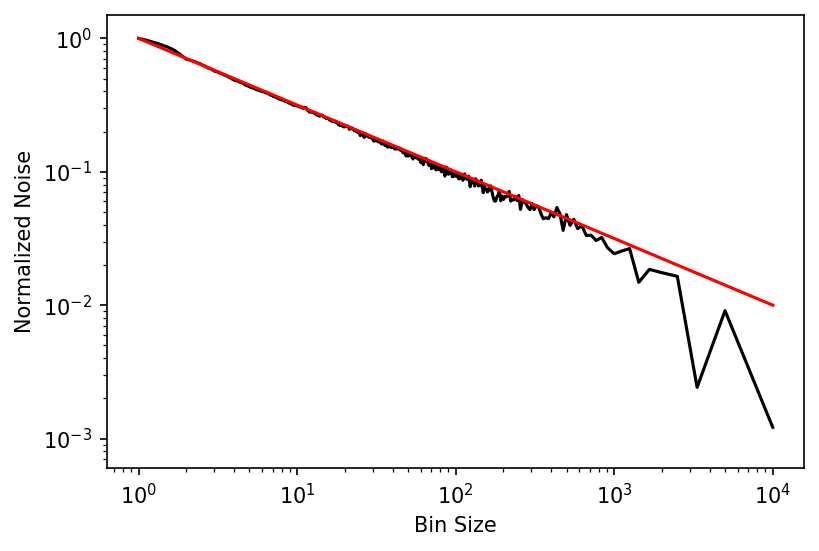

In [448]:
for ii in range(nn):
    plt.plot(len(noises[ii])/n_binss[ii], rmsss[ii]/rmsss[ii][0], c='k')#c='C{0}'.format(ii))
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Bin Size')
    plt.ylabel('Normalized Noise')

    plt.ylim((rmsss[ii][-1])/2, 1.5)    
plt.plot(x_sqrtN, y_sqrtN, c='r')

plt.savefig('corrnoise13.png')

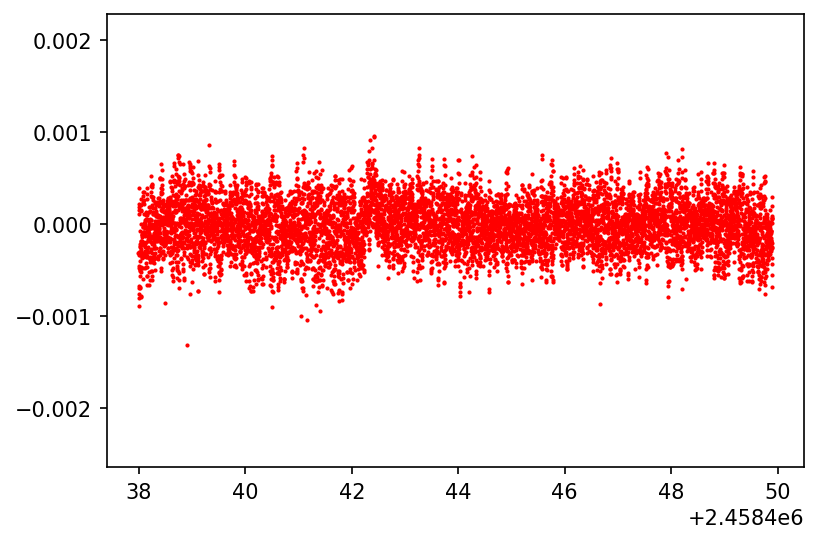

In [18]:
plt.scatter(times[m0], mags[m0]-model_times[4], s=1, c='r')

In [461]:
t_noise = times[m0]
noise = mags[m0]-model_times[4]



length = len(t_noise)
iters = np.logspace(0, np.log10(length)-0.1, 100)


rmss = []
n_bins = []

for i in log_progress(iters):
    #print(i)
    #print(len(t_noise) // i)
    n_bins.append(len(t_noise) // i)
    #print(bins(t_noise, noise, i)[3])
    rmss.append(bins(t_noise, noise, i)[3])

rmss = np.array(rmss)
n_bins = np.array(n_bins)

In [462]:
x_sqrtN = np.linspace(1,length, 10)
y_sqrtN = x_sqrtN**(-1/2)

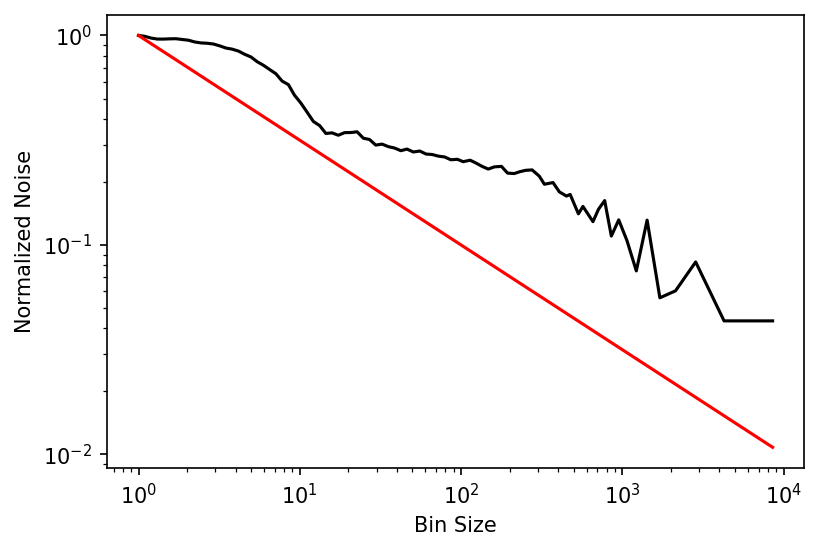

In [463]:
for ii in range(nn):
    plt.plot(len(noise)/n_bins, rmss/rmss[0], c='k')#c='C{0}'.format(ii))
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Bin Size')
    plt.ylabel('Normalized Noise')

    #plt.ylim((rmss[-1])/2, 1.5)    
plt.plot(x_sqrtN, y_sqrtN, c='r')

plt.savefig('corrnoise14.png')

Text(0, 0.5, 'Inst. Magnitudes [mag]')

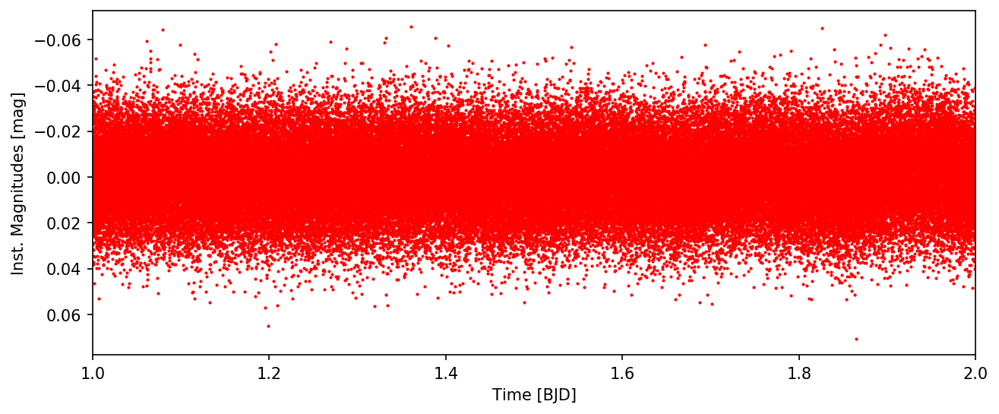

In [501]:
precision_ppm = 15000
precision = precision_ppm * 1e-6

model_tmp = []
times_tmp = np.linspace(1, 2, 100000)

tmp = lc_model_times(f_TESS/10, a_TESS, p_TESS*2*np.pi, times_tmp, precision)
model_tmp.append(tmp[4])

fig, ax = plt.subplots(1, 1, figsize=(10, 4))
x_tmp = np.linspace(1,2,1500)
y_tmp = lc_model_times(f_TESS/10, a_TESS, p_TESS*2*np.pi, x_tmp, 0)
ax.plot(x_tmp, y_tmp[4], c='k', zorder=0, lw=0.5)
ax.scatter(times_tmp, model_tmp, s=1, c='r')
ax.set_xlim(1,2)

ax.invert_yaxis()

ax.set_xlabel('Time [BJD]')
ax.set_ylabel('Inst. Magnitudes [mag]')

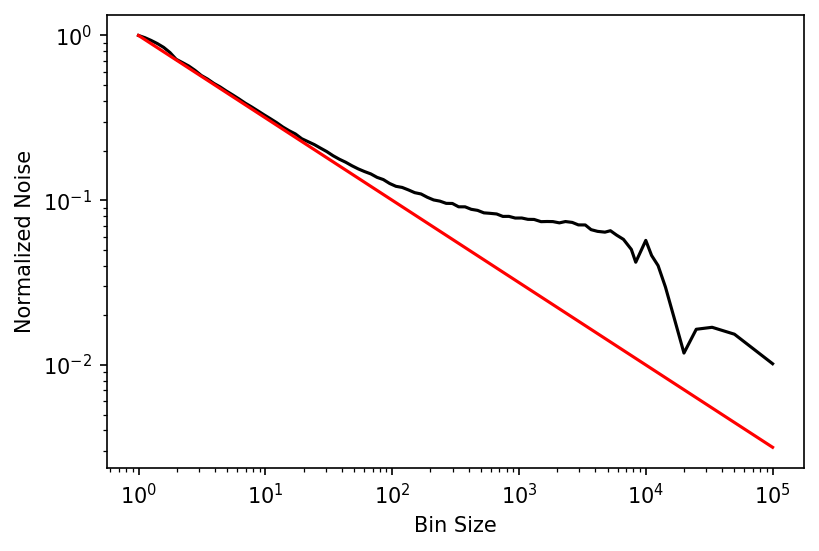

In [502]:
t_noise = times_tmp
noise = model_tmp[0]

length = len(t_noise)
iters = np.logspace(0, np.log10(length)-0.1, 100)

rmss = []
n_bins = []

for i in log_progress(iters):
    #print(i)
    #print(len(t_noise) // i)
    n_bins.append(len(t_noise) // i)
    #print(bins(t_noise, noise, i)[3])
    rmss.append(bins(t_noise, noise, i)[3])

rmss = np.array(rmss)
n_bins = np.array(n_bins)


x_sqrtN = np.linspace(1,length, 10)
y_sqrtN = x_sqrtN**(-1/2)


for ii in range(nn):
    plt.plot(len(noise)/n_bins, rmss/rmss[0], c='k')#c='C{0}'.format(ii))
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Bin Size')
    plt.ylabel('Normalized Noise')

    #plt.ylim((rmss[-1])/2, 1.5)    
plt.plot(x_sqrtN, y_sqrtN, c='r')

plt.savefig('corrnoise15.png')

# Calculate Noise for TESS

SearchResult containing 4 data products.

target_name                     productFilename                     description  distance
----------- ------------------------------------------------------- ------------ --------
  270577175 tess2018292075959-s0004-0000000270577175-0124-s_lc.fits Light curves      0.0
  270577175 tess2018319095959-s0005-0000000270577175-0125-s_lc.fits Light curves      0.0
  270577175 tess2018349182459-s0006-0000000270577175-0126-s_lc.fits Light curves      0.0
  270577175 tess2019006130736-s0007-0000000270577175-0131-s_lc.fits Light curves      0.0
[TessLightCurveFile(TICID: 270577175), TessLightCurveFile(TICID: 270577175), TessLightCurveFile(TICID: 270577175)]


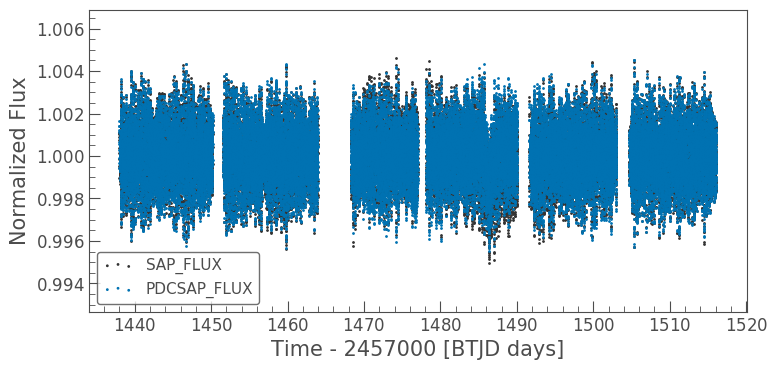

In [138]:
for name in ['beta Pictoris']:
    sr = lk.search_lightcurvefile(name)
    print(sr)

    if len(sr) > 0:

        #Download data
        lcfs = sr.download_all()

        lcfs = lcfs[1:4]
        print(lcfs)
        
        # Use the normalized PDCSAP_FLUX
        lc0 = lcfs[0].SAP_FLUX.normalize()
        lc1 = lcfs[0].PDCSAP_FLUX.normalize()

        # Loop through the rest of the LCFS, appending to the first light curve
        for lcf in lcfs[1:]:
            lc0 = lc0.append(lcf.SAP_FLUX.normalize())
            lc1 = lc1.append(lcf.PDCSAP_FLUX.normalize())

        #Remove bad quality and nans
        q0 = lc0.quality == 0
        lc0 = lc0[q0].remove_nans()
        q1 = lc1.quality == 0
        lc1 = lc1[q1].remove_nans()
        #Plot data
        ax = lc0.scatter(label = 'SAP_FLUX')
        lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')

        
        #Times & Mags
        times = lc1.time + 2457000
        mags = -2.5 * np.log10(lc1.flux)
        mags = mags - np.median(mags)
        
        x = times
        y = mags

In [137]:
## Flux ppm

In [98]:
t_mask1 = times < 1488+ 2457000
t_mask2 = times > 1485+ 2457000
t_mask = t_mask1 & t_mask2

In [110]:
hour = 1/24

s1 = 1442.1 - hour
e1 = 1442.7 + hour
s2 = 1458.7 - hour
e2 = 1459.8 + hour
s3 = 1485.7 - hour
e3 = 1488.3 + hour

t = times
f = mags

time_mask1 = (s1 < t) & (t < e1)
time_mask2 = (s2 < t) & (t < e2)
time_mask3 = (s3 < t) & (t < e3)

time_maskS4 = t < 1437.8


mask_comets = ~time_mask1 & ~time_mask2 & ~time_mask3

mask_no4c1 = mask_comets & ~time_maskS4

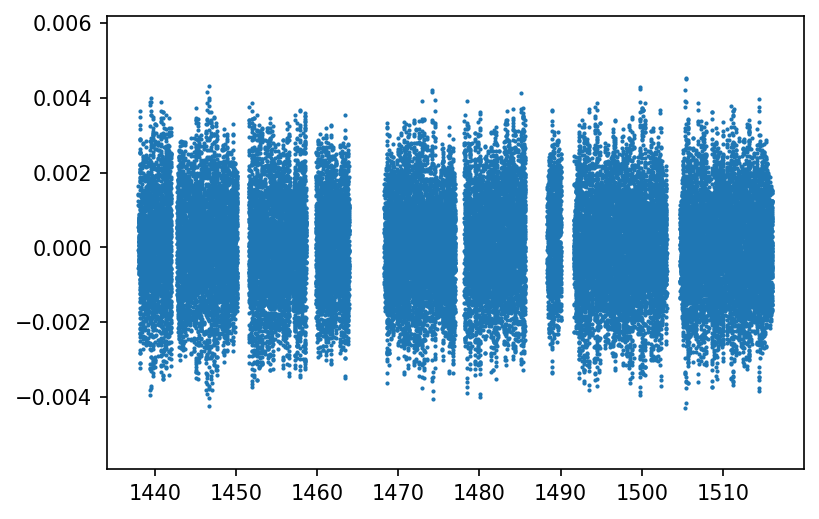

In [113]:
times = times[mask_no4c1]
mags = mags[mask_no4c1]

plt.scatter(times, mags, s=1)
#plt.xlim(1485+ 2457000, 1495+ 2457000)

In [114]:
#Amplitude Spectrum Function
def AS(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(df, 360, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))

In [115]:
freq, amp = AS(times, mags, 10)

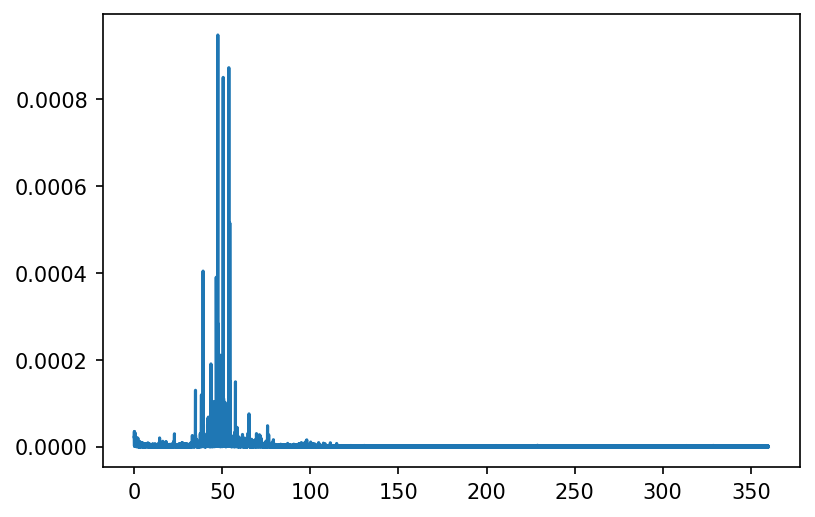

In [116]:
plt.plot(freq, amp)

In [117]:
half = min(np.arange(0, len(freq))[freq > 150])

In [154]:
def rms(array):
    array = np.array(array)
    tmp = np.sqrt(np.mean((array-np.mean(array))**2))
    return tmp

In [119]:
np.mean(amp[half:])/np.sqrt(np.pi/len(times))*1e6

100.43075529167064

In [120]:
np.median(amp[half:])/np.sqrt(np.pi/len(times))*1e6

94.0488344656323

In [121]:
2*rms(amp[half:])/np.sqrt(np.pi/len(times))*1e6

106.14848381863409

In [122]:
100.430/np.sqrt(30)

18.335925483414613

In [139]:
# MAgs

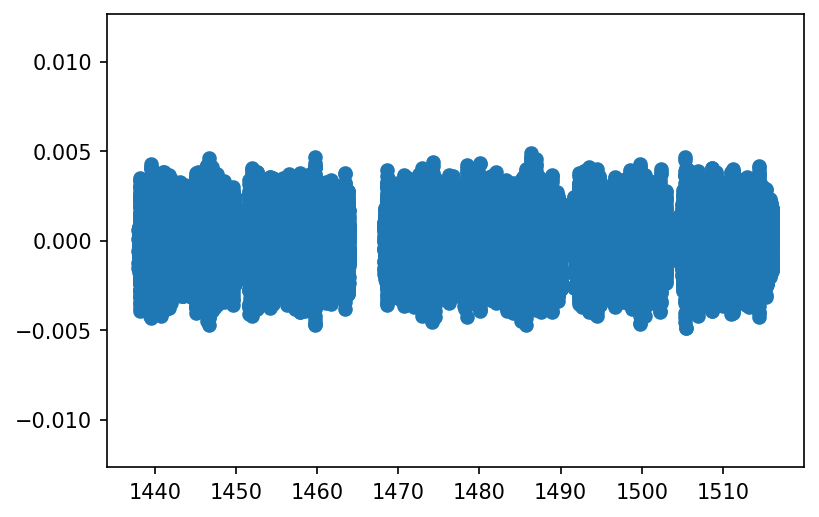

In [142]:
plt.scatter(times, mags)

In [141]:
times = times - 2457000


In [143]:
hour = 1/24

s1 = 1442.1 - hour
e1 = 1442.7 + hour
s2 = 1458.7 - hour
e2 = 1459.8 + hour
s3 = 1485.7 - hour
e3 = 1488.3 + hour

t = times
f = mags

time_mask1 = (s1 < t) & (t < e1)
time_mask2 = (s2 < t) & (t < e2)
time_mask3 = (s3 < t) & (t < e3)

time_maskS4 = t < 1437.8


mask_comets = ~time_mask1 & ~time_mask2 & ~time_mask3

mask_no4c1 = mask_comets & ~time_maskS4

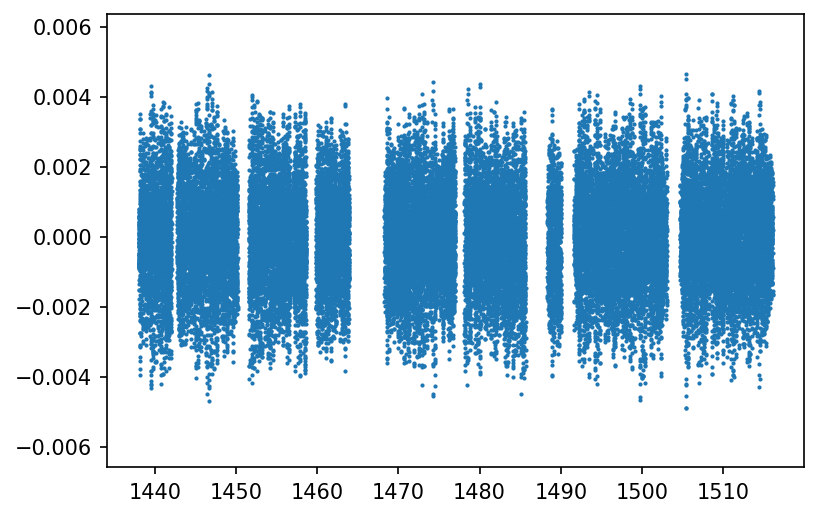

In [144]:
times = times[mask_no4c1]
mags = mags[mask_no4c1]

plt.scatter(times, mags, s=1)
#plt.xlim(1485+ 2457000, 1495+ 2457000)

In [145]:
#Amplitude Spectrum Function
def AS(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(df, 360, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))

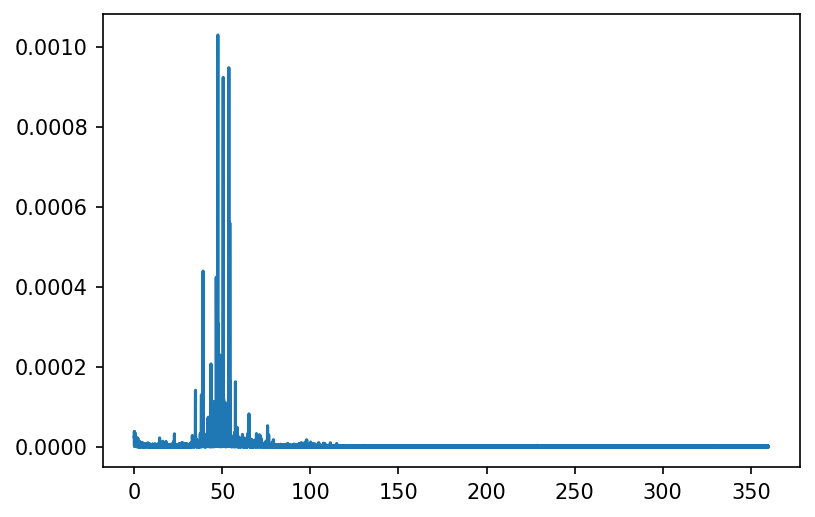

In [146]:
freq, amp = AS(times, mags, 10)
plt.plot(freq, amp)

In [151]:
half = min(np.arange(0, len(freq))[freq > 150])
print(np.mean(amp[half:])/np.sqrt(np.pi/len(times)))
print(np.mean(amp[half:])/np.sqrt(np.pi/len(times))/np.sqrt(30))

0.00010903906324497161
1.99077181961678e-05


In [156]:
2.5*np.log10(1+100.43075529167064*1e-6)*1e6

109.03583190751242

# Get Kepler Timestamps

# SC

# 0 to 17

SearchResult containing 18 data products.

 target_name            productFilename                        description             distance
------------- ------------------------------------ ----------------------------------- --------
kplr010730618 kplr010730618-2009131105131_llc.fits  Lightcurve Long Cadence (CLC) - Q0      0.0
kplr010730618 kplr010730618-2009166043257_llc.fits  Lightcurve Long Cadence (CLC) - Q1      0.0
kplr010730618 kplr010730618-2009259160929_llc.fits  Lightcurve Long Cadence (CLC) - Q2      0.0
kplr010730618 kplr010730618-2009350155506_llc.fits  Lightcurve Long Cadence (CLC) - Q3      0.0
kplr010730618 kplr010730618-2010078095331_llc.fits  Lightcurve Long Cadence (CLC) - Q4      0.0
kplr010730618 kplr010730618-2010174085026_llc.fits  Lightcurve Long Cadence (CLC) - Q5      0.0
kplr010730618 kplr010730618-2010265121752_llc.fits  Lightcurve Long Cadence (CLC) - Q6      0.0
kplr010730618 kplr010730618-2010355172524_llc.fits  Lightcurve Long Cadence (CLC) - Q7      0

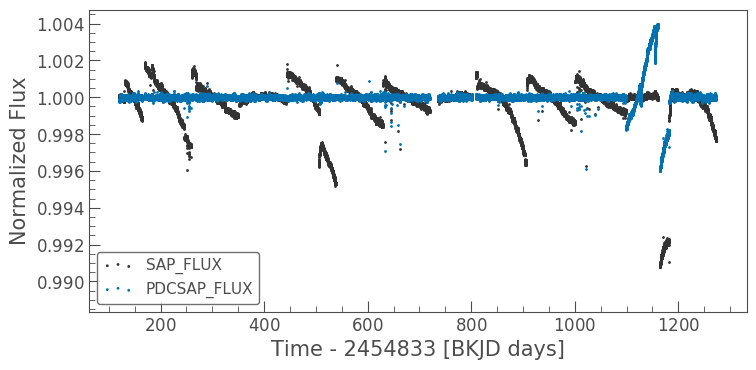

In [33]:
sr05 = lk.search_lightcurvefile('KIC 10730618', cadence='short', mission='Kepler')
print(sr05)
print(sr05[:14])

#Download data
print('Download')
lcfs = sr05[:14].download_all()

# Use the normalized PDCSAP_FLUX
print('Normalize')
lc005 = lcfs[0].SAP_FLUX.normalize()
lc105 = lcfs[0].PDCSAP_FLUX.normalize()

# Loop through the rest of the LCFS, appending to the first light curve
print('Looping')
for lcf in lcfs[1:]:
    lc005 = lc005.append(lcf.SAP_FLUX.normalize())
    lc105 = lc105.append(lcf.PDCSAP_FLUX.normalize())

#Plot data
print('Ploting')
ax = lc005.scatter(label = 'SAP_FLUX')
lc105.scatter(ax=ax, label = 'PDCSAP_FLUX')

#Times & Mags
times_KIC05 = lc105.time

# 6 to 17

SearchResult containing 39 data products.

 target_name            productFilename                        description              distance
------------- ------------------------------------ ------------------------------------ --------
kplr001435467 kplr001435467-2009259162342_slc.fits  Lightcurve Short Cadence (CSC) - Q2      0.0
kplr001435467 kplr001435467-2010111051353_slc.fits  Lightcurve Short Cadence (CSC) - Q5      0.0
kplr001435467 kplr001435467-2010140023957_slc.fits  Lightcurve Short Cadence (CSC) - Q5      0.0
kplr001435467 kplr001435467-2010174090439_slc.fits  Lightcurve Short Cadence (CSC) - Q5      0.0
kplr001435467 kplr001435467-2010203174610_slc.fits  Lightcurve Short Cadence (CSC) - Q6      0.0
kplr001435467 kplr001435467-2010234115140_slc.fits  Lightcurve Short Cadence (CSC) - Q6      0.0
kplr001435467 kplr001435467-2010265121752_slc.fits  Lightcurve Short Cadence (CSC) - Q6      0.0
kplr001435467 kplr001435467-2010296114515_slc.fits  Lightcurve Short Cadence (CSC) -

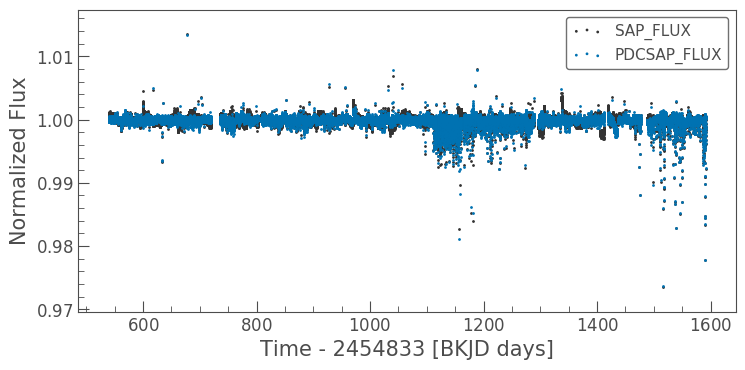

In [90]:
sr617 = lk.search_lightcurvefile('KIC 1435467', cadence='short', mission='Kepler')
print(sr617)
print(sr617[-35:])

#Download data
print('Download')
lcfs = sr617[-35:].download_all()

# Use the normalized PDCSAP_FLUX
print('Normalize')
lc0617 = lcfs[0].SAP_FLUX.normalize()
lc1617 = lcfs[0].PDCSAP_FLUX.normalize()

# Loop through the rest of the LCFS, appending to the first light curve
print('Looping')
for lcf in lcfs[1:]:
    lc0617 = lc0617.append(lcf.SAP_FLUX.normalize())
    lc1617 = lc1617.append(lcf.PDCSAP_FLUX.normalize())

#Plot data
print('Ploting')
ax = lc0617.scatter(label = 'SAP_FLUX')
lc1617.scatter(ax=ax, label = 'PDCSAP_FLUX')

#Times & Mags
times_KIC617 = lc1617.time

In [140]:
times_KIC = np.concatenate((times_KIC05+2454833, times_KIC617+2454833), axis=None)

datapairs = np.stack((times_KIC), axis = -1)
np.savetxt('times_KIC.txt', datapairs)

In [13]:
import os
datadir = os.getcwd()
datafile = '/times_KIC.txt'

times_KIC_load = np.loadtxt(datadir+datafile, usecols=(0)).T

In [143]:
len(times_KIC) == sum(times_KIC == times_KIC_load)

True

In [14]:
times_KIC = times_KIC_load

In [519]:
np.median(np.diff(times_KIC))*1440

0.9808073937892914

In [520]:
max(times_KIC)-min(times_KIC)

1470.4823254891671

In [521]:
(max(times_KIC)-min(times_KIC))/np.median(np.diff(times_KIC))

2158930.0428533535

In [522]:
len(times_KIC)

1977079

In [523]:
len(times_KIC)/((max(times_KIC)-min(times_KIC))/np.median(np.diff(times_KIC)))

0.9157679780058969

# LC

SearchResult containing 18 data products.

 target_name            productFilename                        description             distance
------------- ------------------------------------ ----------------------------------- --------
kplr010730618 kplr010730618-2009131105131_llc.fits  Lightcurve Long Cadence (CLC) - Q0      0.0
kplr010730618 kplr010730618-2009166043257_llc.fits  Lightcurve Long Cadence (CLC) - Q1      0.0
kplr010730618 kplr010730618-2009259160929_llc.fits  Lightcurve Long Cadence (CLC) - Q2      0.0
kplr010730618 kplr010730618-2009350155506_llc.fits  Lightcurve Long Cadence (CLC) - Q3      0.0
kplr010730618 kplr010730618-2010078095331_llc.fits  Lightcurve Long Cadence (CLC) - Q4      0.0
kplr010730618 kplr010730618-2010174085026_llc.fits  Lightcurve Long Cadence (CLC) - Q5      0.0
kplr010730618 kplr010730618-2010265121752_llc.fits  Lightcurve Long Cadence (CLC) - Q6      0.0
kplr010730618 kplr010730618-2010355172524_llc.fits  Lightcurve Long Cadence (CLC) - Q7      0

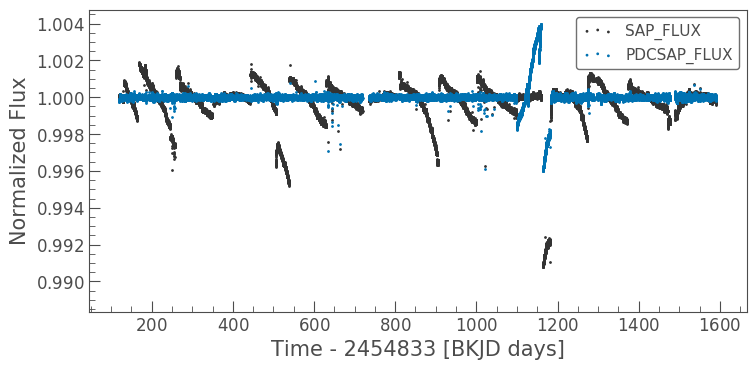

In [34]:
sr017 = lk.search_lightcurvefile('KIC 10730618', cadence='long', mission='Kepler')
print(sr017)

#Download data
print('Download')
lcfs = sr017.download_all()

# Use the normalized PDCSAP_FLUX
print('Normalize')
lc0017 = lcfs[0].SAP_FLUX.normalize()
lc1017 = lcfs[0].PDCSAP_FLUX.normalize()

# Loop through the rest of the LCFS, appending to the first light curve
print('Looping')
for lcf in lcfs[1:]:
    lc0017 = lc0017.append(lcf.SAP_FLUX.normalize())
    lc1017 = lc1017.append(lcf.PDCSAP_FLUX.normalize())

#Plot data
print('Ploting')
ax = lc0017.scatter(label = 'SAP_FLUX')
lc1017.scatter(ax=ax, label = 'PDCSAP_FLUX')

#Times & Mags
times_KIC017 = lc1017.time

In [36]:
times_KIC_LC = np.concatenate((times_KIC017+2454833), axis=None)

datapairs = np.stack((times_KIC_LC), axis = -1)
np.savetxt('times_KIC_LC.txt', datapairs)

In [125]:
import os
datadir = os.getcwd()
datafile = '/times_KIC_LC.txt'

times_KIC_load = np.loadtxt(datadir+datafile, usecols=(0)).T

In [38]:
len(times_KIC_LC) == sum(times_KIC_LC == times_KIC_load)

True

In [126]:
times_KIC_LC = times_KIC_load

In [511]:
np.median(np.diff(times_KIC_LC))*1440

29.424438402056694

In [512]:
max(times_KIC_LC)-min(times_KIC_LC)

1470.4624541755766

In [514]:
(max(times_KIC_LC)-min(times_KIC_LC))/np.median(np.diff(times_KIC_LC))

71962.83256386041

In [515]:
len(times_KIC_LC)

65504

In [518]:
len(times_KIC_LC)/((max(times_KIC_LC)-min(times_KIC_LC))/np.median(np.diff(times_KIC_LC)))

0.9102476607194583

# Eccentricity Simultion

In [159]:
f_TESS

array([47.43903298, 53.69160236, 50.49211222])

In [161]:
a_TESS*1e6

array([1043.481152  ,  969.708189  ,  932.40262608])

In [36]:
#noise_TESS_mag = 19.91*np.sqrt(60)*1e-6
noise_TESS_mag = 20*np.sqrt(60)*1e-6

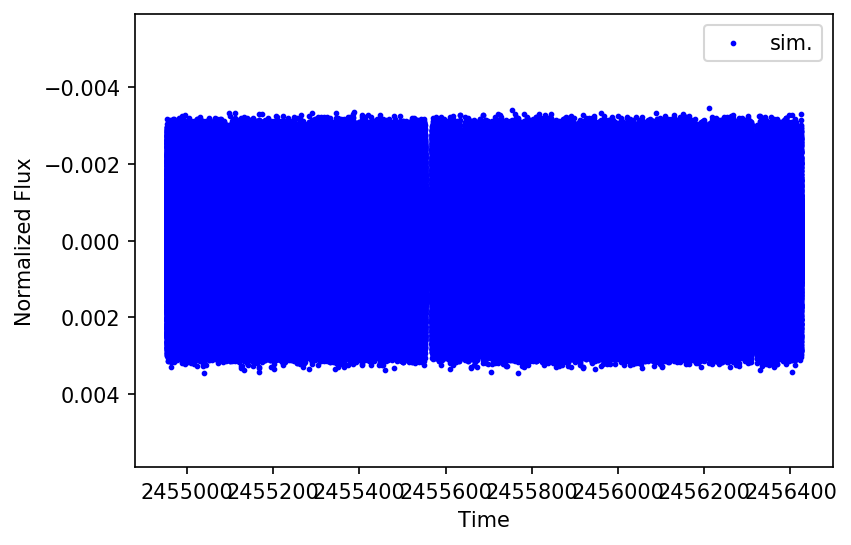

In [37]:
#Phases

f_TESS = f_TESS[:9]
a_TESS = a_TESS[:9]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_KIC, noise_TESS_mag)

#Plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.scatter(times_KIC, model_times[4], s=3, c='b', label = 'sim.')

ax.set_xlabel('Time')
ax.set_ylabel('Normalized Flux')
ax.legend()
ax.invert_yaxis()

#plt.savefig('posteriori.png')

(2455003, 2455004)

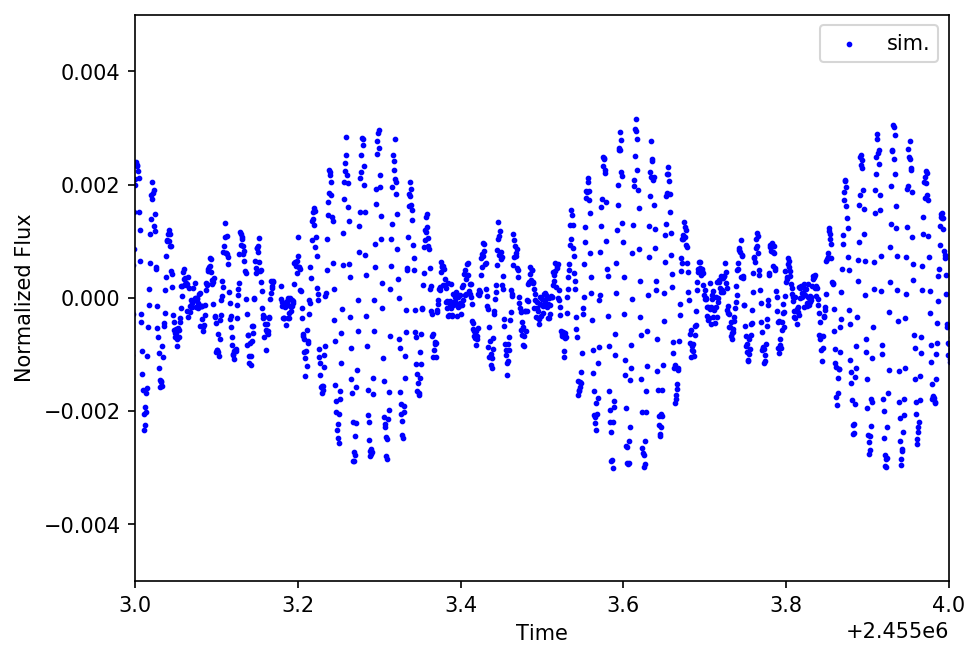

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(7, 5))

ax.scatter(times_KIC, model_times[4], s=3, c='b', label = 'sim.')

ax.set_xlabel('Time')
ax.set_ylabel('Normalized Flux')
ax.legend()
ax.invert_yaxis()

ax.set_ylim(-0.005, 0.005)
ax.set_xlim(2455003, 2455004)

#plt.savefig('3old-2.png')

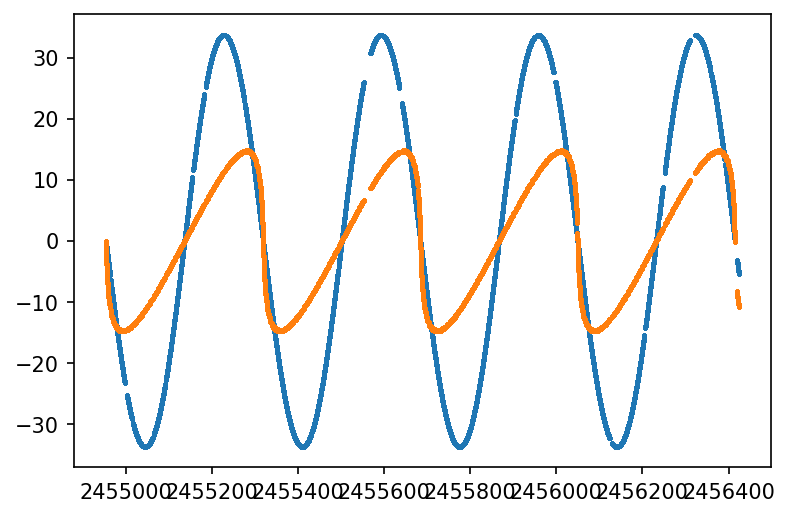

In [206]:
#_b
star_planet_ratio_b = 1.8 / 0.1
a2sini_b = 1.2164 * np.sin(np.deg2rad(90))
e_b = 0.00001
varpi_b = np.deg2rad(0)
Porb_b = 1*365.25
tp_b = min(times_KIC)

#_c
star_planet_ratio_c = 1.8 / 0.1
a2sini_c = 1.2164 * np.sin(np.deg2rad(90))
e_c = 0.9
varpi_c = np.deg2rad(0)
Porb_c = 1*365.25
tp_c = min(times_KIC)

y_tau_b = tau(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)

y_tau_c = tau(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

plt.scatter(times_KIC, (y_tau_b)*86400, s=1)
plt.scatter(times_KIC, (y_tau_c)*86400, s=1)
#plt.scatter(times_KIC, (y_tau_b + y_tau_c)*86400, s=1)

In [33]:
#https://stackoverflow.com/questions/14581358/getting-standard-errors-on-fitted-parameters-using-the-optimize-leastsq-method-i
def fit_leastsq_my(times, mags, freqs, amps, phs):
    
    pfit_all = []
    perr_all = []
    
    for i in range(len(freqs)):

        def model_new(freq):
            def f(x, p1, p2):
                return abs(p1) * np.sin(2. * np.pi * (freq * x + (p2)%1))
            return f
        
        def ff(x, p):
            return model_new(freqs[i])(x, *p)
        
        # These are initial guesses for fits:
        pstart = [amps[i], phs[i]]
    
        def fit_leastsq(p0, datax, datay, function):

            errfunc = lambda p, x, y: function(x,p) - y

            pfit, pcov, infodict, errmsg, success = optimize.leastsq(errfunc, p0, args=(datax, datay), full_output=1, epsfcn=0.0001)

            if (len(datay) > len(p0)) and pcov is not None:
                s_sq = (errfunc(pfit, datax, datay)**2).sum()/(len(datay)-len(p0))
                pcov = pcov * s_sq
            else:
                pcov = np.inf

            error = [] 
            for i in range(len(pfit)):
                try:
                    error.append(np.absolute(pcov[i][i])**0.5)
                except:
                    error.append( 0.00 )
            pfit_leastsq = pfit
            perr_leastsq = np.array(error) 
            return pfit_leastsq, perr_leastsq 

        pfit, perr = fit_leastsq(pstart, times, mags, ff)
        pfit_all.append(pfit)
        perr_all.append(perr)
        
    my_amps = np.array([pfit_all[i][0] for i in range(len(freqs))])
    my_phs = np.array([pfit_all[i][1] for i in range(len(freqs))])
    my_phs_err = np.array([perr_all[i][1] for i in range(len(freqs))])
    
    return(freqs, my_amps, my_phs, my_phs_err)

In [207]:
segment_size = 20

times_TD_b = times_KIC - y_tau_b
magnitudes_TD = model_times[4]

time_0 = times_TD_b[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays_b, time_delays_err_b, time_midpoints_b = [], [], []

t_edge = []

counter = 1
size=int((max(times_TD_b)-min(times_TD_b))//segment_size)

# Iterate over lightcurve
for t, y in zip(times_TD_b, magnitudes_TD):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if t - time_0 > segment_size:
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        time_midpoints_b.append(np.mean(time_slice))

        # And the phases for each frequency
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(sol)
        
        
        #print(phase_guess)
        phase.append(sol[2]*2*np.pi)
        phase_err.append(sol[3]*2*np.pi)
        
#         fig, ax = plt.subplots(1, 1, figsize=(7, 4))
#         AS_data = AS_TD(time_slice, mag_slice, 3)
#         freq_tmp = AS_data[0]
#         amp_tmp = AS_data[1]
#         ax.plot(freq_tmp, amp_tmp, c='k')
#         ax.set_ylim(35,60)
#         ax.set_ylim(0,0.0015)
#         plt.savefig('AS_seg{0}'.format(counter))
#         plt.close()
        
        time_0 = t
        time_slice, mag_slice = [], []

        t_edge.append(t)
        
        counter += 1
        
phase = np.array(phase).T
phase_err = np.array(phase_err).T

# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays_b.append(td-np.mean(td))
    time_delays_err_b.append(ph_err / (2*np.pi*f))

In [208]:
segment_size = 20

times_TD_c = times_KIC - y_tau_c
magnitudes_TD = model_times[4]

time_0 = times_TD_c[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays_c, time_delays_err_c, time_midpoints_c = [], [], []

t_edge = []

counter = 1
size=int((max(times_TD_c)-min(times_TD_c))//segment_size)

# Iterate over lightcurve
for t, y in zip(times_TD_c, magnitudes_TD):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if t - time_0 > segment_size:
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        time_midpoints_c.append(np.mean(time_slice))

        # And the phases for each frequency
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(sol)
        
        
        #print(phase_guess)
        phase.append(sol[2]*2*np.pi)
        phase_err.append(sol[3]*2*np.pi)
        
#         fig, ax = plt.subplots(1, 1, figsize=(7, 4))
#         AS_data = AS_TD(time_slice, mag_slice, 3)
#         freq_tmp = AS_data[0]
#         amp_tmp = AS_data[1]
#         ax.plot(freq_tmp, amp_tmp, c='k')
#         ax.set_ylim(35,60)
#         ax.set_ylim(0,0.0015)
#         plt.savefig('AS_seg{0}'.format(counter))
#         plt.close()
        
        time_0 = t
        time_slice, mag_slice = [], []

        t_edge.append(t)
        
        counter += 1
        
phase = np.array(phase).T
phase_err = np.array(phase_err).T

# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays_c.append(td-np.mean(td))
    time_delays_err_c.append(ph_err / (2*np.pi*f))

In [209]:
td_weighted_b = []
for i in range(len(time_midpoints_b)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_b)):
        #print(j)
        tds.append(time_delays_b[j][i])
        tds_err.append(time_delays_err_b[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted_b.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
td_weighted_b = np.array(td_weighted_b) 

In [210]:
td_weighted_c = []
for i in range(len(time_midpoints_c)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_c)):
        #print(j)
        tds.append(time_delays_c[j][i])
        tds_err.append(time_delays_err_c[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted_c.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
td_weighted_c = np.array(td_weighted_c) 

In [181]:
jds = []
for i in np.arange(2009, 2015, 1):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    print(t)
    print(t.jd)
    jds.append(t.jd[0])

['2009-01-01T12:00:00.000']
[2454833.]
['2010-01-01T12:00:00.000']
[2455198.]
['2011-01-01T12:00:00.000']
[2455563.]
['2012-01-01T12:00:00.000']
[2455928.]
['2013-01-01T12:00:00.000']
[2456294.]
['2014-01-01T12:00:00.000']
[2456659.]


In [259]:
max(y_tau_b_sim)*86400

33.708820046736584

In [260]:
min(y_tau_b_sim)*86400

-33.71487985691722

In [265]:
(max(y_tau_b_sim)*86400-min(y_tau_b_sim)*86400)/2

33.711849951826906

In [261]:
max(y_tau_c_sim)*86400

14.79651102607622

In [262]:
min(y_tau_c_sim)*86400

-14.578474273699763

In [264]:
max(y_tau_c_sim)*86400-min(y_tau_c_sim)*86400

29.374985299775982

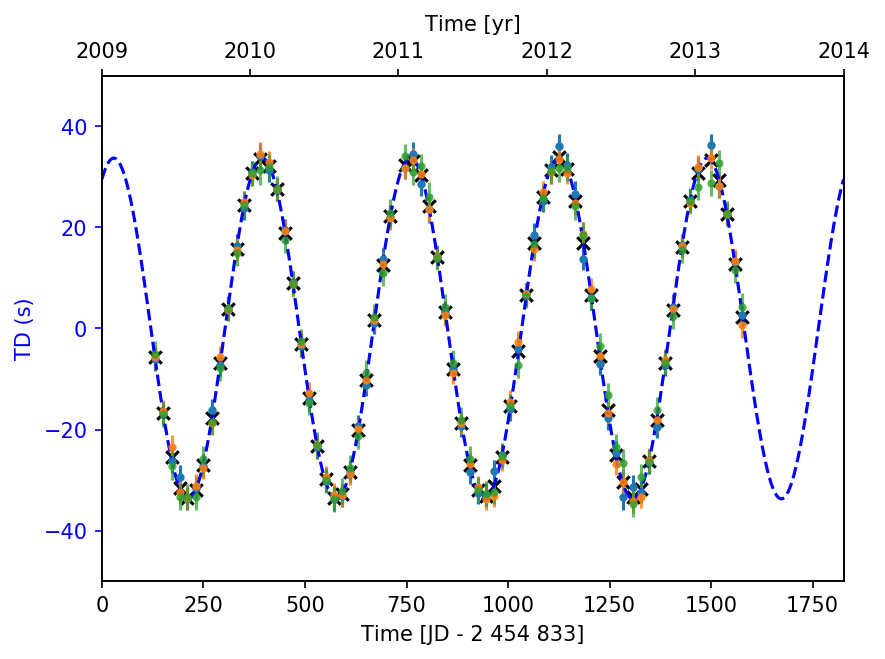

In [213]:
times_sim_b = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim = tau(times_sim_b, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2454833

t_2009 = jds[0] - time_offset
t_2010 = jds[1] - time_offset
t_2011 = jds[2] - time_offset
t_2012 = jds[3] - time_offset
t_2013 = jds[4] - time_offset
t_2014 = jds[5] - time_offset

ax1.plot(times_sim_b - time_offset, (y_tau_b_sim) *86400, 'b', label = "TD curve", ls = '--')
ax1.set_xlabel('Time [JD - 2 454 833]')
ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-50, 50)
ax1.set_xlim(t_2009, t_2014)

ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2009,t_2010,t_2011,t_2012,t_2013,t_2014])

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2009', '2010', '2011', '2012', '2013', '2014'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


y_tau_b_sim = tau(np.array(time_midpoints_b), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_offset_b = np.mean((y_tau_b_sim) *86400 - td_weighted_b*86400)
ax1.scatter(np.array(time_midpoints_b) - time_offset, td_weighted_b*86400+y_offset_b, marker='x', c='k')   

for i in range(3):
    ax1.errorbar(np.array(time_midpoints_b) - time_offset, time_delays_b[i]*86400+y_offset_b, yerr = time_delays_err_b[i]*86400, fmt='.', alpha = (a_TESS[i]/a_TESS[0])**3)


# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)





fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler2_LC-3212.png", dpi=400)

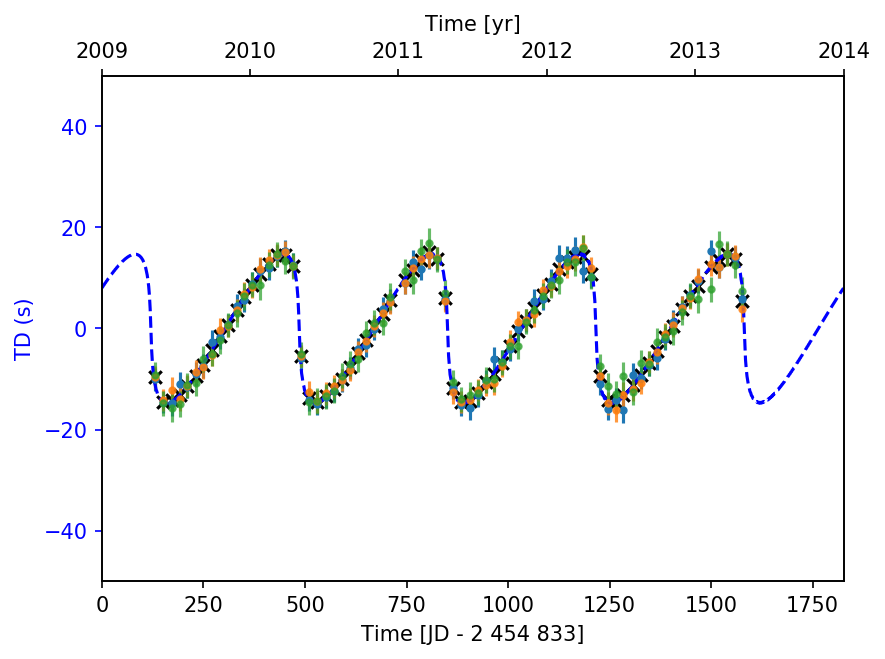

In [234]:
times_sim_c = np.linspace(jds[0], jds[-1], 1000)

y_tau_c_sim = tau(times_sim_c, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2454833

t_2009 = jds[0] - time_offset
t_2010 = jds[1] - time_offset
t_2011 = jds[2] - time_offset
t_2012 = jds[3] - time_offset
t_2013 = jds[4] - time_offset
t_2014 = jds[5] - time_offset

ax1.plot(times_sim_c - time_offset, (y_tau_c_sim) *86400, 'b', label = "TD curve", ls = '--')
ax1.set_xlabel('Time [JD - 2 454 833]')
ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-50, 50)
ax1.set_xlim(t_2009, t_2014)

ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2009,t_2010,t_2011,t_2012,t_2013,t_2014])

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2009', '2010', '2011', '2012', '2013', '2014'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


y_tau_c_sim = tau(np.array(time_midpoints_c), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
y_offset_c = np.mean((y_tau_c_sim) *86400 - td_weighted*86400)
ax1.scatter(np.array(time_midpoints_c) - time_offset, td_weighted_c*86400+y_offset_c, marker='x', c='k')   

for i in range(3):
    ax1.errorbar(np.array(time_midpoints_c) - time_offset, time_delays_c[i]*86400+y_offset_c, yerr = time_delays_err_c[i]*86400, fmt='.', alpha = (a_TESS[i]/a_TESS[0])**3)


# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)





fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler2_LC-3212.png", dpi=400)

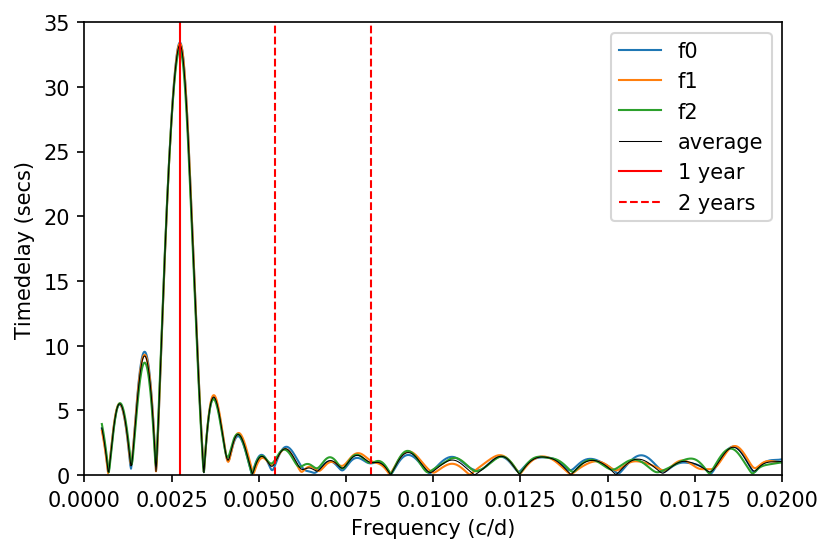

In [233]:
for i in range(3):
    freq_f0 = np.linspace(0.0005, 0.1, 5000)

    model_f0 = LombScargle(time_midpoints_b, time_delays_b[i])
    power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

    fct_f0 = np.sqrt(4 / len(time_midpoints_b))
    amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

    plt.plot(freq_f0, amp_f0*86400, linewidth = 1, label='f{0}'.format(i))
    

freq_f0 = np.linspace(0.0005, 0.1, 5000)

model_f0 = LombScargle(time_midpoints_b, td_weighted_b)
power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

fct_f0 = np.sqrt(4 / len(time_midpoints_b))
amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

plt.plot(freq_f0, amp_f0*86400, linewidth = 0.5, label='average', c='k')  

plt.xlim(0,0.02)
plt.ylim(0,35)

plt.axvline(1/365.25*1, linestyle='-', c='r', label='1 year', lw=1)
plt.axvline(1/365.25*2, linestyle='--', c='r', label='2 years', lw=1)
plt.axvline(1/365.25*3, linestyle='--', c='r', lw=1)
#plt.axvline(1/100*4, linestyle='--', c='r')
#plt.axvline(1/100*5, linestyle='--', c='r')
    
plt.xlabel('Frequency (c/d)')
plt.ylabel('Timedelay (secs)')

plt.legend()

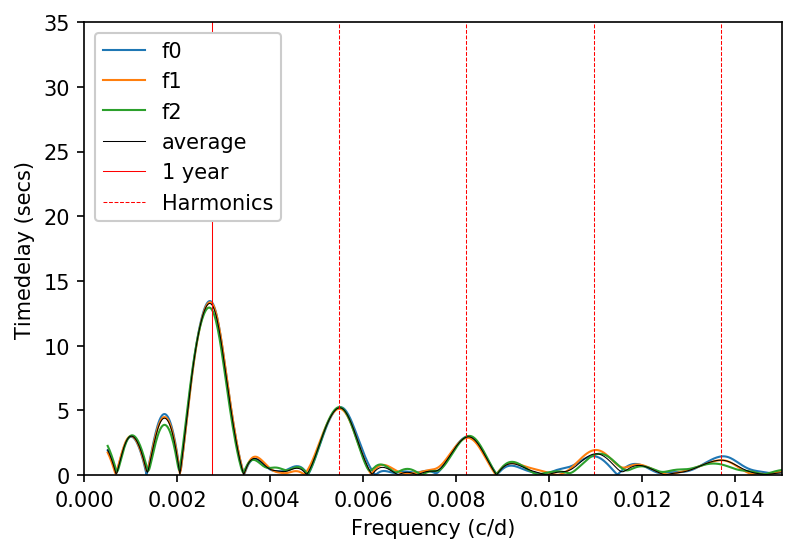

In [244]:
for i in range(3):
    freq_f0 = np.linspace(0.0005, 0.1, 5000)

    model_f0 = LombScargle(time_midpoints_c, time_delays_c[i])
    power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

    fct_f0 = np.sqrt(4 / len(time_midpoints_c))
    amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

    plt.plot(freq_f0, amp_f0*86400, linewidth = 1, label='f{0}'.format(i))
    

freq_f0 = np.linspace(0.0005, 0.1, 5000)

model_f0 = LombScargle(time_midpoints_c, td_weighted_c)
power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

fct_f0 = np.sqrt(4 / len(time_midpoints_c))
amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

plt.plot(freq_f0, amp_f0*86400, linewidth = 0.5, label='average', c='k')  

plt.xlim(0,0.015)
plt.ylim(0,35)

plt.axvline(1/365.25*1, linestyle='-', c='r', label='1 year', lw=0.5)
plt.axvline(1/365.25*2, linestyle='--', c='r', label='Harmonics', lw=0.5)
plt.axvline(1/365.25*3, linestyle='--', c='r', lw=0.5)
plt.axvline(1/365.25*4, linestyle='--', c='r', lw=0.5)
plt.axvline(1/365.25*5, linestyle='--', c='r', lw=0.5)
    
plt.xlabel('Frequency (c/d)')
plt.ylabel('Timedelay (secs)')

plt.legend(fancybox=True, framealpha=1)

#plt.legend()

In [300]:
import matplotlib.collections as collections
from matplotlib import cm

<Figure size 900x600 with 0 Axes>

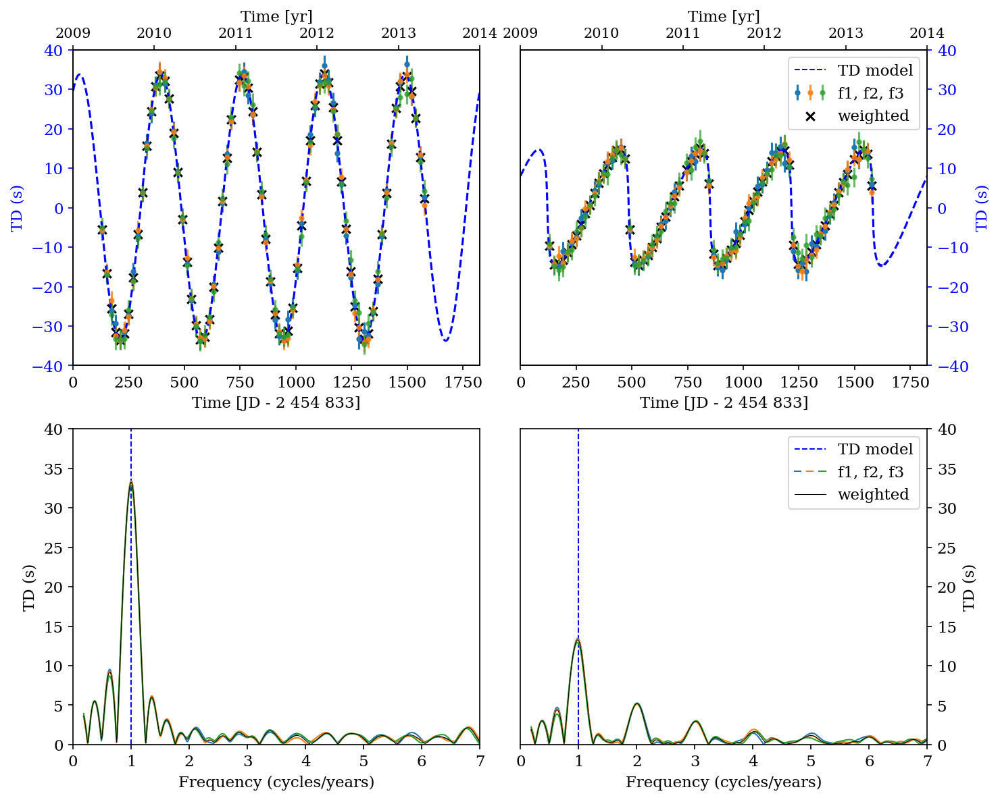

In [479]:
plt.rc('font', family='serif', size=11)
plt.tight_layout()

fig, ax = plt.subplots(2,2,figsize=(10,8),sharey=False)


times_sim_b = np.linspace(jds[0], jds[-1], 1000)
y_tau_b_sim = tau(times_sim_b, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)

times_sim_c = np.linspace(jds[0], jds[-1], 1000)
y_tau_c_sim = tau(times_sim_c, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

time_offset = 2454833

t_2009 = jds[0] - time_offset
t_2010 = jds[1] - time_offset
t_2011 = jds[2] - time_offset
t_2012 = jds[3] - time_offset
t_2013 = jds[4] - time_offset
t_2014 = jds[5] - time_offset

ax[0, 0].plot(times_sim_b - time_offset, (y_tau_b_sim) *86400, 'b', label = "TD model", ls = '--')
lns1 = ax[0, 1].plot(times_sim_c - time_offset, (y_tau_c_sim) *86400, 'b', label = "TD model", ls = '--')

for i in range(2):
    ax[0, i].set_xlabel('Time [JD - 2 454 833]')
    ax[0, i].set_ylabel('TD (s)', color='b')
    ax[0, i].tick_params('y', colors='b')
    ax[0, i].set_ylim(-40, 40)
    ax[0, i].set_xlim(t_2009, t_2014)

    ax2 = ax[0, i].twiny()
    ax2.tick_params(axis='x', rotation=0)

    ax2.set_xticks([t_2009,t_2010,t_2011,t_2012,t_2013,t_2014])
    
    xmin1, xmax1 = ax[0, i].get_xlim()
    ax2.set_xlim(xmin1,xmax1)
    ax2.set_xticklabels(['2009', '2010', '2011', '2012', '2013', '2014'], fontsize=10)

    ax2.set_xlabel('Time [yr]', labelpad=-200)
    ax2.xaxis.set_label_coords(0.5,1.09)

    

    
ax[0,1].yaxis.tick_right()
ax[0,1].yaxis.set_label_position("right")
ax[0,1].tick_params(axis='y', which='both', labelright=True,labelleft=False)    
#fig.subplots_adjust(hspace=0)

    

y_tau_b_sim = tau(np.array(time_midpoints_b), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_offset_b = np.mean((y_tau_b_sim) *86400 - td_weighted_b*86400)
ax[0, 0].scatter(np.array(time_midpoints_b) - time_offset, td_weighted_b*86400+y_offset_b, marker='x', c='k')   

for i in range(3):
    ax[0, 0].errorbar(np.array(time_midpoints_b) - time_offset, time_delays_b[i]*86400+y_offset_b, yerr = time_delays_err_b[i]*86400, fmt='.', alpha = (a_TESS[i]/a_TESS[0])**3)


y_tau_c_sim = tau(np.array(time_midpoints_c), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
y_offset_c = np.mean((y_tau_c_sim) *86400 - td_weighted_c*86400)
lns2 = ax[0, 1].scatter(np.array(time_midpoints_c) - time_offset, td_weighted_c*86400+y_offset_c, marker='x', c='k', label = 'weighted')   

leg_errbar =[]
for i in range(3):
    lns3 = ax[0, 1].errorbar(np.array(time_midpoints_c) - time_offset, time_delays_c[i]*86400+y_offset_c, yerr = time_delays_err_c[i]*86400, fmt='.', alpha = (a_TESS[i]/a_TESS[0])**3)
    leg_errbar.append(lns3)



ax[1,0].axvline(1, linestyle='--', lw=1, c= 'b', label = "TD model")
for i in range(3):
    freq_f0 = np.linspace(0.0005, 0.1, 5000)

    model_f0 = LombScargle(time_midpoints_b, time_delays_b[i])
    power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

    fct_f0 = np.sqrt(4 / len(time_midpoints_b))
    amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

    ax[1,0].plot(freq_f0*365.25, amp_f0*86400, linewidth = 1, label='f{0}'.format(i+1))
    

freq_f0 = np.linspace(0.0005, 0.1, 5000)

model_f0 = LombScargle(time_midpoints_b, td_weighted_b)
power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

fct_f0 = np.sqrt(4 / len(time_midpoints_b))
amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

ax[1,0].plot(freq_f0*365.25, amp_f0*86400, linewidth = 0.5, label = 'weighted', c='k')  

ax[1,0].set_xlim(0,7)
ax[1,0].set_ylim(0,40)


# ax[1,0].axvline(1/365.25*2, linestyle='--', c='r', label='2 years', lw=1)
# ax[1,0].axvline(1/365.25*3, linestyle='--', c='r', lw=1)
#plt.axvline(1/100*4, linestyle='--', c='r')
#plt.axvline(1/100*5, linestyle='--', c='r')
   
ax[1,0].set_xlabel('Frequency (cycles/years)')
ax[1,0].set_ylabel('TD (s)')

#ax[1,0].legend()


lns11 = ax[1,1].axvline(1, linestyle='--', lw=1, c= 'b', label = "TD model")

leg_lines = []

for i in range(3):
    freq_f0 = np.linspace(0.0005, 0.1, 5000)

    model_f0 = LombScargle(time_midpoints_c, time_delays_c[i])
    power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

    fct_f0 = np.sqrt(4 / len(time_midpoints_c))
    amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0
    
    lns12 = ax[1,1].plot(freq_f0*365.25, amp_f0*86400, linewidth = 1, label='f{0}'.format(i+1))
    leg_lines.append(lns12)

freq_f0 = np.linspace(0.0005, 0.1, 5000)

model_f0 = LombScargle(time_midpoints_c, td_weighted_c)
power_f0 = model_f0.power(freq_f0, method = 'fast', normalization = 'psd')

fct_f0 = np.sqrt(4 / len(time_midpoints_c))
amp_f0 = np.sqrt(np.abs(power_f0)) * fct_f0

lns13 = ax[1,1].plot(freq_f0*365.25, amp_f0*86400, linewidth = 0.5, label = 'weighted', c='k')  

ax[1,1].set_xlim(0,7)
ax[1,1].set_ylim(0,40)


# ax[1,1].axvline(1/365.25*2, linestyle='--', c='r', label='2 years', lw=1)
# ax[1,1].axvline(1/365.25*3, linestyle='--', c='r', lw=1)
#plt.axvline(1/100*4, linestyle='--', c='r')
#plt.axvline(1/100*5, linestyle='--', c='r')
   
ax[1,1].set_xlabel('Frequency (cycles/years)')
ax[1,1].set_ylabel('TD (s)')

#ax[1,1].legend()

lns1 = [lns11, lns13[0]]#, circles]#, lns4, lns5, lns6, lns3]
labs1 = [l.get_label() for l in lns1]

leg_lines = [leg_lines[i][0] for i in range(len(leg_lines))]

#https://stackoverflow.com/questions/41752309/single-legend-item-with-two-lines
#leg2 = ax[1, 1].legend([("C0","--")], ['f1, f2, f3'],loc=1,
#           handler_map={tuple: AnyObjectHandler()})
ax[1, 1].legend(handles = lns1[:1]+[tuple(leg_lines)]+lns1[1:], labels=labs1[:1]+['f1, f2, f3']+labs1[1:],loc=1,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})
#ax[1, 1].add_artist(leg2)

#ax[1, 1].legend(leg1, leg2)

ax[1,1].yaxis.tick_right()
ax[1,1].yaxis.set_label_position("right")
ax[1,1].tick_params(axis='y', which='both', labelright=True,labelleft=False)    




colors = cm.brg(np.linspace(0, 1, 3))
markersize = 50    
circles = collections.CircleCollection([markersize]*3, facecolor = colors)    


lns = [lns1[0], lns2]#, circles]#, lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax[0, 1].legend(handles = lns[:1]+[tuple(leg_errbar)]+lns[1:], labels=labs[:1]+['f1, f2, f3']+labs[1:],loc=1,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})

#ax.legend(handles = [tuple(bars[:2]), hh[0], tuple(tttt)], labels=['sample plot', 't','ttt'], loc='upper left', 
#          handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})

fig.tight_layout()

fig.subplots_adjust(wspace=0.1)
fig.subplots_adjust(hspace=0.2)

#plt.show()

#fig.savefig("TD_ecc_sim1", dpi=400)

In [151]:
import matplotlib.legend_handler

In [152]:
from matplotlib.legend_handler import HandlerBase


class AnyObjectHandler(HandlerBase):
    def create_artists(self, legend, orig_handle,
                       x0, y0, width, height, fontsize, trans):
        l1 = plt.Line2D([x0,y0+width], [0.8*height,0.8*height],
                           color='C0')
        l2 = plt.Line2D([x0,y0+width], [0.5*height,0.5*height], 
                           color='C1')
        l3 = plt.Line2D([x0,y0+width], [0.2*height,0.2*height], 
                           color='C2')
        return [l1, l2, l3]

# SC: Sim lc

In [486]:
f_TESS

array([47.43903298, 53.69160236, 50.49211222, 54.23794952, 39.06318864,
       46.5428208 , 48.91898731, 43.52777037, 47.28565013, 57.45201737,
       34.76022934, 38.12894767, 45.26948964, 53.85766147, 51.49607267,
       50.71711598, 47.13987304, 47.66403674, 49.71252171, 44.68384605])

In [42]:
f_TESS

array([47.43903298, 53.69160236, 50.49211222])

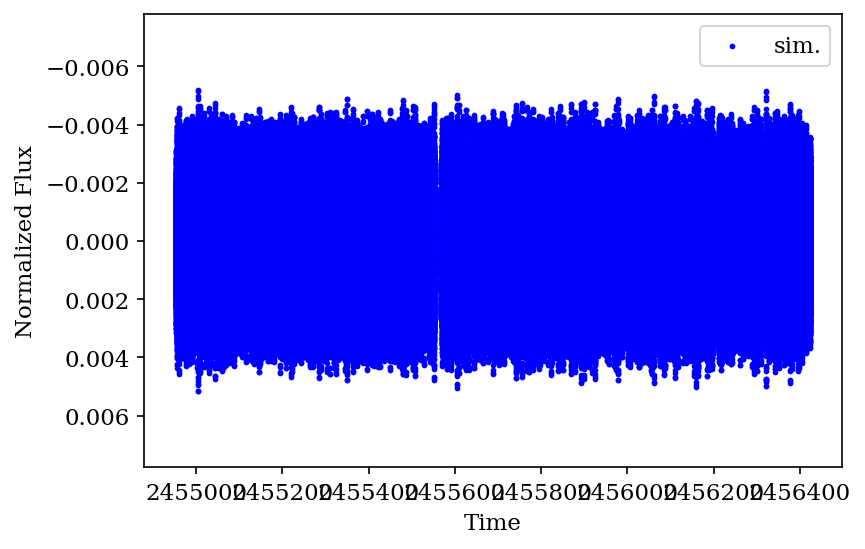

In [487]:
#Phases

f_TESS = f_TESS[:20]
a_TESS = a_TESS[:20]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_KIC, 0)

#Plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.scatter(times_KIC, model_times[4], s=3, c='b', label = 'sim.')

ax.set_xlabel('Time')
ax.set_ylabel('Normalized Flux')
ax.legend()
ax.invert_yaxis()

#plt.savefig('posteriori.png')

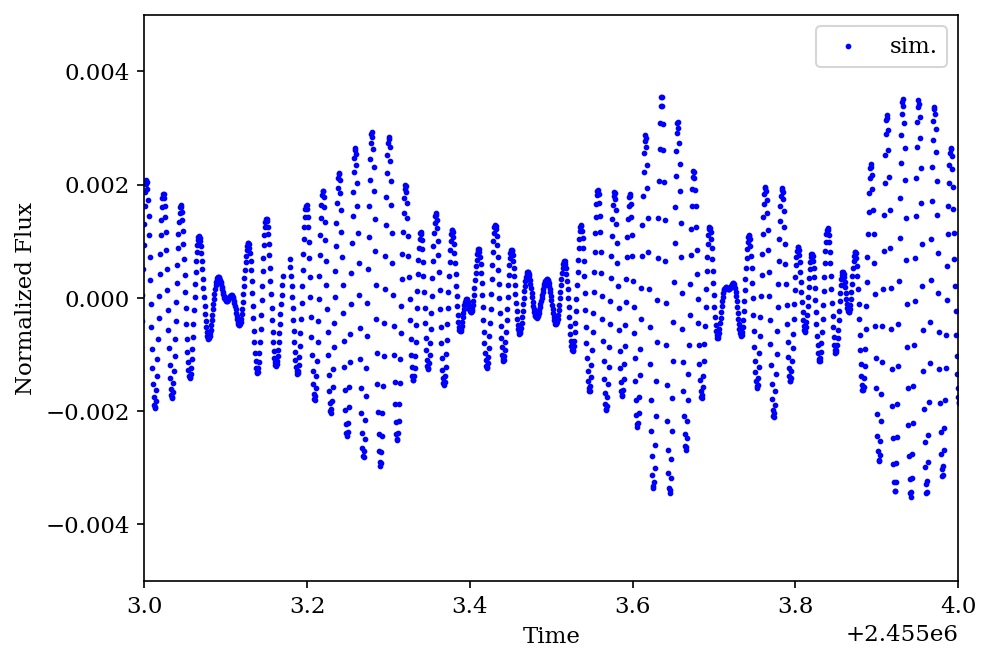

In [488]:
fig, ax = plt.subplots(1, 1, figsize=(7, 5))

ax.scatter(times_KIC, model_times[4], s=3, c='b', label = 'sim.')

ax.set_xlabel('Time')
ax.set_ylabel('Normalized Flux')
ax.legend()
ax.invert_yaxis()

ax.set_ylim(-0.005, 0.005)
ax.set_xlim(2455003, 2455004)

plt.savefig('3old-2.png')

# Insert time delays

In [18]:
#Expected units:
#t ... Time in days
#a1sini ... in seconds
#Porb ... in days
#star_planet_ratio ... how many times heavier is the star?

def tau(t, star_planet_ratio, a2sini , e, varpi, Porb, tp, nobessel):
    
    Omega = 2 * np.pi / Porb
    
    term1 = -a2sini / star_planet_ratio * 499 / 86400
    term2 = (1-e**2)
    
    sum_cosf = sum(scipy.special.jv(n,n*e)*np.cos(n*Omega*(t-tp)) for n in range(1,nobessel))
    sum_sinf = sum(scipy.special.jvp(n,n*e,n=1)*np.sin(n*Omega*(t-tp)) for n in range(1,nobessel))
    
    
    cosf  = - e + 2*(1-e**2)/e * sum_cosf
    sinf  = 2 * math.sqrt(1 - e**2) * sum_sinf
    
    term3 = (sinf * np.cos(varpi) + cosf * np.sin(varpi))/(1. + e*cosf)
    
    sol = term1*term2*term3
    
    return sol

def vrad(t, star_planet_ratio, a2sini , e, varpi, Porb, tp, nobessel):
    
    Omega = 2 * np.pi / Porb
    
    term1 = - Omega * a2sini / star_planet_ratio *1.736*10**6 #num.value is AU/day into m/s
    term2 = math.sqrt(1-e**2)
    
    sum_cosf = sum(scipy.special.jv(n,n*e)*np.cos(n*Omega*(t-tp)) for n in range(1,nobessel))
    sum_sinf = sum(scipy.special.jvp(n,n*e,n=1)*np.sin(n*Omega*(t-tp)) for n in range(1,nobessel))
    
    
    cosf  = - e + 2*(1-e**2)/e * sum_cosf
    sinf  = 2 * math.sqrt(1 - e**2) * sum_sinf
    
    term3 = (cosf * np.cos(varpi) - sinf * np.sin(varpi)) + e * np.cos(varpi)
    
    sol = term1*term2*term3
    
    return sol

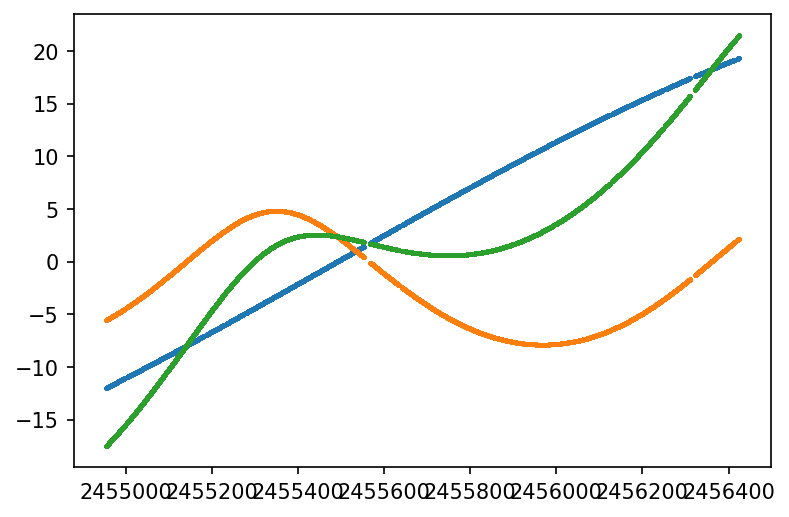

In [19]:
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)

y_tau_c = tau(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

plt.scatter(times_KIC, (y_tau_b)*86400, s=1)
plt.scatter(times_KIC, (y_tau_c)*86400, s=1)
plt.scatter(times_KIC, (y_tau_b + y_tau_c)*86400, s=1)

In [16]:
jds = []
for i in np.arange(2005, 2030, 5):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    print(t)
    print(t.jd)
    jds.append(t.jd[0])

['2005-01-01T12:00:00.000']
[2453372.]
['2010-01-01T12:00:00.000']
[2455198.]
['2015-01-01T12:00:00.000']
[2457024.]
['2020-01-01T12:00:00.000']
[2458850.]
['2025-01-01T12:00:00.000']
[2460677.]


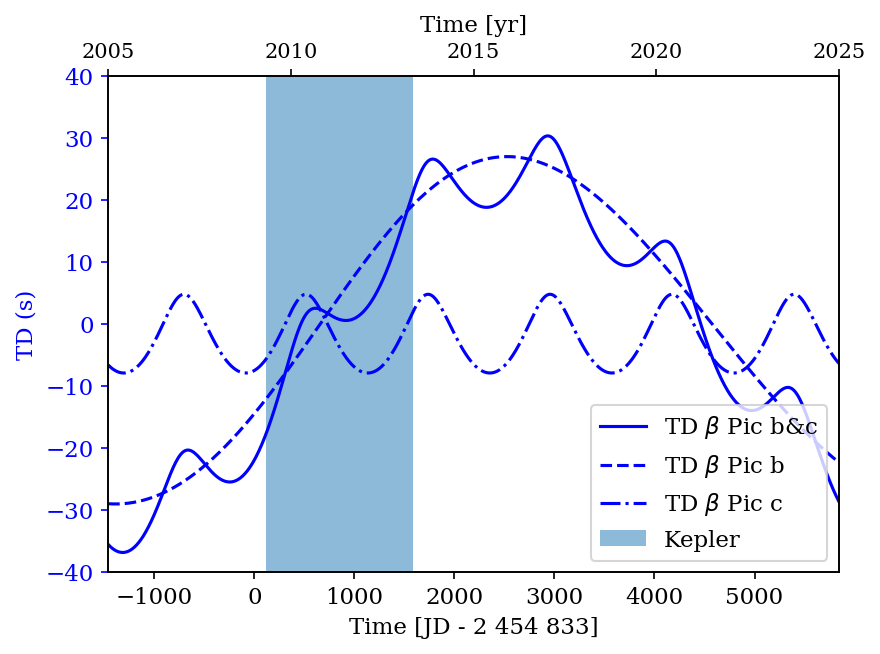

In [505]:
dat

In [70]:
def sin(x: np.ndarray, amp: float, f: float, phase: float) -> np.ndarray:
    """
    Sinus function, used for fitting.

    :param x: Time axis
    :param amp: amplitude
    :param f: frequency
    :param phase: phase, normed to 1
    """
    return amp * np.sin(2. * np.pi * (f * x + phase))

In [72]:
def phases_simon(times, magnitudes, f_fix, a_guess, p_guess):
    
    freqs = []
    amps = []
    phases = []
    phases_err = []
    
    for i in range(len(f_fix)):

        model1 = Model(sin)
        #model1.set_param_hint('amp', value=a_guess[i], vary=False)
        model1.set_param_hint('amp', value=a_guess[i], min=0.5 * a_guess[i], max=1.5 * a_guess[i])
        model1.set_param_hint('f', value=f_fix[i], vary=False)
        model1.set_param_hint('phase', value=p_guess[i], min=0, max=1)
        result1 = model1.fit(magnitudes, x=times, method='least_squares')

        # after first fit, vary only phase
        model2 = Model(sin)
        model2.set_param_hint('amp', value=result1.values['amp'], vary=False)
        model2.set_param_hint('f', value=f_fix[i], vary=False)
        model2.set_param_hint('phase', value=result1.values['phase'], min=0, max=1)
        result2 = model2.fit(magnitudes, x=times, method='least_squares')

        freqs.append(result2.values['f'])
        amps.append(result2.values['amp'])
        phases.append(result2.values['phase'])
        phases_err.append(np.sqrt(np.diag(result2.covar)[0]))
        
    freqs = np.array(freqs)
    amps = np.array(amps)
    phases = np.array(phases)
    phases_err = np.array(phases_err)
        
    return(freqs, amps, phases, phases_err)

In [73]:
import time
time.sleep(1.3)

tmp_list1 = [1,2,5]
tmp_list2 = [1,2,5]



for i,j in log_progress(zip(tmp_list1, tmp_list2), size=2):
    print((i,j))
    time.sleep(1)

(1, 1)
(2, 2)
(5, 5)


In [40]:
segment_size = 20

times_TD = times_KIC - y_tau_b - y_tau_c
magnitudes_TD = model_times[4]

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

t_edge = []

counter = 1
size=int((max(times_TD)-min(times_TD))//segment_size)

# Iterate over lightcurve
for t, y in zip(times_TD, magnitudes_TD):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if t - time_0 > segment_size:
        print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(sol)
        
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_0 = t
        time_slice, mag_slice = [], []

        t_edge.append(t)
        
        counter += 1
        
phase = np.array(phase).T
phase_err = np.array(phase_err).T

# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

1/73
2/73
3/73
4/73
5/73
6/73
7/73
8/73
9/73
10/73
11/73
12/73
13/73
14/73
15/73
16/73
17/73
18/73
19/73
20/73
21/73
22/73
23/73
24/73
25/73
26/73
27/73
28/73
29/73
30/73
31/73
32/73
33/73
34/73
35/73
36/73
37/73
38/73
39/73
40/73
41/73
42/73
43/73
44/73
45/73
46/73
47/73
48/73
49/73
50/73
51/73
52/73
53/73
54/73
55/73
56/73
57/73
58/73
59/73
60/73
61/73
62/73
63/73
64/73
65/73
66/73
67/73
68/73
69/73
70/73
71/73
72/73


IndexError: list index out of range

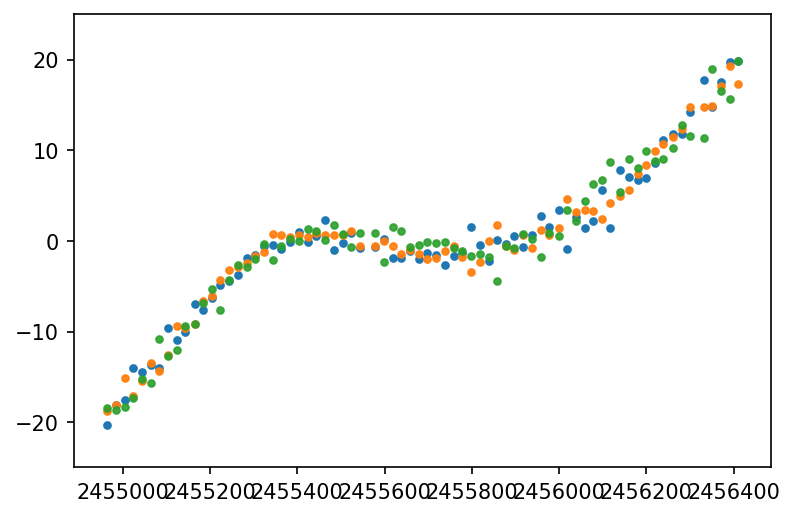

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
for i in range(9):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    #ax.errorbar(time_midpoints, time_delays[i]*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = a_TESS[i]/a_TESS[0])    
    ax.scatter(time_midpoints, time_delays[i]*86400, alpha = a_TESS[i]/a_TESS[0], s=10)
    ax.set_ylim(-25, 25)

    
plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)

In [22]:
jds = []
for i in np.arange(2009, 2015, 1):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    print(t)
    print(t.jd)
    jds.append(t.jd[0])

['2009-01-01T12:00:00.000']
[2454833.]
['2010-01-01T12:00:00.000']
[2455198.]
['2011-01-01T12:00:00.000']
[2455563.]
['2012-01-01T12:00:00.000']
[2455928.]
['2013-01-01T12:00:00.000']
[2456294.]
['2014-01-01T12:00:00.000']
[2456659.]


In [23]:
def jd_to_datetime(jd, returniso=False):

    tt = Time(jd, format='jd', scale='utc')

    if returniso:
        return tt.iso
    else:
        return tt.datetime 

In [24]:
jd_to_datetime(min(times_KIC), returniso=True)

'2009-05-02 00:41:43.412'

In [25]:
jd_to_datetime(max(times_KIC), returniso=True)

'2013-05-11 12:16:16.334'

In [26]:
td_weighted = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays)):
        #print(j)
        tds.append(time_delays[j][i])
        tds_err.append(time_delays_err[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
td_weighted = np.array(td_weighted)

In [27]:
y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

np.mean((y_tau_b_sim + y_tau_c_sim) *86400 - td_weighted*86400)

/home/sebastian/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/sebastian/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


nan

IndexError: list index out of range

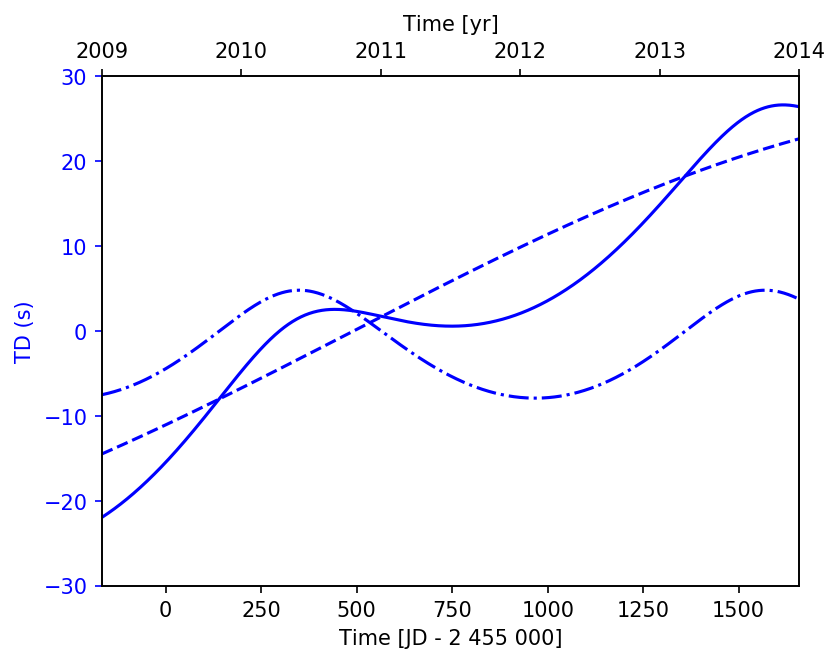

In [39]:
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)

y_tau_c_sim = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
# y_vrad_c = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2009 = jds[0] - time_offset
t_2010 = jds[1] - time_offset
t_2011 = jds[2] - time_offset
t_2012 = jds[3] - time_offset
t_2013 = jds[4] - time_offset
t_2014 = jds[5] - time_offset


#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)

lns1 = ax1.plot(times_sim - time_offset, (y_tau_b_sim + y_tau_c_sim) *86400, 'b', label = "TD curve")
ax1.plot(times_sim - time_offset, (y_tau_b_sim) *86400, 'b', label = "TD curve", ls = '--')
ax1.plot(times_sim - time_offset, (y_tau_c_sim) *86400, 'b', label = "TD curve", ls = '-.')
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-30, 30)
ax1.set_xlim(t_2009, t_2014)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)





ax2.set_xticks([t_2009,t_2010,t_2011,t_2012,t_2013,t_2014])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)


xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2009', '2010', '2011', '2012', '2013', '2014'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')




y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
y_offset = np.mean((y_tau_b_sim + y_tau_c_sim) *86400 - td_weighted*86400)
ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   

for i in range(9):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax1.errorbar(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, yerr = time_delays_err[i]*86400, fmt='.', alpha = (a_TESS[i]/a_TESS[0])**3)
    #ax1.set_ylim(-25, 25)



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)





fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler2-2.png", dpi=400)

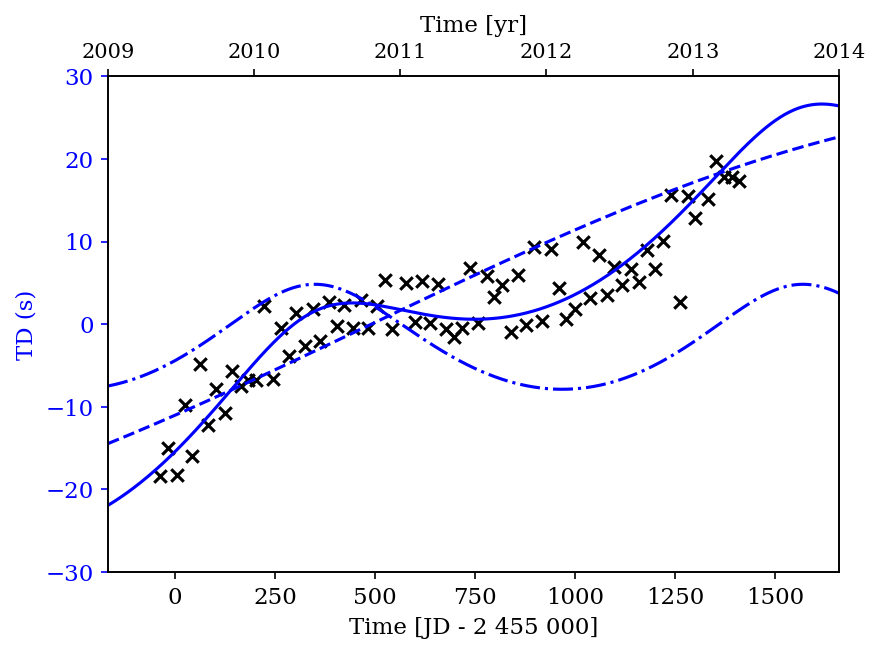

In [518]:
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)

y_tau_c_sim = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
# y_vrad_c = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2009 = jds[0] - time_offset
t_2010 = jds[1] - time_offset
t_2011 = jds[2] - time_offset
t_2012 = jds[3] - time_offset
t_2013 = jds[4] - time_offset
t_2014 = jds[5] - time_offset


#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)

lns1 = ax1.plot(times_sim - time_offset, (y_tau_b_sim + y_tau_c_sim) *86400, 'b', label = "TD curve")
ax1.plot(times_sim - time_offset, (y_tau_b_sim) *86400, 'b', label = "TD curve", ls = '--')
ax1.plot(times_sim - time_offset, (y_tau_c_sim) *86400, 'b', label = "TD curve", ls = '-.')
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-30, 30)
ax1.set_xlim(t_2009, t_2014)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)





ax2.set_xticks([t_2009,t_2010,t_2011,t_2012,t_2013,t_2014])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)


xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2009', '2010', '2011', '2012', '2013', '2014'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')




y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
y_offset = np.mean((y_tau_b_sim + y_tau_c_sim) *86400 - td_weighted*86400)
ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   

#for i in range(9):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    #ax1.errorbar(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, yerr = time_delays_err[i]*86400, fmt='.', alpha = (a_TESS[i]/a_TESS[0])**3)
    #ax1.set_ylim(-25, 25)



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)





fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler2-2.png", dpi=400)

# All In One:

In [556]:
noise_TESS_mag*1e6*np.sqrt(np.median(np.diff(times))*24)

28.15699590788791

In [562]:
19.91*np.sqrt(1/(np.median(np.diff(times_KIC))*24))

154.22219684597934

In [568]:
len(times)

64609

In [565]:
times[:7]

array([2458410.90352425, 2458410.90491317, 2458410.90630209,
       2458410.90769101, 2458410.90907993, 2458410.91046885,
       2458410.91185778])

In [578]:
aaaa = np.array([2,5,2,1,6,6])

In [579]:
len(aaaa)%2 == 0

True

In [609]:
def midvals(array):
    array = np.array(array)
    if len(array)%2 == 0:
        tmp = (array[::2]+array[1::2])/2
    elif len(array)%2 == 1:
        tmp = (array[::2][:-1]+array[1::2])/2
    return tmp

In [599]:
sum(times_KIC % 1 > 0.5) 

1977079

In [597]:
sum(times_KIC % 1 < 0.5)

986598

In [598]:
sum(times_KIC % 1 < 5)

1977079

In [602]:
noise_run*1e-6

155.7238095954222

DEFINE AS FUNTION
CALCULATE FREQS OF BETA PIC
IMPORT KEPLER TIMESTAMPS
61.17409022396696
778
CREATE MULTISINE MODEL
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:377: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


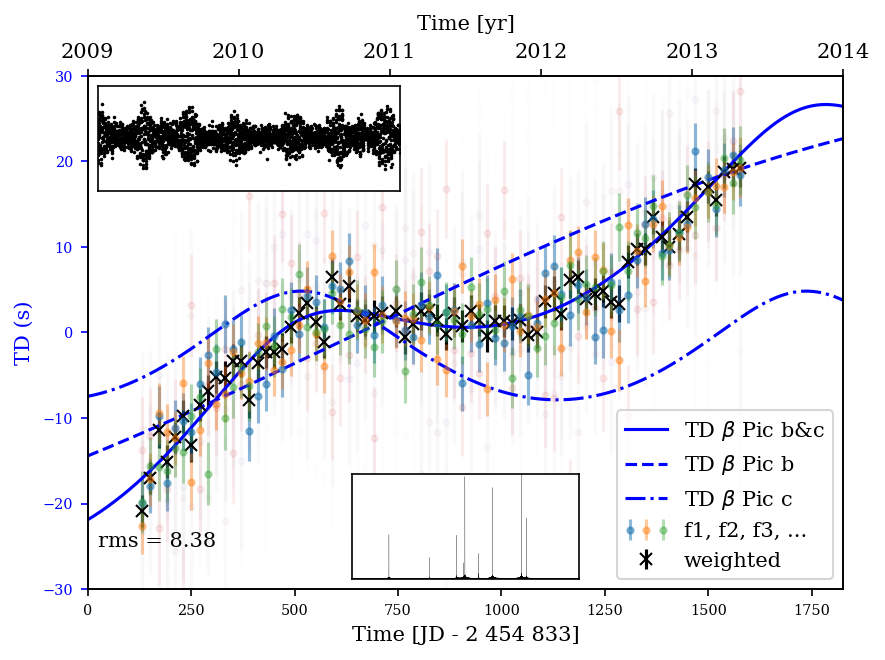

In [622]:
no_freqs_run = 9
no_freqs_run_weighted = 3
noise_TESS_mag_hour_ppm = 5*19.91
noise_hour_ppm = noise_TESS_mag_hour_ppm
segment_size = 20


# print('DOWNLOAD DATA')
# for name in ['beta Pictoris']:
#     sr = lk.search_lightcurvefile(name)
#     print(sr)

#     if len(sr) > 0:

#         #Download data
#         lcfs = sr.download_all()

#         # Use the normalized PDCSAP_FLUX
#         lc0 = lcfs[0].SAP_FLUX.normalize()
#         lc1 = lcfs[0].PDCSAP_FLUX.normalize()

#         # Loop through the rest of the LCFS, appending to the first light curve
#         for lcf in lcfs[1:]:
#             lc0 = lc0.append(lcf.SAP_FLUX.normalize())
#             lc1 = lc1.append(lcf.PDCSAP_FLUX.normalize())

#         #Remove bad quality and nans
#         q0 = lc0.quality == 0
#         lc0 = lc0[q0].remove_nans()
#         q1 = lc1.quality == 0
#         lc1 = lc1[q1].remove_nans()
#         #Plot data
#         ax = lc0.scatter(label = 'SAP_FLUX')
#         lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')

        
#         #Times & Mags
#         times = lc1.time + 2457000
#         mags = -2.5 * np.log10(lc1.flux)
#         mags = mags - np.median(mags)
        
#         x = times
#         y = mags

        
print('DEFINE AS FUNTION')
#Amplitude Spectrum Function
def AS(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(df, 120, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))


print('CALCULATE FREQS OF BETA PIC')

#AS
freq, amp = AS(times, mags, 15)
freq=freq[5000:]
amp=amp[5000:]

# PEAKS
max_power = amp.max()
peaks, _ = find_peaks(amp, height=max_power*0.02, distance=200)

# FREQS SORTED BY AMPLITUDE
sort_idx = np.argsort(amp[peaks])[::-1]
f_TESS = freq[peaks][sort_idx]
a_TESS = amp[peaks][sort_idx]
#print(len(f_TESS))



print('IMPORT KEPLER TIMESTAMPS')
import os
datadir = os.getcwd()
datafile = '/times_KIC.txt'

times_KIC_load = np.loadtxt(datadir+datafile, usecols=(0)).T
times_KIC = times_KIC_load


cadence_hour = 1/(np.median(np.diff(times_KIC))*24) # Measurements in 1 hour
print(cadence_hour)
noise_run = noise_hour_ppm * 1e-6 * np.sqrt(cadence_hour)
noise_run_ppm = int(noise_run*1e6)
print(noise_run_ppm)







#times_KIC = midvals(times_KIC)
#times_KIC = times_KIC[times_KIC % 1 > 0.5]

print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_KIC, noise_run)





print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)



print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_KIC - y_tau_b - y_tau_c
magnitudes_TD = model_times[4]



time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

t_edge = []

counter = 1
size=int((max(times_TD)-min(times_TD))//segment_size)

# Iterate over lightcurve
for t, y in zip(times_TD, magnitudes_TD):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if t - time_0 > segment_size:
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_0 = t
        time_slice, mag_slice = [], []

        t_edge.append(t)
        
        counter += 1
        
phase = np.array(phase).T
phase_err = np.array(phase_err).T

# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))
    


print('DOWNLOAD JDs')
jds = []
for i in np.arange(2009, 2015, 1):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)

print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2454833

t_2009 = jds[0] - time_offset
t_2010 = jds[1] - time_offset
t_2011 = jds[2] - time_offset
t_2012 = jds[3] - time_offset
t_2013 = jds[4] - time_offset
t_2014 = jds[5] - time_offset


#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim + y_tau_c_sim) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 454 833]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-30, 30)
ax1.set_xlim(t_2009, t_2014)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2009,t_2010,t_2011,t_2012,t_2013,t_2014])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2009', '2010', '2011', '2012', '2013', '2014'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
y_offset = np.median((y_tau_b_sim + y_tau_c_sim) *86400 - td_weighted*86400)
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(time_midpoints, time_delays[i]*86400, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-30, 30)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


# textstr = '\n'.join((
#     'rms b=%.1f' % (rms2(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
#     'rms b+c=%.1f' % (rms2((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
# ax1.text(0.02, 0.1, textstr, transform=ax.transAxes, fontsize=8,
#         verticalalignment='top')

ax1.text(25, -25,'rms = {0:.2f}'.format(rms2(td_weighted*86400+y_offset)))
         
fig.tight_layout()
plt.show()

fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)

In [623]:
from smurfs import Smurfs

ImportError: cannot import name 'Smurfs' from 'smurfs' (/home/sebastian/anaconda3/lib/python3.7/site-packages/smurfs/__init__.py)

In [615]:
rms2(td_weighted*86400+y_offset)

8.552639739233962

Text(0.02, 0.1, 'rms b=4.6\nrms b+c=2.5')

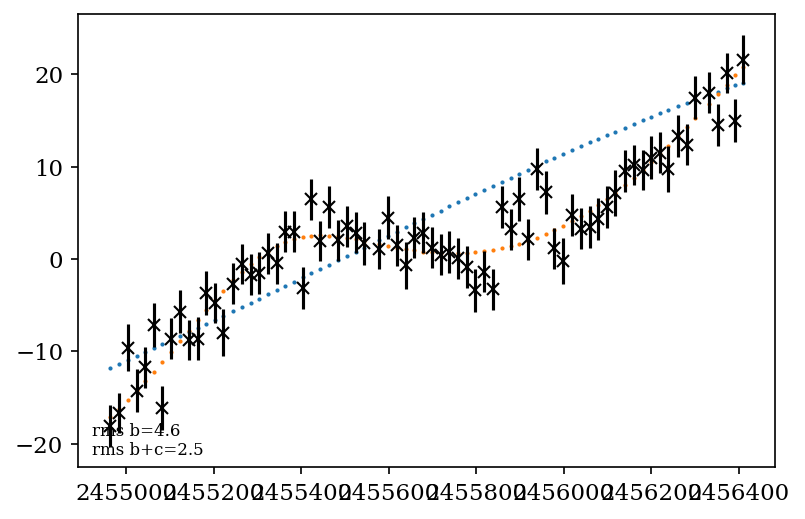

In [672]:
fig, ax =plt.subplots(1,1)
ax.scatter(time_midpoints, y_tau_b_sim*86400, s=1)
ax.scatter(time_midpoints, (y_tau_b_sim+y_tau_c_sim)*86400, s=1)
ax.errorbar(np.array(time_midpoints), td_weighted*86400+y_offset, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k')
txt = 'test'

#ax.hist(x, 50)
# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
x = 30*np.random.randn(10000)
mu = x.mean()
median = np.median(x)
sigma = x.std()
textstr = '\n'.join((
    'rms b=%.1f' % (rms(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax.text(0.02, 0.1, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')

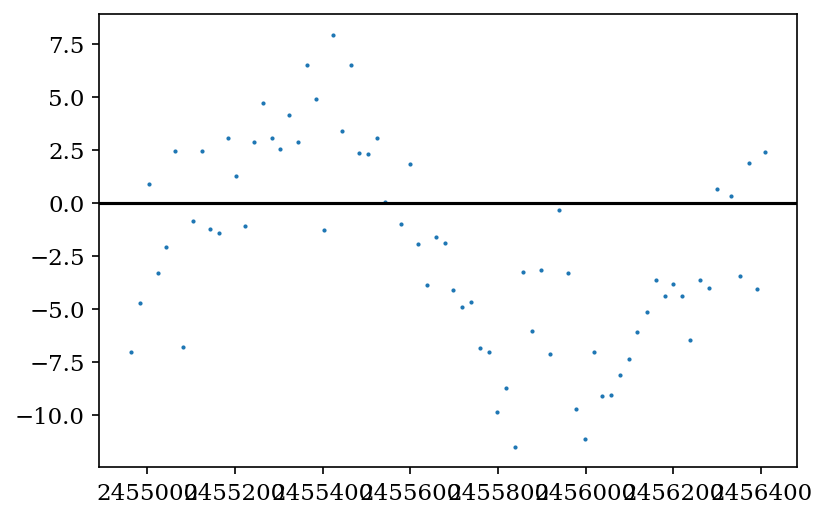

In [686]:
#plt.scatter(time_midpoints, y_tau_b_sim*86400-(td_weighted*86400+y_offset), s=1)
plt.scatter(time_midpoints, (td_weighted*86400+y_offset)-y_tau_b_sim*86400, s=1)
plt.axhline(0, c='k')

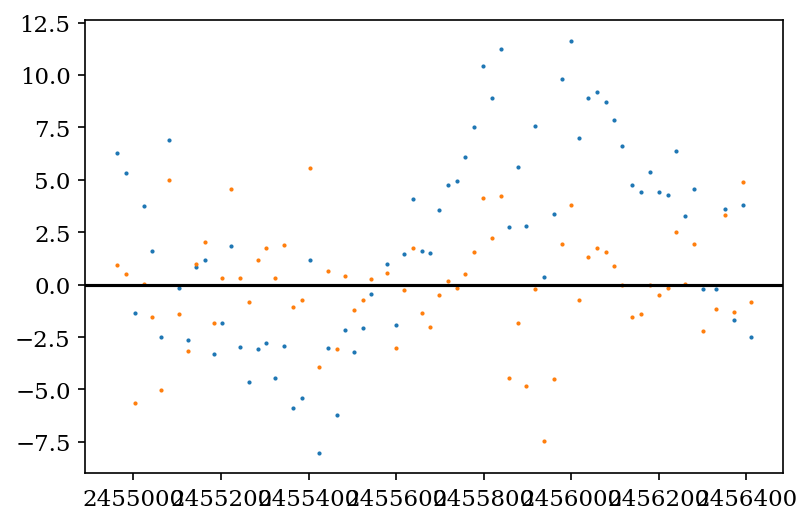

In [651]:
plt.scatter(time_midpoints, y_tau_b_sim*86400-(td_weighted*86400+y_offset), s=1)
plt.scatter(time_midpoints, (y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset), s=1)
plt.axhline(0, c='k')

In [652]:
rms(y_tau_b_sim*86400-(td_weighted*86400+y_offset))

4.640962882850878

In [653]:
rms((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset))

2.5421500456595343

In [690]:
(td_weighted*86400+y_offset)-y_tau_b_sim*86400

array([ -7.0120895 ,  -4.71422162,   0.92851863,  -3.29720298,
        -2.0696606 ,   2.45172297,  -6.78544239,  -0.81430621,
         2.46346725,  -1.22545336,  -1.40911639,   3.08742714,
         1.28755586,  -1.05270183,   2.893952  ,   4.74411204,
         3.08297933,   2.57531653,   4.16691213,   2.89215674,
         6.54509738,   4.92793622,  -1.25443173,   7.93880621,
         3.38787844,   6.54746301,   2.36140607,   2.31993169,
         3.10107653,   0.08122326,  -0.97768578,   1.83999703,
        -1.9120046 ,  -3.85715949,  -1.59788443,  -1.87355649,
        -4.105571  ,  -4.89342712,  -4.66200611,  -6.84630212,
        -7.03862765,  -9.86866733,  -8.72278021, -11.49305278,
        -3.24278663,  -6.021118  ,  -3.15839978,  -7.11226321,
        -0.3368028 ,  -3.31338904,  -9.71609528, -11.10804342,
        -7.03378059,  -9.07685567,  -9.07059879,  -8.0945769 ,
        -7.33772104,  -6.05693358,  -5.12232301,  -3.64016379,
        -4.35649648,  -3.80329465,  -4.3719598 ,  -6.44

In [696]:
AS_data[0]

array([0.00069146, 0.00070529, 0.00071911, 0.00073294, 0.00074677,
       0.0007606 , 0.00077443, 0.00078826, 0.00080209, 0.00081592,
       0.00082975, 0.00084358, 0.00085741, 0.00087124, 0.00088506,
       0.00089889, 0.00091272, 0.00092655, 0.00094038, 0.00095421,
       0.00096804, 0.00098187, 0.0009957 , 0.00100953, 0.00102336,
       0.00103718, 0.00105101, 0.00106484, 0.00107867, 0.0010925 ,
       0.00110633, 0.00112016, 0.00113399, 0.00114782, 0.00116165,
       0.00117548, 0.00118931, 0.00120313, 0.00121696, 0.00123079,
       0.00124462, 0.00125845, 0.00127228, 0.00128611, 0.00129994,
       0.00131377, 0.0013276 , 0.00134143, 0.00135525, 0.00136908,
       0.00138291, 0.00139674, 0.00141057, 0.0014244 , 0.00143823,
       0.00145206, 0.00146589, 0.00147972, 0.00149355, 0.00150738,
       0.0015212 , 0.00153503, 0.00154886, 0.00156269, 0.00157652,
       0.00159035, 0.00160418, 0.00161801, 0.00163184, 0.00164567,
       0.0016595 , 0.00167332, 0.00168715, 0.00170098, 0.00171

/home/sebastian/anaconda3/lib/python3.7/site-packages/astropy/timeseries/periodograms/lombscargle/implementations/fast_impl.py:93: RuntimeWarning: invalid value encountered in true_divide
  tan_2omega_tau = (S2 - 2 * S * C) / (C2 - (C * C - S * S))


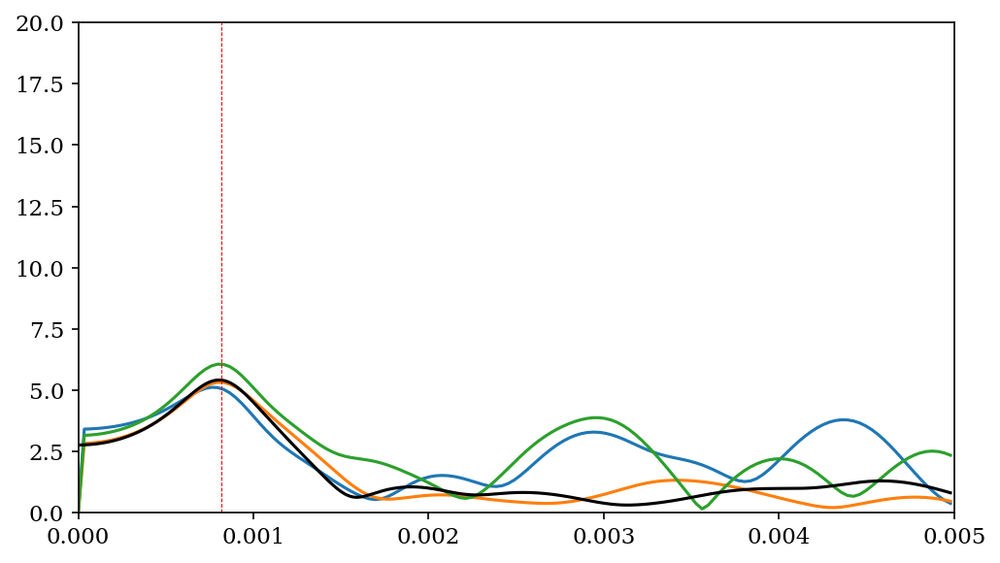

In [706]:
#Amplitude Spectrum Function
def AS_TD(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(0, 2*ny/10, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))


fig, ax = plt.subplots(1, 1, figsize=(7, 4))

for i in log_progress(range(3)):
    AS_data = AS_TD(np.array(time_midpoints), np.array((time_delays[i]*86400+y_offset)-y_tau_b_sim*86400), 20)
    freq_tmp = AS_data[0]
    amp_tmp = AS_data[1]
    ax.plot(freq_tmp, amp_tmp)
    
AS_data = AS_TD(np.array(time_midpoints), (td_weighted*86400+y_offset)-y_tau_b_sim*86400, 50)
freq_tmp = AS_data[0]
amp_tmp = AS_data[1]
ax.plot(freq_tmp, amp_tmp, c='k')
ax.set_ylim(0,20)

plt.axvline(1/1220, c='r', ls='--', lw=0.5)

plt.xlim(0,0.005)

plt.tight_layout()
#fig.savefig('ASf_TESS1.png', tight_layout=True)

# Extract time edges for TESS, bRing, BRITE, ASTEP

In [4]:
def properties(t_array, offset):
    t_min = min(t_array) + offset
    t_min_utc = jd_to_datetime(t_min)
    t_max = max(t_array) + offset
    t_max_utc = jd_to_datetime(t_max)
    timebase = t_max - t_min
    rayleigh = 1/timebase
    cadence = np.median(np.diff(t_array))*86400
    fNy = 0.5/cadence*86400
    return(t_min_utc, t_max_utc, timebase, rayleigh, cadence, fNy)

In [3]:
def jd_to_datetime(jd, returniso=False):

    tt = Time(jd, format='jd', scale='utc')

    if returniso:
        return tt.iso
    else:
        return tt.datetime 

# tess

SearchResult containing 4 data products.

target_name                     productFilename                     description  distance
----------- ------------------------------------------------------- ------------ --------
  270577175 tess2018292075959-s0004-0000000270577175-0124-s_lc.fits Light curves      0.0
  270577175 tess2018319095959-s0005-0000000270577175-0125-s_lc.fits Light curves      0.0
  270577175 tess2018349182459-s0006-0000000270577175-0126-s_lc.fits Light curves      0.0
  270577175 tess2019006130736-s0007-0000000270577175-0131-s_lc.fits Light curves      0.0


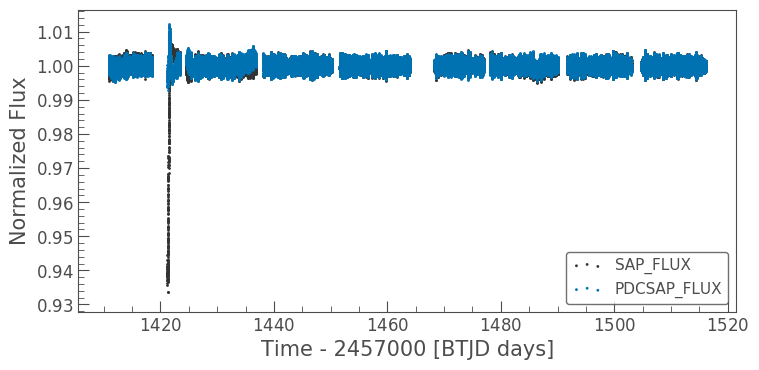

In [5]:
for name in ['beta Pictoris']:
    sr = lk.search_lightcurvefile(name)
    print(sr)

    if len(sr) > 0:

        #Download data
        lcfs = sr.download_all()

        # Use the normalized PDCSAP_FLUX
        lc0 = lcfs[0].SAP_FLUX.normalize()
        lc1 = lcfs[0].PDCSAP_FLUX.normalize()

        # Loop through the rest of the LCFS, appending to the first light curve
        for lcf in lcfs[1:]:
            lc0 = lc0.append(lcf.SAP_FLUX.normalize())
            lc1 = lc1.append(lcf.PDCSAP_FLUX.normalize())

        #Remove bad quality and nans
        q0 = lc0.quality == 0
        lc0 = lc0[q0].remove_nans()
        q1 = lc1.quality == 0
        lc1 = lc1[q1].remove_nans()
        #Plot data
        ax = lc0.scatter(label = 'SAP_FLUX')
        lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')

        
        #Times & Mags
        times_bPic_TESS = lc1.time + 2457000

In [6]:
times_bPic_TESS

array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
       2458516.08417223, 2458516.08556108, 2458516.08694993])

In [7]:
properties(times_bPic_TESS,0)

(datetime.datetime(2018, 10, 19, 9, 41, 4, 494860),
 datetime.datetime(2019, 2, 1, 14, 5, 12, 474360),
 105.18342568865046,
 0.009507201286256475,
 120.00003308057785,
 359.9999007582938)

In [8]:
edges = []
edges.append(min(times_bPic_TESS))

for i in range(len(times_bPic_TESS)-1):
    if np.diff(times_bPic_TESS)[i] > 1:
        print(times_bPic_TESS[i])
        edges.append(times_bPic_TESS[i])
        edges.append(times_bPic_TESS[i+1])
        
edges.append(max(times_bPic_TESS))
edges = np.array(edges) - 2457000

for i in range(len(edges)//2):
    print(edges[2*i+1] - edges[2*i])

2458418.488416435
2458423.5107235867
2458436.8387148865
2458450.1860725675
2458463.940299362
2458477.022219409
2458490.04572823
2458503.038583084
7.584892189130187
2.2958683506585658
12.282139697112143
12.193184090778232
12.383386586327106
8.74858040874824
11.924905774649233
11.405397033318877
11.380341593641788


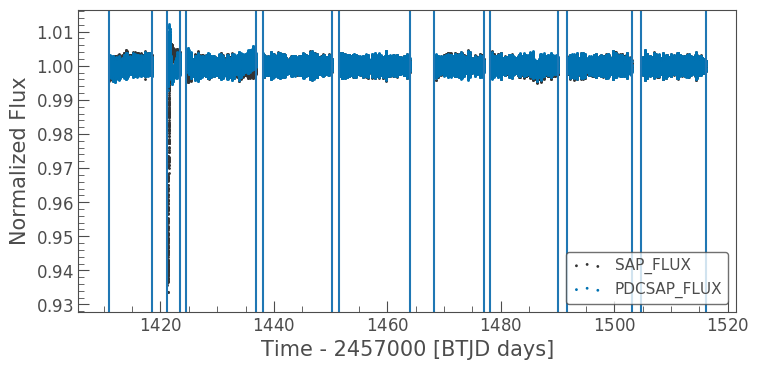

In [9]:
ax = lc0.scatter(label = 'SAP_FLUX')
lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')
[ax.axvline(i) for i in edges]

# BRITE

In [13]:
datadir = os.getcwd()
datafileB15 = '/times2015.txt.bjd'
datafileB16 = '/times2016.txt.bjd'
datafileB17 = '/times2017.txt.bjd'

tB15_BJD = np.loadtxt(datadir + datafileB15, usecols=(0)).T
tB16_BJD = np.loadtxt(datadir + datafileB16, usecols=(0)).T
tB17_BJD = np.loadtxt(datadir + datafileB17, usecols=(0)).T

In [14]:
tB15_BJD

array([2457097.98961235, 2457097.98978935, 2457097.98996735, ...,
       2457176.31247614, 2457176.31259514, 2457176.31283414])

In [15]:
properties(tB15_BJD,0)

(datetime.datetime(2015, 3, 16, 11, 45, 2, 507021),
 datetime.datetime(2015, 6, 2, 19, 30, 28, 869689),
 78.32322179013863,
 0.012767605534402392,
 10.367998480796814,
 4166.667277200444)

In [16]:
properties(tB16_BJD,0)

(datetime.datetime(2016, 11, 4, 20, 27, 47, 679562),
 datetime.datetime(2017, 6, 17, 10, 12, 35, 496593),
 224.5727756600827,
 0.004452899497994439,
 20.304013788700104,
 2127.6581295488636)

In [17]:
properties(tB17_BJD,0)

(datetime.datetime(2017, 11, 9, 0, 25, 5, 592558),
 datetime.datetime(2018, 4, 25, 8, 27, 55, 74533),
 167.33529493026435,
 0.0059760255624298625,
 20.304013788700104,
 2127.6581295488636)

# bRing

In [18]:
datadir = os.getcwd()
datadir_bRing = '/bRing'
datafile_bRing = '/Reduced_2110269.fits'

In [19]:
fits_image_filename = datadir+datadir_bRing+datafile_bRing
hdul = fits.open(fits_image_filename)
hdul[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   32 / length of dimension 1                          
NAXIS2  =                42360 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                    4 / number of table fields                         
TTYPE1  = 'jd      '                                                            
TFORM1  = 'D       '                                                            
TTYPE2  = 'raw     '                                                            
TFORM2  = 'D       '                                                            
TTYPE3  = 'reduced '        

In [20]:
databring = fits.getdata(datadir+datadir_bRing+datafile_bRing)
bsel = np.where(np.isfinite(databring['reduced']))[0]
jd = databring['jd'][bsel]
raw = databring['raw'][bsel]
reduced = databring['reduced'][bsel]
reducedHF = databring['reducedHF'][bsel]

In [21]:
jd

array([2457787.31215396, 2457787.31584746, 2457787.31954098, ...,
       2458362.62456007, 2458362.62825376, 2458362.63194745])

In [22]:
properties(jd,0)

(datetime.datetime(2017, 2, 2, 19, 29, 30, 102113),
 datetime.datetime(2018, 9, 1, 7, 38, 43, 249868),
 575.5064021730796,
 0.0017376001313348674,
 319.1227912902832,
 135.3710896841086)

In [23]:
319.1227/60

5.318711666666667

# ASTEP

In [62]:
datadir = os.getcwd() 
datadir_ASTEP = '/ASTEP'

astep17 = np.recfromcsv(datadir+datadir_ASTEP+'/bjd_bp_flux_2017.csv')
astep18 = np.recfromcsv(datadir+datadir_ASTEP+'/bjd_bp_flux_2018.csv')

In [63]:
properties(astep17['bjd']+2400000,0)

(datetime.datetime(2017, 3, 5, 14, 54, 34, 64653),
 datetime.datetime(2017, 10, 14, 14, 43, 30, 979213),
 222.9923254000023,
 0.0044844592665070696,
 86.72831654548645,
 498.1072125081878)

In [64]:
properties(astep18['bjd']+2400000,0)

(datetime.datetime(2018, 3, 5, 14, 7, 0, 808312),
 datetime.datetime(2018, 7, 16, 23, 59, 28, 740463),
 133.41143439989537,
 0.007495609386842664,
 85.45823693275452,
 505.5100777938266)

In [68]:
len(astep17['bjd']+2400000)

120357

In [67]:
len(astep18['bjd']+2400000)

89271

In [69]:
astep17flux = (astep17['flux1']-4*astep17['fsky1'])/(astep17['flux3']-4*astep17['fsky3'])
astep18flux = (astep18['flux1']-4*astep18['fsky1'])/(astep18['flux3']-4*astep18['fsky3'])
astep17nflux = astep17flux/np.nanmedian(astep17flux)
astep18nflux = astep18flux/np.nanmedian(astep18flux)
a17sel = np.where(np.isfinite(astep17nflux) & (astep17['sunelev'] < -18) & (astep17['xs1'] == 2048) & (astep17['ys1'] == 2048))[0]
a18sel = np.where(np.isfinite(astep18nflux) & (astep18['sunelev'] < -18) & (astep18['xs1'] == 2048) & (astep18['ys1'] == 2048))[0]

In [70]:
len(astep17['bjd'][a17sel]+2400000)

32006

In [71]:
len(astep18['bjd'][a18sel]+2400000)

32238

(0, 2)

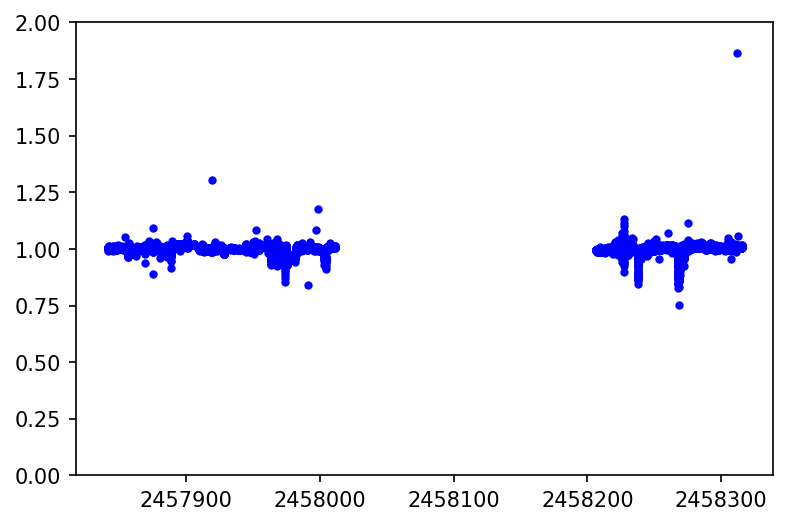

In [26]:
plt.plot(astep17['bjd'][a17sel]+2400000,astep17nflux[a17sel],'.b',label='ASTEP')
plt.plot(astep18['bjd'][a18sel]+2400000,astep18nflux[a18sel],'.b')

plt.ylim(0,2)

In [27]:
t_ASTEP = np.concatenate((astep17['bjd'][a17sel]+2400000, astep18['bjd'][a18sel]+2400000), axis=None)
m_ASTEP = np.concatenate((astep17nflux[a17sel], astep18nflux[a18sel]), axis=None)

In [28]:
properties(t_ASTEP,0)

(datetime.datetime(2017, 3, 28, 15, 24, 57, 623058),
 datetime.datetime(2018, 7, 15, 22, 33, 4, 334385),
 474.2972998996265,
 0.0021083822324344365,
 86.9011178612709,
 497.1167352411341)

In [ ]:
497.1167352411341

In [30]:
t_ASTEP17 =  astep17['bjd'][a17sel]+2400000
t_ASTEP18 =  astep18['bjd'][a18sel]+2400000

In [31]:
properties(t_ASTEP17,0)

(datetime.datetime(2017, 3, 28, 15, 24, 57, 623058),
 datetime.datetime(2017, 9, 14, 16, 1, 57, 360002),
 170.02569139981642,
 0.005881464099731223,
 87.13438957929611,
 495.78587981827894)

In [32]:
properties(t_ASTEP18,0)

(datetime.datetime(2018, 3, 28, 15, 37, 29, 657281),
 datetime.datetime(2018, 7, 15, 22, 33, 4, 334385),
 109.28859579982236,
 0.009150085538949028,
 85.91617047786713,
 502.8157069818278)

# random

In [170]:
rand_TESS = np.random.normal(0, 1, len(times_bPic_TESS))
rand_BRITE15  = np.random.normal(0, 5, len(tB15_BJD))
rand_BRITE16  = np.random.normal(0, 4, len(tB16_BJD))
rand_BRITE17  = np.random.normal(0, 4, len(tB17_BJD))
rand_bRing  = np.random.normal(0, 6, len(jd))
rand_ASTEP17  = np.random.normal(0, 7, len(t_ASTEP17))
rand_ASTEP18  = np.random.normal(0, 7, len(t_ASTEP18))

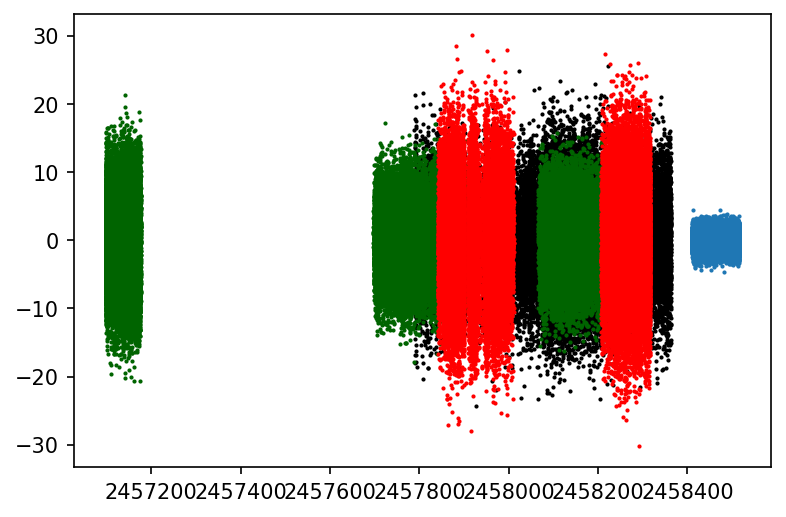

In [171]:
plt.scatter(times_bPic_TESS, rand_TESS, s=1)

plt.scatter(jd, rand_bRing, s=1, c='k')

plt.scatter(tB15_BJD, rand_BRITE15, s=1, c= 'darkgreen')
plt.scatter(tB16_BJD, rand_BRITE16, s=1, c= 'darkgreen')
plt.scatter(tB17_BJD, rand_BRITE17, s=1, c= 'darkgreen')

plt.scatter(t_ASTEP17, rand_ASTEP17, s=1, c='r')
plt.scatter(t_ASTEP18, rand_ASTEP18, s=1, c='r')

In [176]:
jd_to_datetime(max(t_ASTEP17), returniso=True)

'2017-09-14 16:01:57.360'

# Duration of every obseravtion

In [74]:
def duration(times):
    return max(times)-min(times)

In [198]:
times_all = [tB15_BJD, tB16_BJD, tB17_BJD, jd, t_ASTEP17, t_ASTEP18, times_bPic_TESS]

In [75]:
for i in times_all:
    print(duration(i))

78.32322179013863
224.5727756600827
167.33529493026435
575.5064021730796
170.02569139981642
109.28859579982236
105.18342568865046


# Cutoff random part of KEPLER  Stamps

In [54]:
def rand_cutout(times, duration):
    rand = random.randrange(len(times)//2, len(times))
    for i in range(len(times))[::-1]:
        if times[rand] - times[i] > duration:
            #print(times[rand])
            #print(times[i])
            break
    return(times[i:rand])

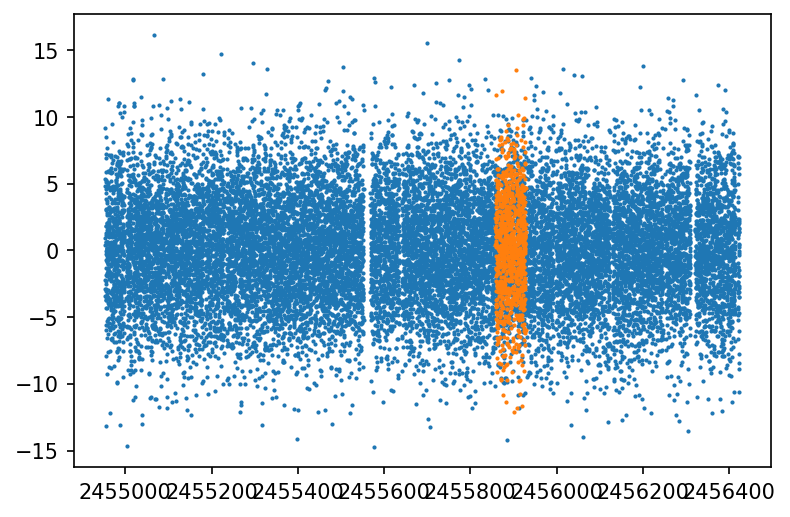

In [57]:
plt.scatter(times_KIC[::100], np.random.normal(0, 4, len(times_KIC))[::100], s=1)
times_cutout = rand_cutout(times_KIC, 70)
plt.scatter(times_cutout[::100], np.random.normal(0, 4, len(times_cutout))[::100], s=1)

#plt.axvline(times_KIC[rand], c='r')
#plt.axvline(times_KIC[i], c='r')

yes
2455842.498759619
2455267.4983564033


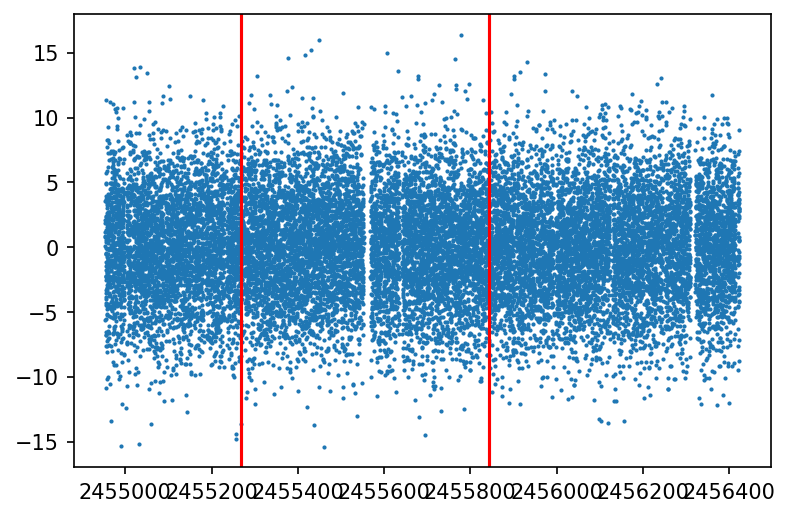

In [60]:
import random
rand = random.randrange(len(times_KIC)//2, len(times_KIC))

dur = 575#78.32322179013863

for i in range(len(times_KIC))[::-1]:
    if times_KIC[rand] - times_KIC[i] > dur:
        print('yes')
        print(times_KIC[rand])
        print(times_KIC[i])
        break
        
plt.scatter(times_KIC[::100], np.random.normal(0, 4, len(times_KIC))[::100], s=1)
plt.axvline(times_KIC[rand], c='r')
plt.axvline(times_KIC[i], c='r')

78.32322179013863
224.5727756600827
167.33529493026435
575.5064021730796
170.02569139981642
109.28859579982236
105.18342568865046


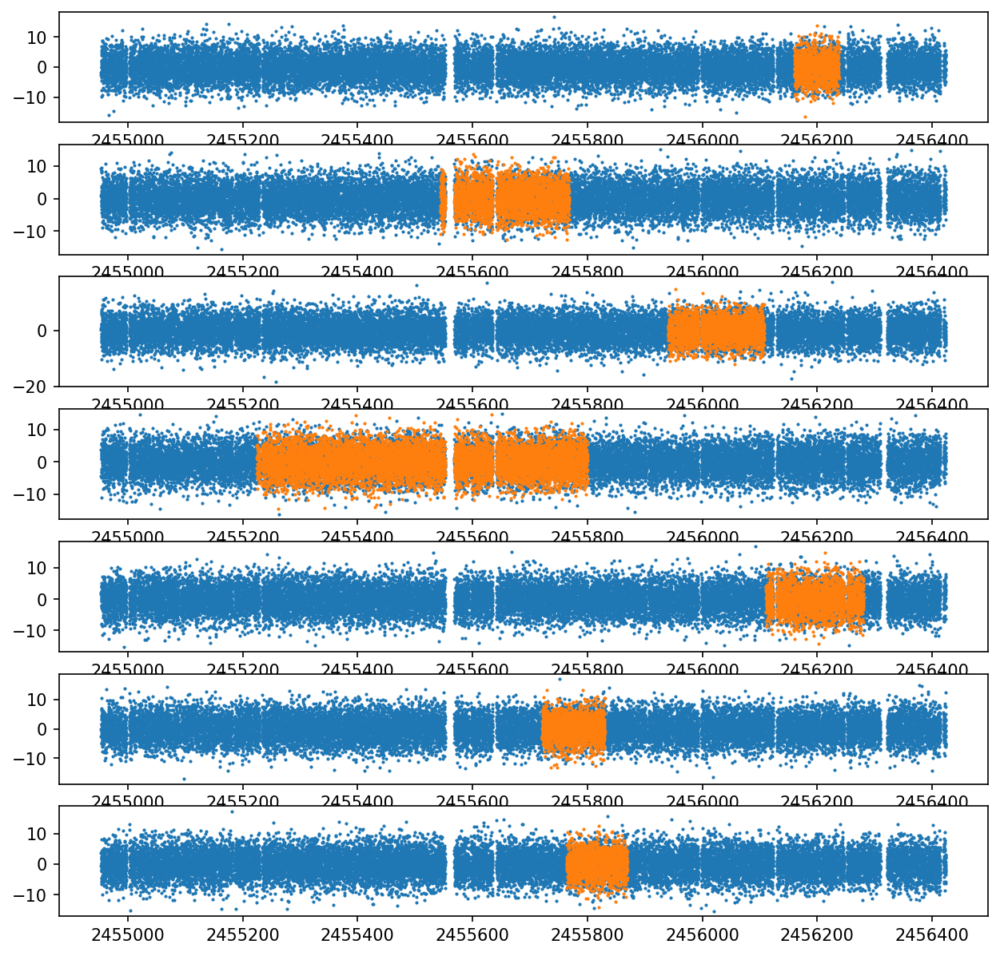

In [79]:
fig, ax = plt.subplots(7,1, figsize=(10,10))

times_all_cutout = []

for i in range(len(times_all)):
    print(duration(times_all[i]))
    
    ax[i].scatter(times_KIC[::100], np.random.normal(0, 4, len(times_KIC))[::100], s=1)
    times_cutout = rand_cutout(times_KIC, duration(times_all[i]))
    times_all_cutout.append(times_cutout)
    ax[i].scatter(times_cutout[::100], np.random.normal(0, 4, len(times_cutout))[::100], s=1)

In [80]:
times_all_cutout_corr = []

for i in range(len(times_all)):
    tmp = times_all_cutout[i]-min(times_all_cutout[i])+min(times_all[i])
    times_all_cutout_corr.append(tmp)

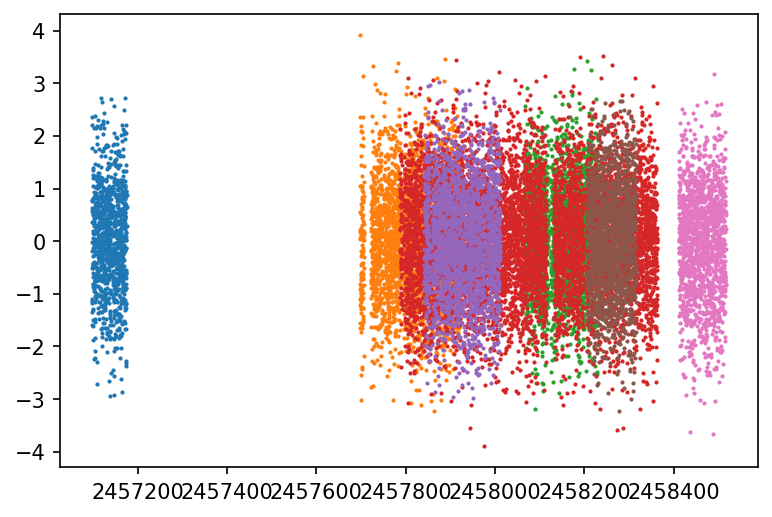

In [81]:
for i in range(7):
    plt.scatter(times_all_cutout_corr[i][::100],np.random.normal(0, 1, len(times_all_cutout_corr[i]))[::100], s=1)

In [335]:
for i in range(len(times_all)):
    print(np.median(np.diff(times_all_cutout_corr[i])))

0.0006811344064772129
0.0006811292842030525
0.0006811171770095825
0.0006811115890741348
0.0006811288185417652
0.0006810775958001614
0.0006810761988162994


In [85]:
model_all_cutout = []

# f_TESS = f_TESS[:9]
# a_TESS = a_TESS[:9]
# p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

for i in range(len(times_all)):
    tmp = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_all_cutout_corr[i], 0)
    model_all_cutout.append(tmp[4])

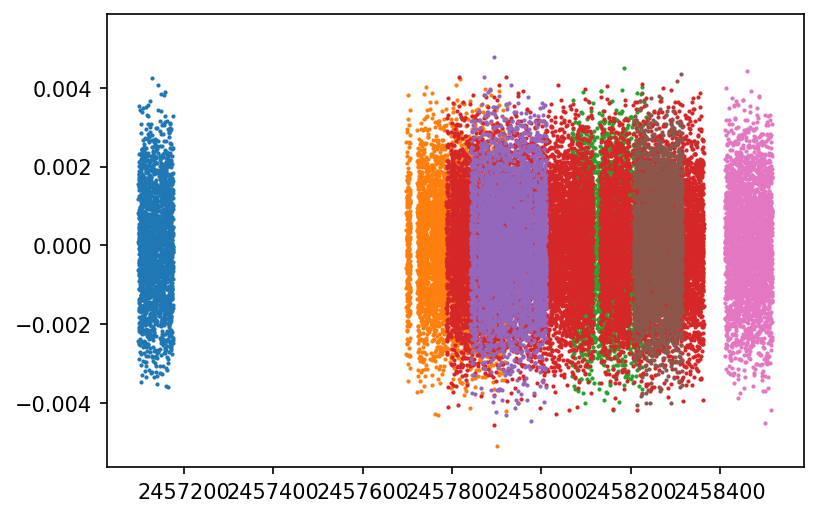

In [86]:
for i in range(len(times_all)):
    plt.scatter(times_all_cutout_corr[i][::50], model_all_cutout[i][::50], s=1)

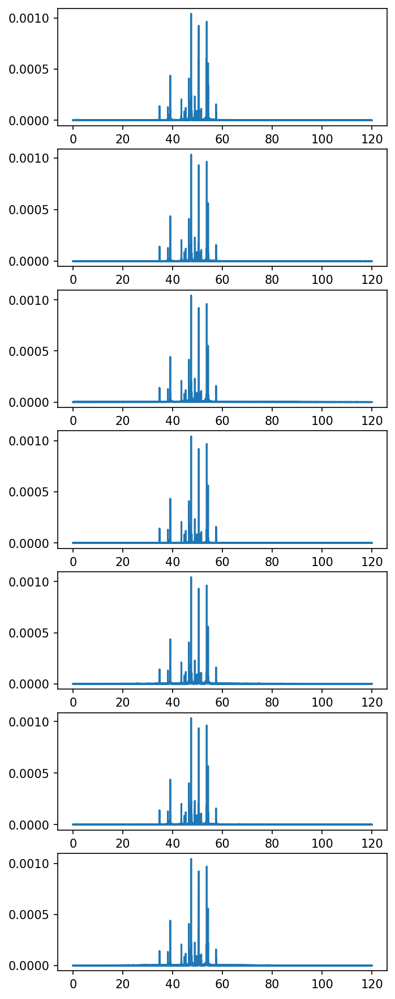

In [87]:
fig, ax = plt.subplots(7, 1, figsize=(5, 15))

for i in range(len(times_all)):
    freq_seg, amp_seg = AS(times_all_cutout_corr[i], model_all_cutout[i], 5)
    ax[i].plot(freq_seg, amp_seg)

# CAlc TDs

In [94]:
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

# TESS + BRITE

In [88]:
for i in range(7):
    print(len(model_all_cutout[i]))

108636
288274
224593
781018
225503
154973
147608


In [ ]:
109079+302634+221292+141845

In [515]:
def idiot2(selection, times_all, precisions, f_model, a_model, p_model):
    selection = np.array(selection)
    times_all = np.array(times_all)
    times = times_all[selection]
    
    sizes = [len(i) for i in times]
    borders = np.concatenate((np.array([0]), np.cumsum(sizes)), axis=None)
    
    times = np.array([item for sublist in times for item in sublist])            
                     
    cadence_hour = []
    models = []
    for i in range(len(selection)):
        cadence_hour_tmp = 1/(np.median(np.diff(times_all[selection[i]]))*24)  
        #print(selection[i])
        #print(cadence_hour_tmp)
        cadence_hour.append(cadence_hour_tmp)
        noise_tmp = precisions[i] * 1e-6 * np.sqrt(cadence_hour_tmp)
        #print(noise_tmp)
        tmp = lc_model_times(f_model, a_model, p_model*2*np.pi, times_all[selection[i]], noise_tmp)
        models.append(tmp[4])
    models_comb = np.array([j for i in models for j in i])
    
    return(times, models_comb, borders)

In [509]:
len(idiot2([0,1,2,7], times_all, [0,0,0,19.91], f_TESS, a_TESS, p_TESS)[1])

0
347.222273100037
0.0
1
177.30484412907197
0.0
2
177.30484412907197
0.0
7
29.99999172985782
0.00010905154616807894


229685

In [510]:
len(idiot2([0,1,2,7], times_all, [0,0,0,19.91], f_TESS, a_TESS, p_TESS)[2])

0
347.222273100037
0.0
1
177.30484412907197
0.0
2
177.30484412907197
0.0
7
29.99999172985782
0.00010905154616807894


5

In [449]:
model_all_cutout

[array([-0.00062591, -0.00119044, -0.0016826 , ..., -0.00152675,
        -0.00129427, -0.0009998 ]),
 array([-0.00107037, -0.00148399, -0.00182621, ..., -0.0017329 ,
        -0.00095403, -0.0001321 ]),
 array([ 5.86607174e-04,  6.79933485e-05, -4.46438414e-04, ...,
        -1.39125229e-03, -1.61709515e-03, -1.77136712e-03]),
 array([0.00044978, 0.00072745, 0.00096729, ..., 0.00234424, 0.00202424,
        0.00159606]),
 array([-0.00200336, -0.00189372, -0.00168657, ..., -0.00148029,
        -0.00196702, -0.00236857]),
 array([-0.00051062, -0.00053685, -0.00054255, ...,  0.00146868,
         0.00159699,  0.0016496 ]),
 array([0.00099198, 0.00083153, 0.00063108, ..., 0.00138875, 0.0010382 ,
        0.00062044])]

In [452]:
times_all

[array([2457097.98961235, 2457097.98978935, 2457097.98996735, ...,
        2457176.31247614, 2457176.31259514, 2457176.31283414]),
 array([2457697.35263518, 2457697.35498618, 2457697.35522118, ...,
        2457921.92494084, 2457921.92517584, 2457921.92541084]),
 array([2458066.51742584, 2458066.51766084, 2458066.51789684, ...,
        2458233.85225077, 2458233.85248577, 2458233.85272077]),
 array([2457787.31215396, 2457787.31215399, 2457787.31584746, ...,
        2458125.20610148, 2458125.20986253, 2458125.21337652]),
 array([2458125.21711859, 2458125.22071864, 2458125.22441853, ...,
        2458362.81290488, 2458362.81633077, 2458362.81855613]),
 array([2457841.1423336, 2457841.144326 , 2457841.1453762, ...,
        2458011.1659874, 2458011.1669955, 2458011.168025 ]),
 array([2458206.1510377, 2458206.1530305, 2458206.1549982, ...,
        2458315.4373627, 2458315.4383451, 2458315.4396335]),
 array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
        2458516.08417223, 24

In [453]:
model_all_real = []

# f_TESS = f_TESS[:9]
# a_TESS = a_TESS[:9]
# p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

for i in range(len(times_all)):
    tmp = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_all[i], 0)
    model_all_real.append(tmp[4])

In [454]:
len(times_all)

8

In [455]:
len(model_all_real)

8

In [513]:
'{0}'.format([4.,2])

'[4.0, 2]'

DEFINE AS FUNTION
CALCULATE FREQS OF BETA PIC
***BRITE***
CALCULATE TIMES
CREATE MULTISINE MODEL
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
0
44235
1
111813
2
165075
3
229684
Calc TD
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:393: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


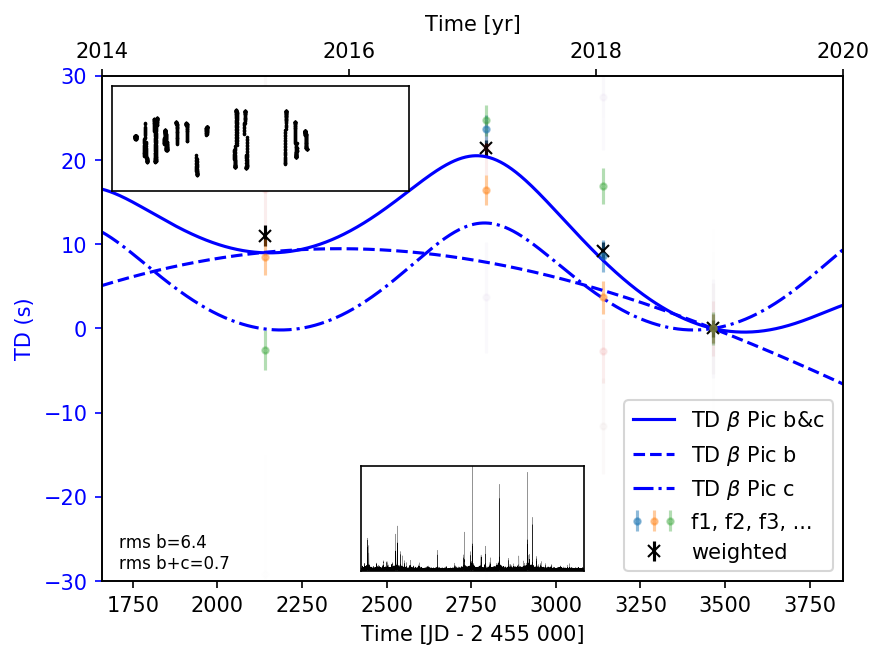

***ASTEP***
CALCULATE TIMES
CREATE MULTISINE MODEL
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
[2457841.1419916  2457841.143984   2457841.1450342  ... 2458516.08406188
 2458516.08545073 2458516.08683959]
[-0.0019     -0.00139044 -0.00084706 ...  0.00184865  0.001396
  0.00061543]
0
31920
1
64018
2
128627
Calc TD
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:716: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


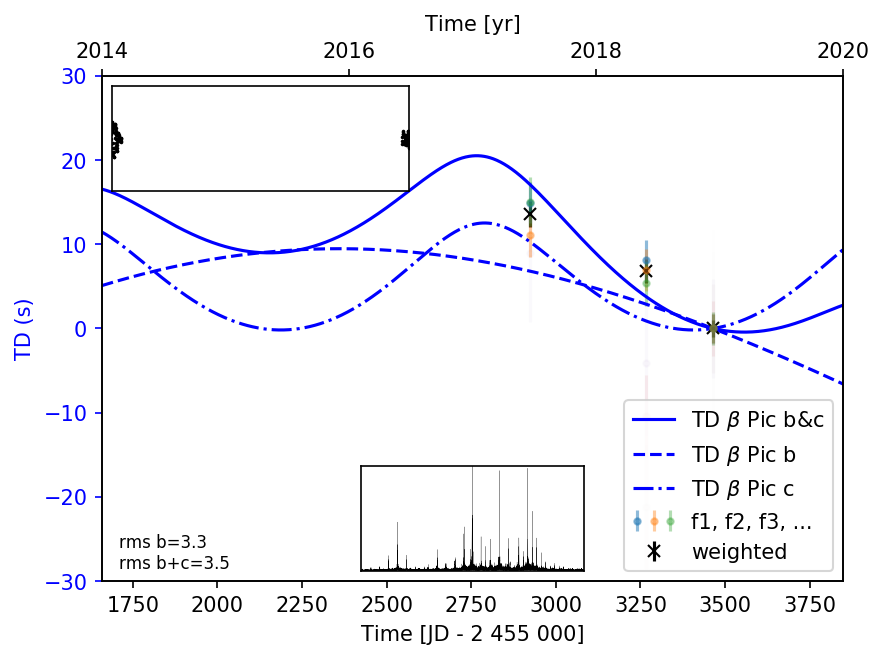

***bRing***
CALCULATE TIMES
CREATE MULTISINE MODEL
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
0
21009
1
42020
2
106629
Calc TD
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1048: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


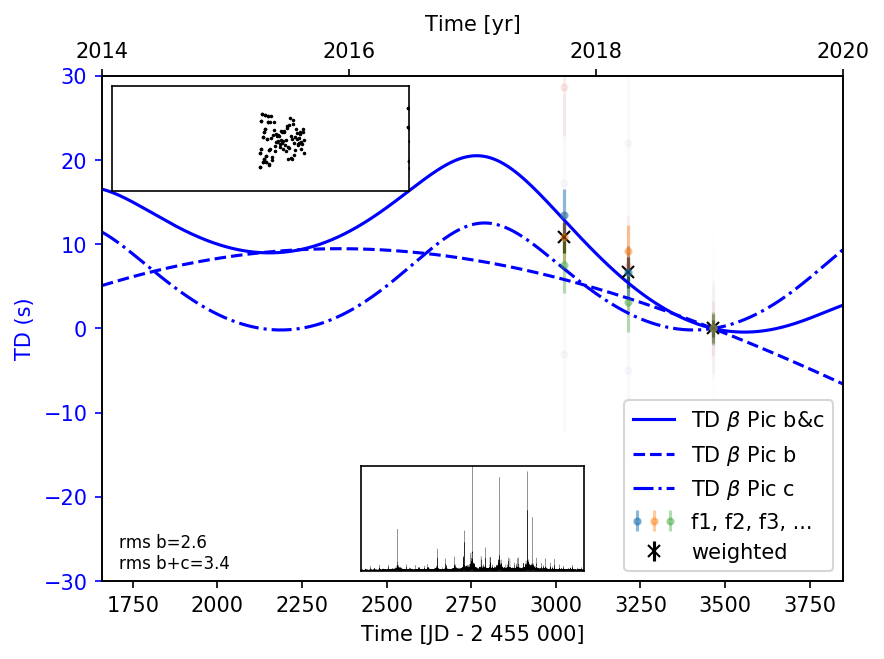

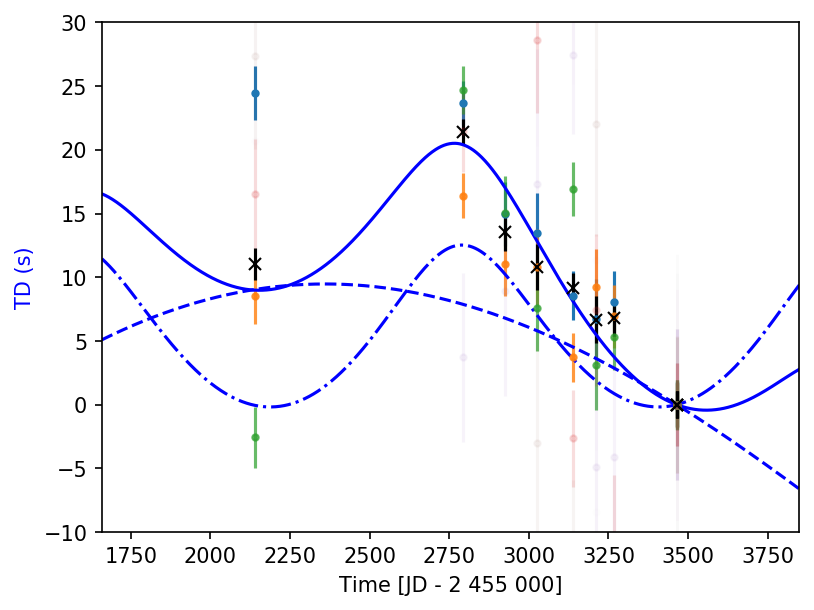

In [519]:
no_freqs_run = 9
no_freqs_run_weighted = 3
# noise_TESS_mag_hour_ppm = 19.91
# noise_hour_ppm = noise_TESS_mag_hour_ppm
#segment_size = 20

pres = '0-0-0-0-0-0-0-19.91'

everythingB = idiot2([0,1,2,7], times_all, [0,0,0,19.91], f_TESS, a_TESS, p_TESS)
everythingA = idiot2([5,6,7], times_all, [0,0,0,19.91], f_TESS, a_TESS, p_TESS)
everythingR = idiot2([3,4,7], times_all, [0,0,0,19.91], f_TESS, a_TESS, p_TESS)

# print('DOWNLOAD DATA')
# for name in ['beta Pictoris']:
#     sr = lk.search_lightcurvefile(name)
#     print(sr)

#     if len(sr) > 0:

#         #Download data
#         lcfs = sr.download_all()

#         # Use the normalized PDCSAP_FLUX
#         lc0 = lcfs[0].SAP_FLUX.normalize()
#         lc1 = lcfs[0].PDCSAP_FLUX.normalize()

#         # Loop through the rest of the LCFS, appending to the first light curve
#         for lcf in lcfs[1:]:
#             lc0 = lc0.append(lcf.SAP_FLUX.normalize())
#             lc1 = lc1.append(lcf.PDCSAP_FLUX.normalize())

#         #Remove bad quality and nans
#         q0 = lc0.quality == 0
#         lc0 = lc0[q0].remove_nans()
#         q1 = lc1.quality == 0
#         lc1 = lc1[q1].remove_nans()
#         #Plot data
#         ax = lc0.scatter(label = 'SAP_FLUX')
#         lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')

        
#         #Times & Mags
#         times = lc1.time + 2457000
#         mags = -2.5 * np.log10(lc1.flux)
#         mags = mags - np.median(mags)
        
#         x = times
#         y = mags

        
print('DEFINE AS FUNTION')
#Amplitude Spectrum Function
def AS(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(df, 120, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))


print('CALCULATE FREQS OF BETA PIC')

#AS
freq, amp = AS(times, mags, 15)
freq=freq[5000:]
amp=amp[5000:]

# PEAKS
max_power = amp.max()
peaks, _ = find_peaks(amp, height=max_power*0.02, distance=200)

# FREQS SORTED BY AMPLITUDE
sort_idx = np.argsort(amp[peaks])[::-1]
f_TESS = freq[peaks][sort_idx]
a_TESS = amp[peaks][sort_idx]
#print(len(f_TESS))









print('***BRITE***')
##############################################################################################
#BRITE + TESS

print('CALCULATE TIMES')





times_run = everythingB[0]
magnitudes_run = everythingB[1]
segment_borders = everythingB[2]



print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

#model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_run, noise_run)


print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_run, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_run, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)




print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_run - y_tau_b - y_tau_c
magnitudes_TD = magnitudes_run
# print(times_TD)
# print(magnitudes_TD)

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []


t_edge = []

iteration = 0


# Iterate over lightcurve
for t, y, idx in zip(times_TD, magnitudes_TD, range(len(times_run))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []

        t_edge.append(t)
        iteration += 1         

#print(time_midpoints) 
#phase = np.array(phase).T
#phase_err = np.array(phase_err).T

#phase = np.unwrap(phase)
#phase -= np.mean(phase)
phase = np.array(phase).T
phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

    

print('DOWNLOAD JDs')
jds = []
for i in np.arange(2014, 2022, 2):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])    



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)





print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim_curve = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim_curve = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2014 = jds[0] - time_offset
t_2016 = jds[1] - time_offset
t_2018 = jds[2] - time_offset
t_2020 = jds[3] - time_offset



#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
# lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim - td_weighted[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
# lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - td_weighted[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
# lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - td_weighted[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-30, 30)
ax1.set_xlim(t_2014, t_2020)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2014,t_2016,t_2018,t_2020])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2014', '2016', '2018', '2020'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

#y_offset = (y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 - td_weighted[-1]*86400
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, (td_weighted-td_weighted[-1])*86400, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-30, 30)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


textstr = '\n'.join((
    'rms b=%.1f' % (rms2(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms2((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax1.text(0.02, 0.25, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')


fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)




t_td_BT = np.array(time_midpoints)
tau_td_BT = []
for j in range(len(f_TESS)):
    tau_td_BT.append(np.array([i for i in time_delays][j]-[i for i in time_delays][j][-1]))
tau_td_BT = np.array(tau_td_BT)*86400
tau_err_td_BT = np.array(time_delays_err)*86400
tau_weighted_td_BT = td_weighted*86400-td_weighted[-1]*86400
tau_err_weighted_td_BT = td_weighted_err*86400











print('***ASTEP***')
##############################################################################################
#ASTEP + TESS

print('CALCULATE TIMES')





times_run = everythingA[0]
magnitudes_run = everythingA[1]
segment_borders = everythingA[2]




print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

#model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_run, noise_run)


print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_run, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_run, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)




print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_run - y_tau_b - y_tau_c
magnitudes_TD = magnitudes_run
print(times_TD)
print(magnitudes_TD)

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []


t_edge = []

iteration = 0


# Iterate over lightcurve
for t, y, idx in zip(times_TD, magnitudes_TD, range(len(times_run))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []

        t_edge.append(t)
        iteration += 1         

#print(time_midpoints) 
#phase = np.array(phase).T
#phase_err = np.array(phase_err).T

#phase = np.unwrap(phase)
#phase -= np.mean(phase)
phase = np.array(phase).T
phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

    

print('DOWNLOAD JDs')
jds = []
for i in np.arange(2014, 2022, 2):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])    



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)



print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim_curve = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim_curve = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2014 = jds[0] - time_offset
t_2016 = jds[1] - time_offset
t_2018 = jds[2] - time_offset
t_2020 = jds[3] - time_offset



#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
# lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim - td_weighted[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
# lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - td_weighted[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
# lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - td_weighted[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-30, 30)
ax1.set_xlim(t_2014, t_2020)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2014,t_2016,t_2018,t_2020])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2014', '2016', '2018', '2020'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

#y_offset = (y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 - td_weighted[-1]*86400
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, (td_weighted-td_weighted[-1])*86400, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-30, 30)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


textstr = '\n'.join((
    'rms b=%.1f' % (rms2(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms2((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax1.text(0.02, 0.25, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')


fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)




t_td_AT = np.array(time_midpoints)
tau_td_AT = []
for j in range(len(f_TESS)):
    tau_td_AT.append(np.array([i for i in time_delays][j]-[i for i in time_delays][j][-1]))
tau_td_AT = np.array(tau_td_AT)*86400
tau_err_td_AT = np.array(time_delays_err)*86400
tau_weighted_td_AT = td_weighted*86400-td_weighted[-1]*86400
tau_err_weighted_td_AT = td_weighted_err*86400



















print('***bRing***')
##############################################################################################
#bRing + TESS

print('CALCULATE TIMES')



#segment_borders = np.array([     0, 781018//2, 781018, 928626])


times_run = everythingR[0]
magnitudes_run = everythingR[1]
segment_borders = everythingR[2]




print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

#model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_run, noise_run)


print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_run, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_run, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)




print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_run - y_tau_b - y_tau_c
magnitudes_TD = magnitudes_run
#print(times_TD)
#print(magnitudes_TD)

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []


t_edge = []

iteration = 0


# Iterate over lightcurve
for t, y, idx in zip(times_TD, magnitudes_TD, range(len(times_run))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []

        t_edge.append(t)
        iteration += 1         

#print(time_midpoints) 
#phase = np.array(phase).T
#phase_err = np.array(phase_err).T

#phase = np.unwrap(phase)
#phase -= np.mean(phase)
phase = np.array(phase).T
phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

    

print('DOWNLOAD JDs')
jds = []
for i in np.arange(2014, 2022, 2):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])    



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)



print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim_curve = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim_curve = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2014 = jds[0] - time_offset
t_2016 = jds[1] - time_offset
t_2018 = jds[2] - time_offset
t_2020 = jds[3] - time_offset



#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
# lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim - td_weighted[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
# lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - td_weighted[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
# lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - td_weighted[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-30, 30)
ax1.set_xlim(t_2014, t_2020)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2014,t_2016,t_2018,t_2020])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2014', '2016', '2018', '2020'], fontsize=10)


ax2.set_xlabel('Time [yr]', labelpad=-200)
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

#y_offset = (y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 - td_weighted[-1]*86400
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, (td_weighted-td_weighted[-1])*86400, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-30, 30)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


textstr = '\n'.join((
    'rms b=%.1f' % (rms2(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms2((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax1.text(0.02, 0.25, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')


fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)




t_td_RT = np.array(time_midpoints)
tau_td_RT = []
for j in range(len(f_TESS)):
    tau_td_RT.append(np.array([i for i in time_delays][j]-[i for i in time_delays][j][-1]))
tau_td_RT = np.array(tau_td_RT)*86400
tau_err_td_RT = np.array(time_delays_err)*86400
tau_weighted_td_RT = td_weighted*86400-td_weighted[-1]*86400
tau_err_weighted_td_RT = td_weighted_err*86400



###########################################################################
#ALL TOGETHER NOW!!!


fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

for i in range(no_freqs_run):
    ax1.errorbar(t_td_BT - time_offset, tau_td_BT[i], yerr = tau_err_td_BT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3), c='C{0}'.format(i))
    ax1.errorbar(t_td_AT - time_offset, tau_td_AT[i], yerr = tau_err_td_AT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3), c='C{0}'.format(i))
    ax1.errorbar(t_td_RT - time_offset, tau_td_RT[i], yerr = tau_err_td_RT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3), c='C{0}'.format(i))
ax1.errorbar(t_td_BT - time_offset, tau_weighted_td_BT, yerr = tau_err_weighted_td_BT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_AT - time_offset, tau_weighted_td_AT, yerr = tau_err_weighted_td_AT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_RT - time_offset, tau_weighted_td_RT, yerr = tau_err_weighted_td_RT, fmt='.', marker='x', c='k')


ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

ax1.set_xlabel('Time [JD - 2 455 000]')
ax1.set_ylabel('TD (s)', color='b')

ax1.set_xlim(t_2014, t_2020)
ax1.set_ylim(-10,30)


fig.savefig('Sim-RealCad-NoF{0}-NoFw{1}-Realpres{2}.png'.format(no_freqs_run, no_freqs_run_weighted, pres), dpi=400)

(-30, 30)

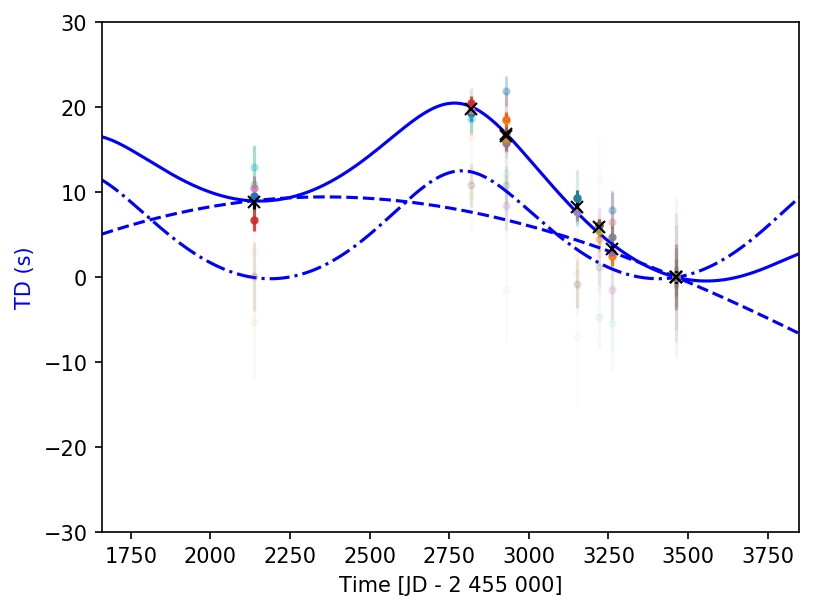

In [416]:
fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

for i in range(no_freqs_run):
    ax1.errorbar(t_td_BT - time_offset, tau_td_BT[i], yerr = tau_err_td_BT[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**2))
    ax1.errorbar(t_td_AT - time_offset, tau_td_AT[i], yerr = tau_err_td_AT[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**2))
    ax1.errorbar(t_td_RT - time_offset, tau_td_RT[i], yerr = tau_err_td_RT[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**2))
ax1.errorbar(t_td_BT - time_offset, tau_weighted_td_BT, yerr = tau_err_weighted_td_BT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_AT - time_offset, tau_weighted_td_AT, yerr = tau_err_weighted_td_AT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_RT - time_offset, tau_weighted_td_RT, yerr = tau_err_weighted_td_RT, fmt='.', marker='x', c='k')


ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

ax1.set_xlabel('Time [JD - 2 455 000]')
ax1.set_ylabel('TD (s)', color='b')

ax1.set_xlim(t_2014, t_2020)
ax1.set_ylim(-30,30)

# FREQS , AMPS & PHS

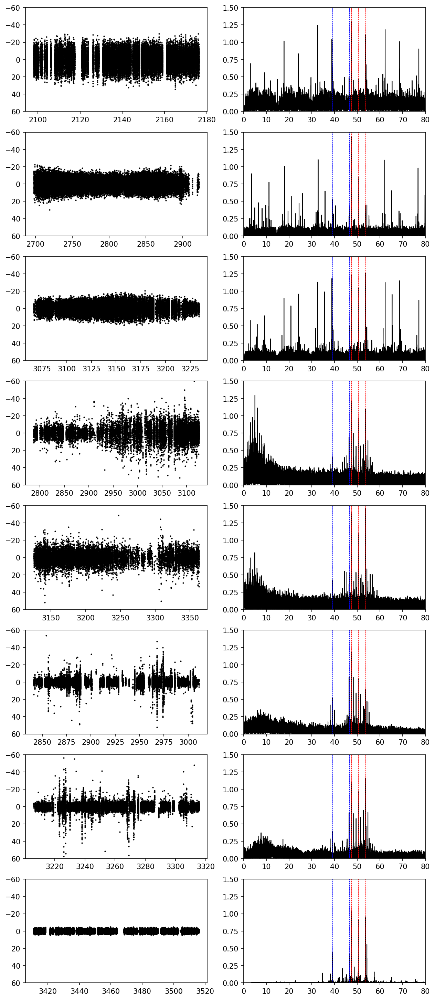

In [540]:
fig, ax = plt.subplots(8,2, figsize = (10,25))
for i in range(len(times_all)):
    ax[i, 0].scatter(times_all[i]-2455000, magnitudes_all[i]*1000, c='k', s=1)
    ax[i, 0].set_ylim(0.06*1000, -0.06*1000)
    
    freq_tmp = AS(times_all[i], magnitudes_all[i], 5)[0]
    amp_tmp = AS(times_all[i], magnitudes_all[i], 5)[1]
    
    ax[i, 1].plot(freq_tmp, amp_tmp*1000, lw=1, c='k')
    ax[i, 1].set_xlim(0, 80)
    ax[i, 1].set_ylim(0, 1.5)
    
    for j in range(3):
        ax[i, 1].axvline(f_TESS[j], c='r', ls='--', lw=0.5)
    for j in [3,4,5]:
        ax[i, 1].axvline(f_TESS[j], c='b', ls='--', lw=0.5)
        
plt.savefig('all_separate.png', dpi = 500)

In [546]:
times_all

[array([2457097.98961235, 2457097.98978935, 2457097.98996735, ...,
        2457176.31247614, 2457176.31259514, 2457176.31283414]),
 array([2457697.35263518, 2457697.35498618, 2457697.35522118, ...,
        2457921.92494084, 2457921.92517584, 2457921.92541084]),
 array([2458066.51742584, 2458066.51766084, 2458066.51789684, ...,
        2458233.85225077, 2458233.85248577, 2458233.85272077]),
 array([2457787.31215396, 2457787.31215399, 2457787.31584746, ...,
        2458125.20610148, 2458125.20986253, 2458125.21337652]),
 array([2458125.21711859, 2458125.22071864, 2458125.22441853, ...,
        2458362.81290488, 2458362.81633077, 2458362.81855613]),
 array([2457841.1423336, 2457841.144326 , 2457841.1453762, ...,
        2458011.1659874, 2458011.1669955, 2458011.168025 ]),
 array([2458206.1510377, 2458206.1530305, 2458206.1549982, ...,
        2458315.4373627, 2458315.4383451, 2458315.4396335]),
 array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
        2458516.08417223, 24

In [549]:
times_all[3]

array([2457787.31215396, 2457787.31215399, 2457787.31584746, ...,
       2458125.20610148, 2458125.20986253, 2458125.21337652])

In [550]:
times_all[4]

array([2458125.21711859, 2458125.22071864, 2458125.22441853, ...,
       2458362.81290488, 2458362.81633077, 2458362.81855613])

In [551]:
magnitudes_all[3]

array([-0.00051409,  0.00465882, -0.00119473, ...,  0.01169359,
        0.00228719, -0.00668832])

In [552]:
magnitudes_all[4]

array([ 0.00049421,  0.00108415, -0.00137867, ..., -0.0005171 ,
        0.00757143,  0.01642054])

In [601]:
def peaks_range(x_vals, y_vals, lower, upper):
    x_vals = np.array(x_vals)
    y_vals = np.array(y_vals)
    
    idx_range = np.arange(0, len(x_vals))
    
    upper_mask = x_vals < upper
    lower_mask = x_vals > lower
    
    mask = np.array(upper_mask & lower_mask)
    
    max_power = y_vals[mask].max()
    peaks, _ = find_peaks(y_vals[mask], height=max_power*0.5, distance=200 * len(x_vals)/10000)
    
    return(x_vals[mask], y_vals[mask], x_vals[mask][peaks], y_vals[mask][peaks])

In [602]:
peaks_range(freq_tmp, amp_tmp*1000, 35, 60)

(array([35.00551514, 35.01502234, 35.02452954, ..., 59.98093291,
        59.99044012, 59.99994732]),
 array([0.00277983, 0.00580242, 0.00413543, ..., 0.0036294 , 0.004205  ,
        0.00713934]),
 array([47.44093442, 50.49274603, 53.68716566]),
 array([0.96438716, 0.91909929, 0.62769732]))

9398
26948
20080
40548
28512
20403
13114
12622


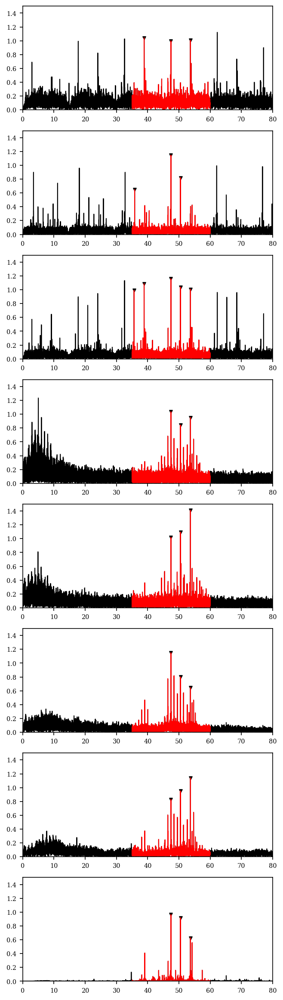

In [604]:
fig, ax = plt.subplots(8,1, figsize=(5, 20))
for i in range(8):
    AS_tmp = AS(times_all[i], magnitudes_all[i], 1)
    freq_tmp = AS_tmp[0]
    amp_tmp = AS_tmp[1]
    print(len(amp_tmp))
    ax[i].plot(freq_tmp, amp_tmp*1000, lw=1, alpha=1, c='k')
    ax[i].set_xlim(0, 80)
    ax[i].set_ylim(0, 1.5)
    peaks_tmp = peaks_range(freq_tmp, amp_tmp*1000, 35, 60)
    ax[i].scatter(peaks_tmp[2], peaks_tmp[3], marker="v", s=10, c='k')
    ax[i].plot(peaks_tmp[0], peaks_tmp[1], lw=1, alpha=1, c='r')

In [ ]:
print('Calculate AS')
#AS
freq, amp = AS(times, mags, 15)

fig, ax = plt.subplots(1, 1, figsize=(7, 4))

ax.plot(freq, amp, c = 'k', lw = 1)


freq=freq[5000:]
amp=amp[5000:]
#ax.plot(freq, amp, c = 'k', lw = 1)


# PEAKS
max_power = amp.max()

peaks, _ = find_peaks(amp, height=max_power*0.02, distance=200)
ax.scatter(freq[peaks], amp[peaks] + 0.03*max_power, marker="v", s=10, c='k')

ax.set_xlim(0,120)
ax.set_ylim(0, 0.0012)
ax.set_xlabel('Frequency [c/d]')
ax.set_ylabel('Ampl. [mag]')


# FREQS SORTED BY AMPLITUDE
sort_idx = np.argsort(amp[peaks])[::-1]
f_TESS = freq[peaks][sort_idx]
a_TESS = amp[peaks][sort_idx]
print(len(f_TESS))


print('Calculate Phases')
# PHASES
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)



In [459]:
y_tau_b_sim*86400-(td_weighted*86400+y_offset)

array([-0.73194298,  1.22163861,  4.26342244])

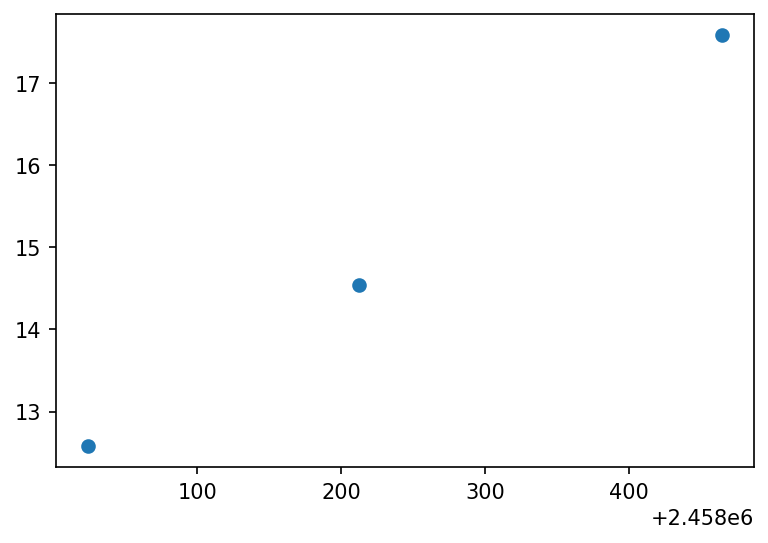

In [467]:
plt.scatter(time_midpoints, y_tau_b_sim*86400-time_delays[0][-1]-(td_weighted*86400-td_weighted[-1]*86400))

In [ ]:
(rms2((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset))

# REAL DATA

In [207]:
def highpass(flux, order, sigma):
    highpass_lst = []
    highpass_lst.append(flux)
    
    for i in range(0, order):
        lowpass = gaussian_filter(highpass_lst[i], sigma=sigma)
        highpass = highpass_lst[i] - lowpass
        highpass_lst.append(highpass)

    return highpass_lst

## BRITE

In [215]:
datadir = os.getcwd()
datadir_BRITE = '/BRITE'
datafileB15 = '/betaPic_2015_BHr.dat'
datafileB16 = '/betaPic_2016_BTrBHr.dat'
datafileB17 = '/betaPic_2017_BHr.dat'

tB15, mB15 = np.loadtxt(datadir + datadir_BRITE + datafileB15, usecols=(0, 1)).T
tB16, mB16 = np.loadtxt(datadir + datadir_BRITE + datafileB16, usecols=(0, 1)).T
tB17, mB17 = np.loadtxt(datadir + datadir_BRITE + datafileB17, usecols=(0, 1)).T

In [216]:
datadir = os.getcwd()
datafileB15 = '/times2015.txt.bjd'
datafileB16 = '/times2016.txt.bjd'
datafileB17 = '/times2017.txt.bjd'

tB15_BJD = np.loadtxt(datadir + datafileB15, usecols=(0)).T
tB16_BJD = np.loadtxt(datadir + datafileB16, usecols=(0)).T
tB17_BJD = np.loadtxt(datadir + datafileB17, usecols=(0)).T

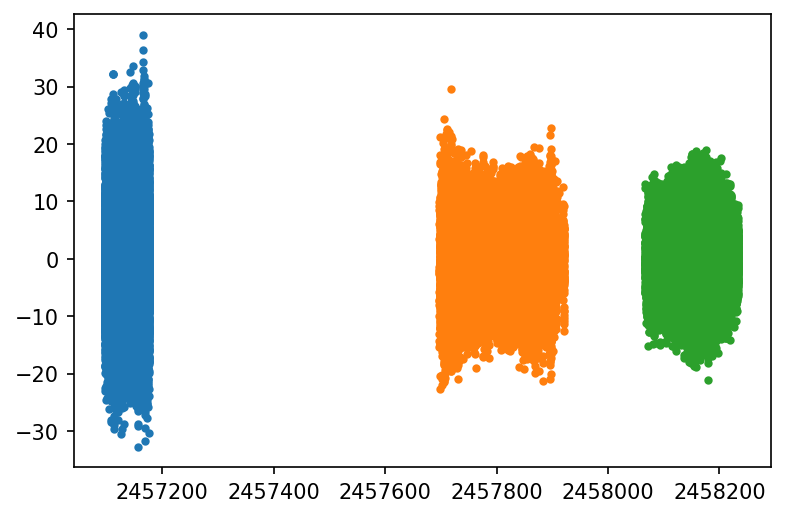

In [217]:
plt.scatter(tB15_BJD, mB15, marker='.')
plt.scatter(tB16_BJD, mB16, marker='.')
plt.scatter(tB17_BJD, mB17, marker='.')

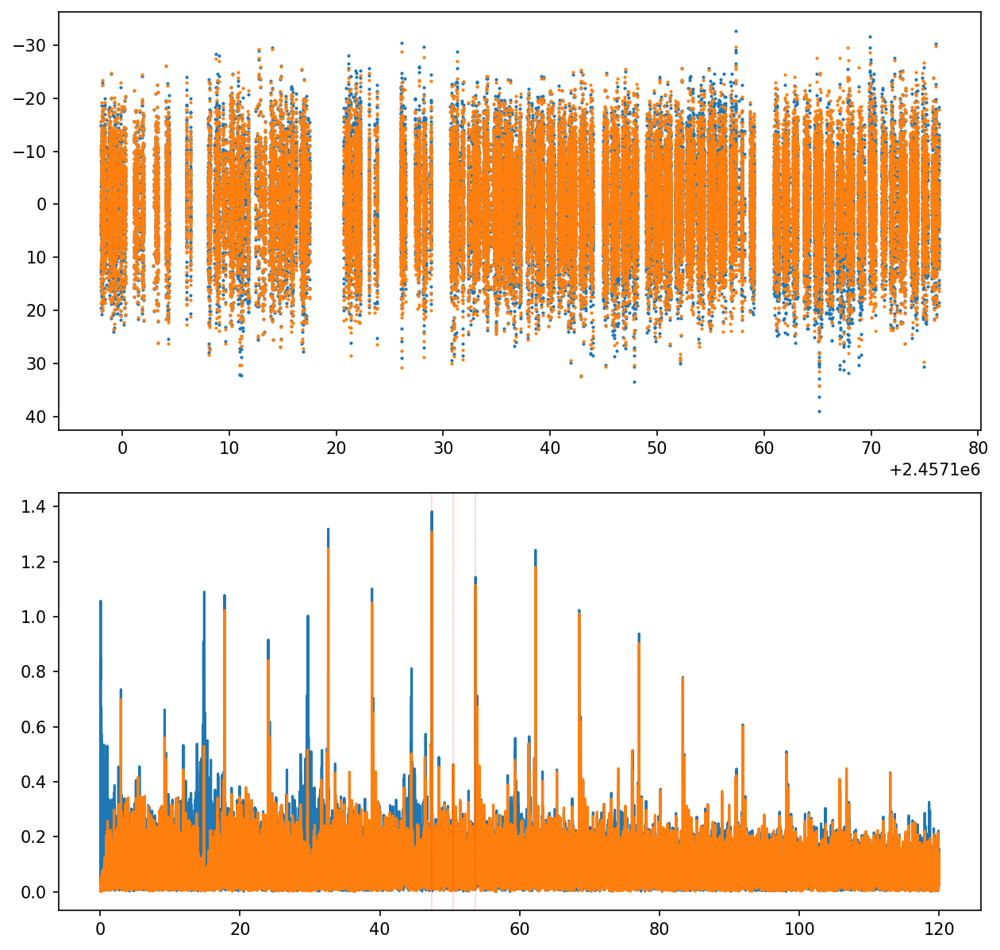

In [315]:
highpass_own = highpass(mB15, 5, 250)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(tB15_BJD, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(tB15_BJD, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(tB15_BJD, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(tB15_BJD, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
mB15_gaus = highpass_own[hpmax]

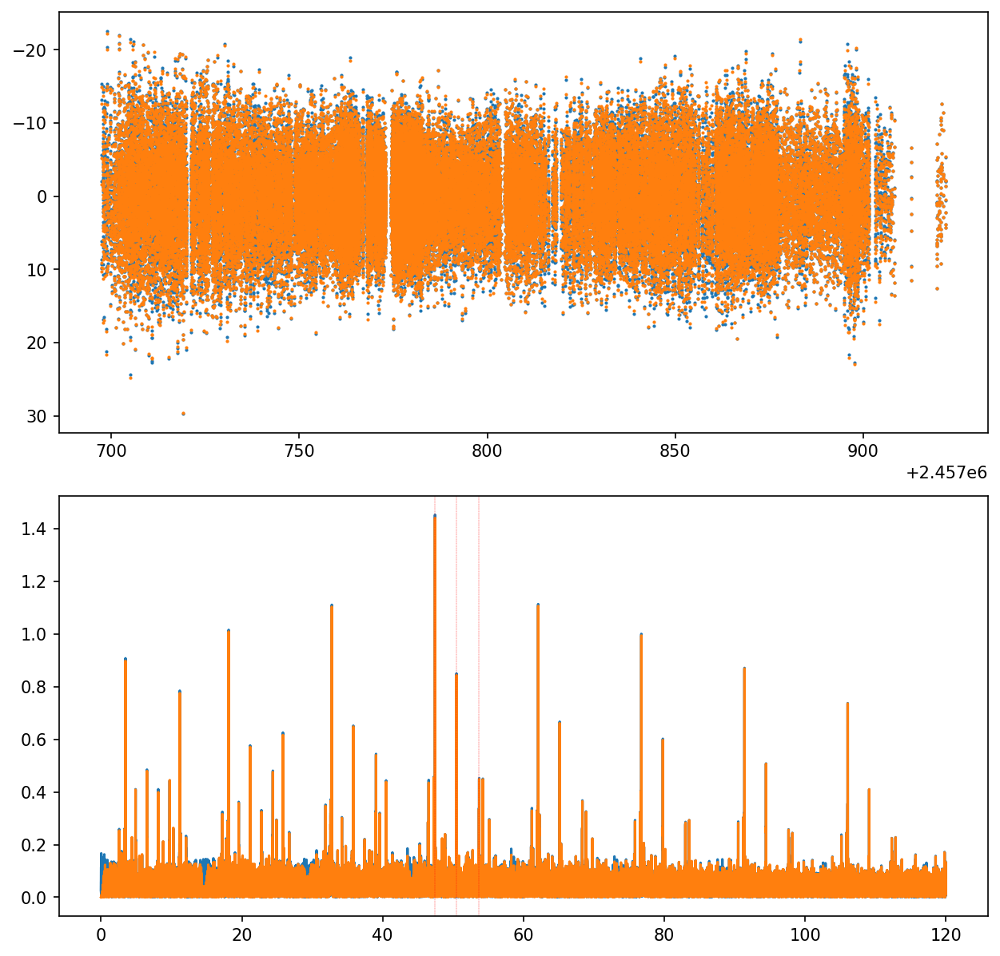

In [316]:
highpass_own = highpass(mB16, 5, 250)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(tB16_BJD, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(tB16_BJD, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(tB16_BJD, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(tB16_BJD, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
mB16_gaus = highpass_own[hpmax]

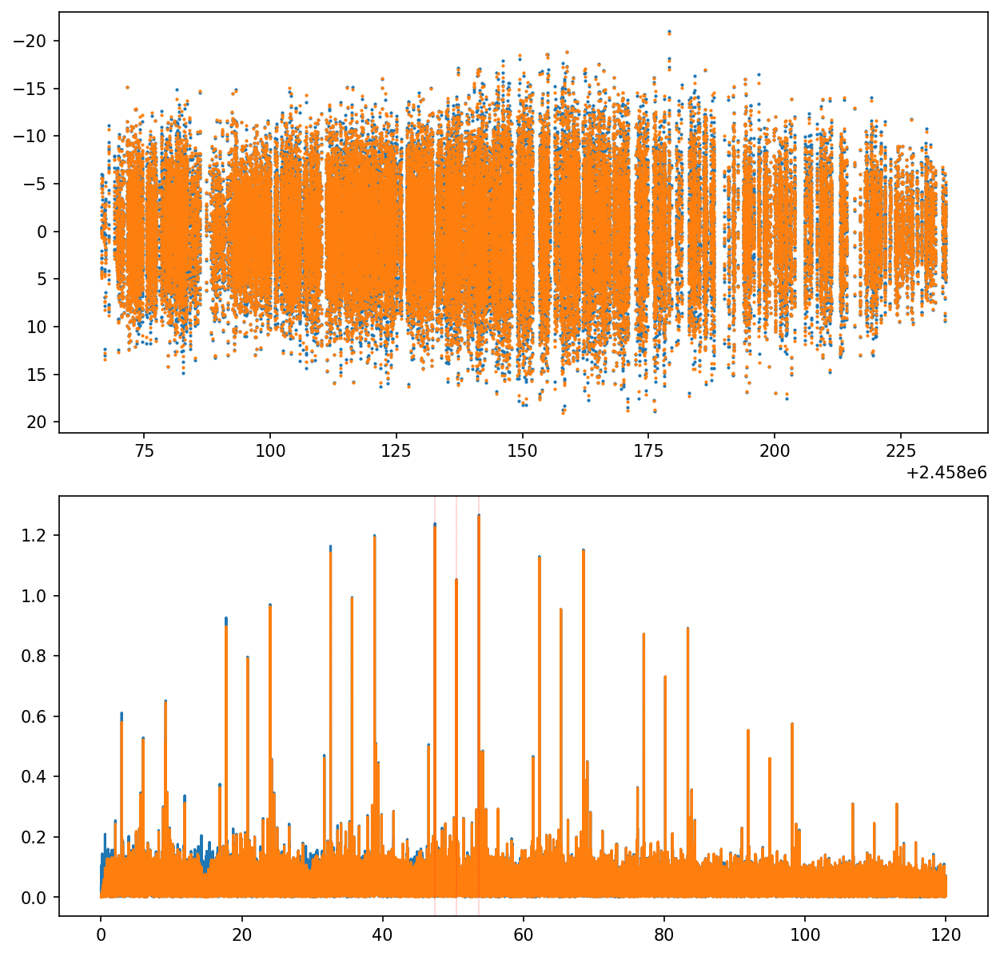

In [317]:
highpass_own = highpass(mB17, 5, 250)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(tB17_BJD, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(tB17_BJD, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(tB17_BJD, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(tB17_BJD, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
mB17_gaus = highpass_own[hpmax]

# bRing

In [290]:
datadir = os.getcwd()
datadir_bRing = '/bRing'
datafile_bRing = '/Reduced_2110269.fits'

In [291]:
fits_image_filename = datadir+datadir_bRing+datafile_bRing
hdul = fits.open(fits_image_filename)
hdul[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   32 / length of dimension 1                          
NAXIS2  =                42360 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                    4 / number of table fields                         
TTYPE1  = 'jd      '                                                            
TFORM1  = 'D       '                                                            
TTYPE2  = 'raw     '                                                            
TFORM2  = 'D       '                                                            
TTYPE3  = 'reduced '        

In [292]:
databring = fits.getdata(datadir+datadir_bRing+datafile_bRing)
bsel = np.where(np.isfinite(databring['reduced']))[0]
jd = databring['jd'][bsel]
raw = databring['raw'][bsel]
reduced = databring['reduced'][bsel]
reducedHF = databring['reducedHF'][bsel]

In [293]:
clip1 = sigma_clip(reduced, sigma=5, cenfunc=np.median, iters=1)
mags_clip1 = clip1[~clip1.mask].data
times_clip1 = jd[~clip1.mask]

clipN = sigma_clip(reduced, sigma=4, cenfunc=np.median, iters=None)
mags_clipN = clipN[~clipN.mask].data
times_clipN = jd[~clipN.mask]

In [294]:
t_bRing = times_clip1
m_bRing = mags_clip1

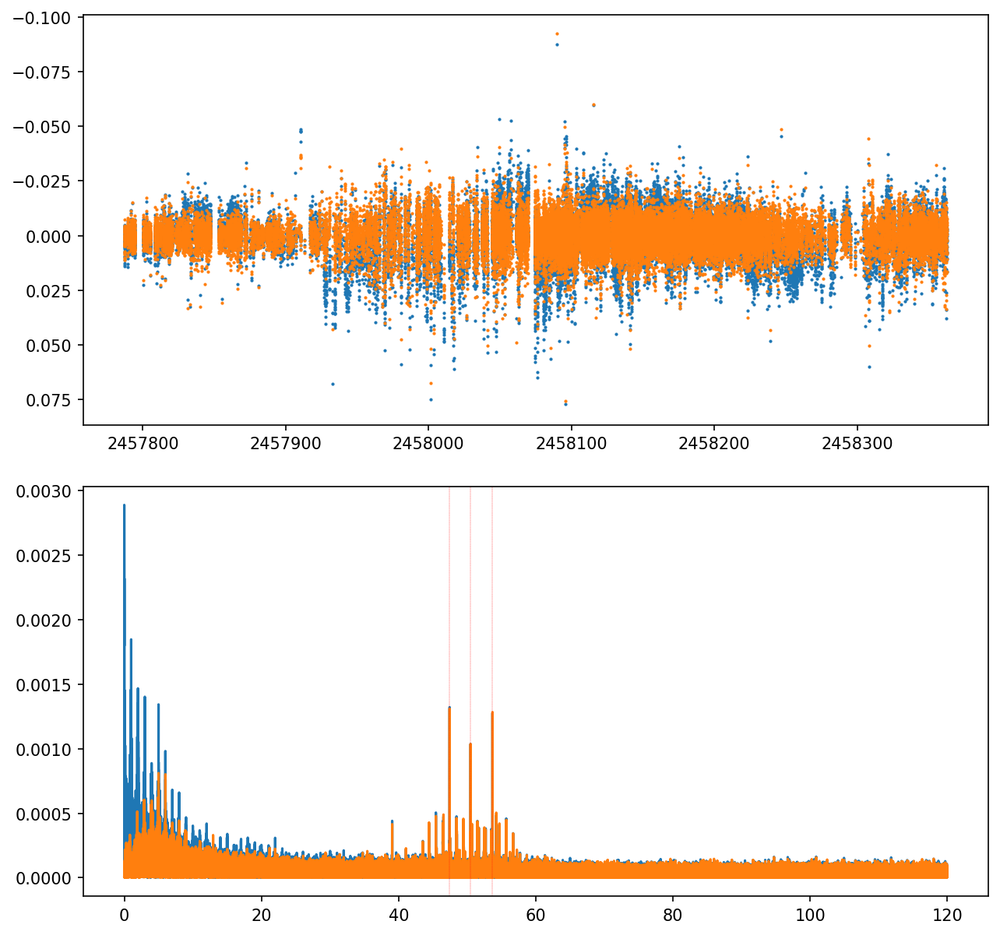

In [318]:
highpass_own = highpass(m_bRing, 5, 30)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(t_bRing, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(t_bRing, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(t_bRing, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(t_bRing, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
m_bRing_gaus = highpass_own[hpmax]

# ASTEP

In [302]:
datadir = os.getcwd() 
datadir_ASTEP = '/ASTEP'

astep17 = np.recfromcsv(datadir+datadir_ASTEP+'/bjd_bp_flux_2017.csv')
astep18 = np.recfromcsv(datadir+datadir_ASTEP+'/bjd_bp_flux_2018.csv')

In [303]:
astep17flux = (astep17['flux1']-4*astep17['fsky1'])/(astep17['flux3']-4*astep17['fsky3'])
astep18flux = (astep18['flux1']-4*astep18['fsky1'])/(astep18['flux3']-4*astep18['fsky3'])
astep17nflux = astep17flux/np.nanmedian(astep17flux)
astep18nflux = astep18flux/np.nanmedian(astep18flux)
a17sel = np.where(np.isfinite(astep17nflux) & (astep17['sunelev'] < -18) & (astep17['xs1'] == 2048) & (astep17['ys1'] == 2048))[0]
a18sel = np.where(np.isfinite(astep18nflux) & (astep18['sunelev'] < -18) & (astep18['xs1'] == 2048) & (astep18['ys1'] == 2048))[0]

In [236]:
# t_ASTEP = np.concatenate((astep17['bjd'][a17sel]+2400000, astep18['bjd'][a18sel]+2400000), axis=None)
# m_ASTEP = np.concatenate((astep17nflux[a17sel], astep18nflux[a18sel]), axis=None)

In [304]:
t_ASTEP17 = astep17['bjd'][a17sel]+2400000
t_ASTEP18 = astep18['bjd'][a18sel]+2400000
m_ASTEP17 = astep17nflux[a17sel]
m_ASTEP18 = astep18nflux[a18sel]

In [305]:
clip1 = sigma_clip(m_ASTEP17, sigma=5, cenfunc=np.median, iters=1)
mags_clip1 = clip1[~clip1.mask].data
times_clip1 = (t_ASTEP17)[~clip1.mask]

t_ASTEP17 = times_clip1
m_ASTEP17 = -2.5*np.log10(mags_clip1)

clip1 = sigma_clip(m_ASTEP18, sigma=5, cenfunc=np.median, iters=1)
mags_clip1 = clip1[~clip1.mask].data
times_clip1 = (t_ASTEP18)[~clip1.mask]

t_ASTEP18 = times_clip1
m_ASTEP18 = -2.5*np.log10(mags_clip1)

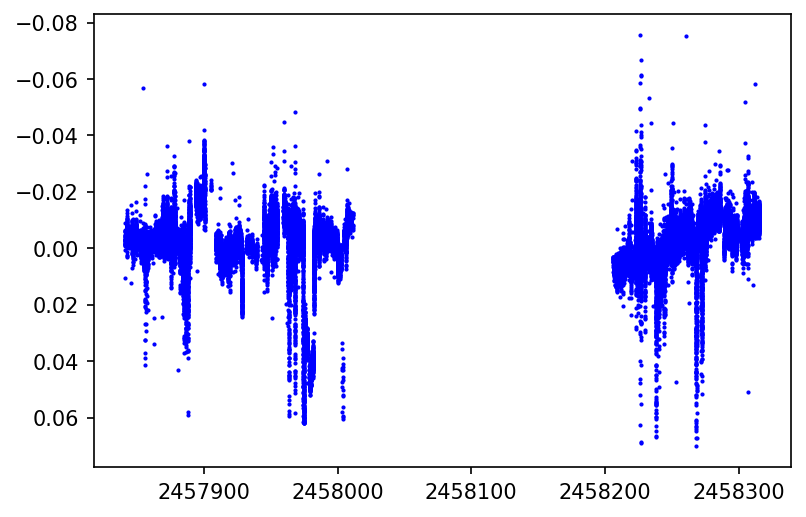

In [306]:
plt.scatter(t_ASTEP17,m_ASTEP17,c='b',label='ASTEP', s=1)
plt.scatter(t_ASTEP18,m_ASTEP18,c='b', s=1)
plt.gca().invert_yaxis()
#plt.ylim(0,2)

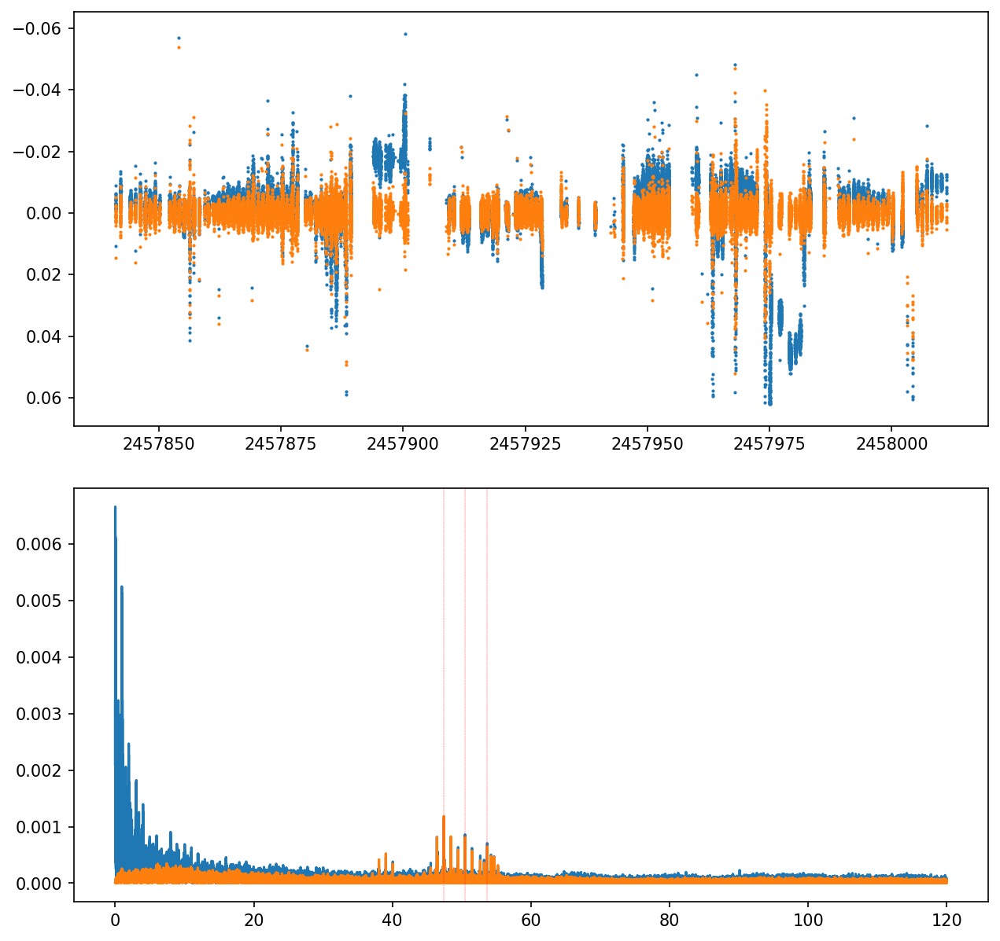

In [319]:
highpass_own = highpass(m_ASTEP17, 5, 50)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(t_ASTEP17, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(t_ASTEP17, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(t_ASTEP17, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(t_ASTEP17, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
m_ASTEP17_gaus = highpass_own[hpmax]

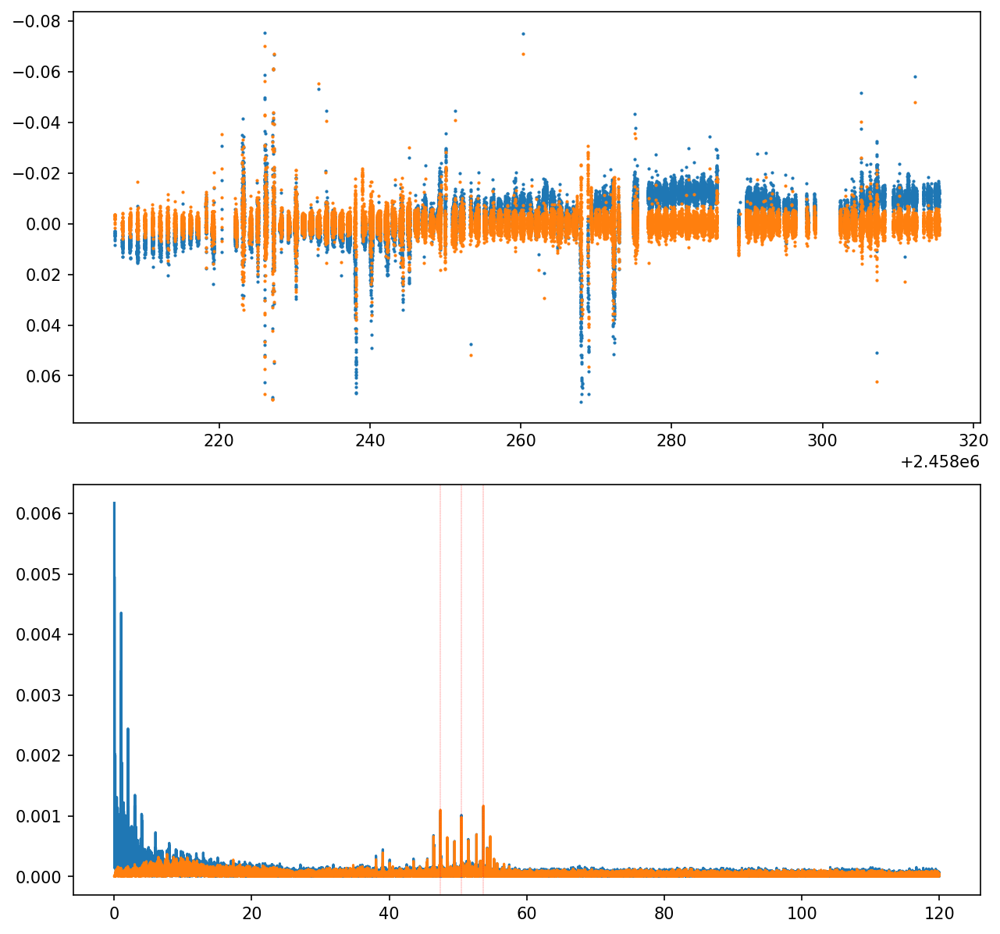

In [320]:
highpass_own = highpass(m_ASTEP18, 5, 50)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(t_ASTEP18, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(t_ASTEP18, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(t_ASTEP18, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(t_ASTEP18, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
m_ASTEP18_gaus = highpass_own[hpmax]

# TESS

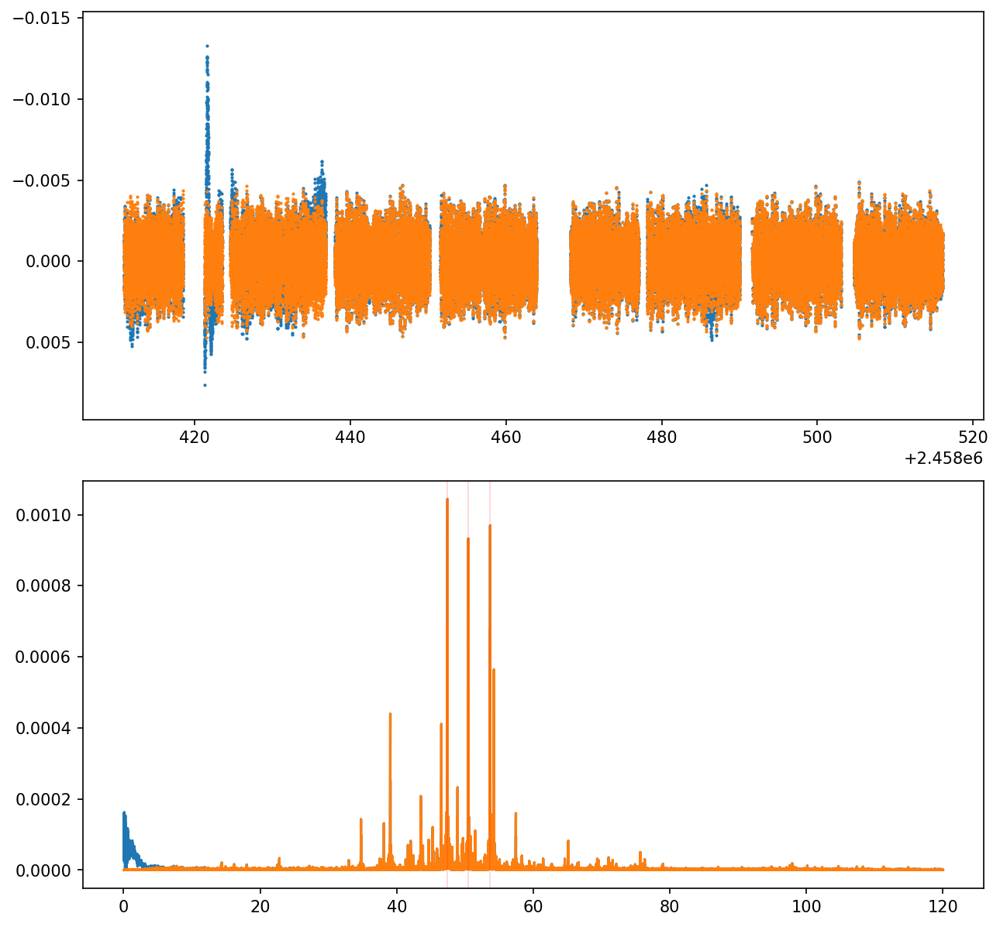

In [321]:
highpass_own = highpass(mags, 5, 50)
hpmax = len(highpass_own)-1

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

ax[0].scatter(times, highpass_own[0], s=1, label='{0}'.format(i), alpha=1, c='C0')
ax[0].scatter(times, highpass_own[hpmax], s=1, label='{0}'.format(i), alpha=1, c='C1')
ax[0].invert_yaxis()

plt.subplots_adjust(hspace=0.15)


#AS
freq_tmp, amp_tmp = AS(times, highpass_own[0], 15)
ax[1].plot(freq_tmp, amp_tmp)

freq_tmp, amp_tmp = AS(times, highpass_own[hpmax], 15)
ax[1].plot(freq_tmp, amp_tmp)

for i in range(3):
    ax[1].axvline(f_TESS[i], c='r', ls='--', lw=0.2)
    
mags_gaus = highpass_own[hpmax]

In [253]:
t_2015 = 2457024.0-2457000.0
t_2016 = 2457389.0-2457000.0
t_2017 = 2457755.0-2457000.0
t_2018 = 2458120.0-2457000.0
t_2019 = 2458485.0-2457000.0

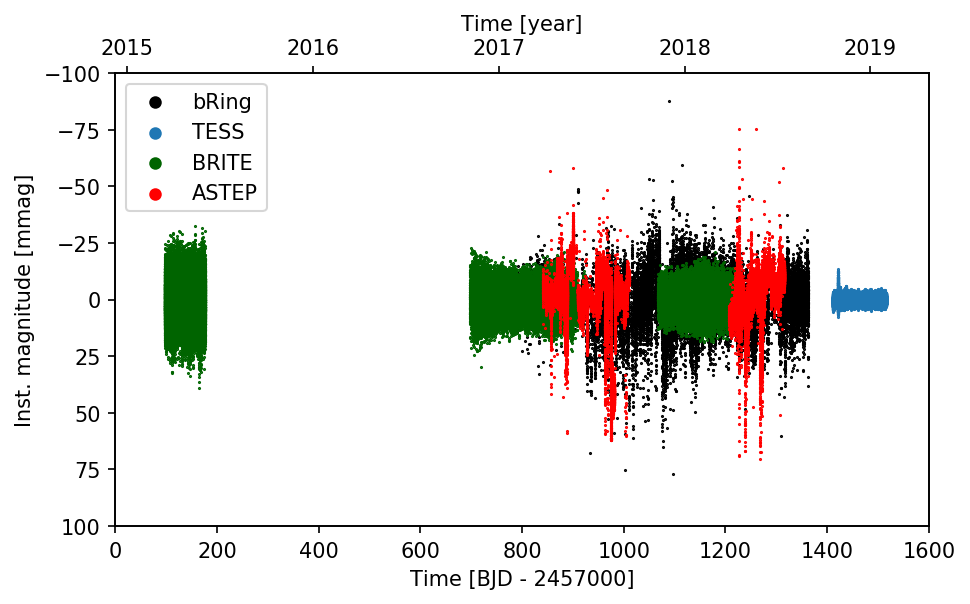

In [258]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))

ax.scatter(t_bRing-2457000, m_bRing*1000, s=1, c='k', label = 'bRing', marker='.')

ax.scatter(times-2457000, mags*1000, s=1, label = 'TESS', marker='.')

t_combB = np.concatenate((tB15_BJD, tB16_BJD, tB17_BJD), axis=None)
m_combB = np.concatenate((mB15/1000, mB16/1000, mB17/1000), axis=None)

ax.scatter(t_combB-2457000, m_combB*1000, marker='.', s=1, c = 'darkgreen', label = 'BRITE')

#ax.scatter(tB16_BJD, mB16/1000, marker='.', s=1)
#ax.scatter(tB17_BJD, mB17/1000, marker='.', s=1)

ax.scatter(t_ASTEP17-2457000, m_ASTEP17*1000, marker='.', s=1, c='r', label = 'ASTEP')
ax.scatter(t_ASTEP18-2457000, m_ASTEP18*1000, marker='.', s=1, c='r')

ax.invert_yaxis()

ax.set_xlim(0, 1600)
ax.set_ylim(100, -100)


ax.set_xlabel('Time [BJD - 2457000]')
ax.set_ylabel('Inst. magnitude [mmag]')



ax2 = ax.twiny()
ax2.tick_params(axis='x', rotation=0)


ax2.set_xticks([t_2015,t_2016,t_2017,t_2018,t_2019])

xmin1, xmax1 = ax.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2015', '2016', '2017', '2018', '2019'],fontsize=10)
ax2.set_xlabel('Time [year]')


ax.legend(markerscale=10, prop={'size': 10})

#plt.savefig('total_lc.png', dpi = 550)

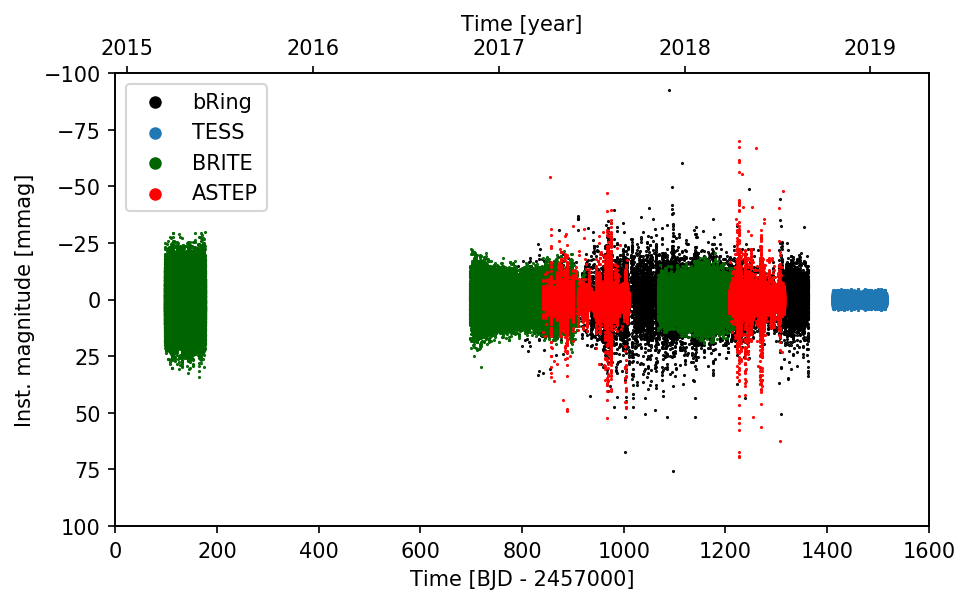

In [322]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))

ax.scatter(t_bRing-2457000, m_bRing_gaus*1000, s=1, c='k', label = 'bRing', marker='.')

ax.scatter(times-2457000, mags_gaus*1000, s=1, label = 'TESS', marker='.')

t_combB = np.concatenate((tB15_BJD, tB16_BJD, tB17_BJD), axis=None)
m_combB = np.concatenate((mB15_gaus/1000, mB16_gaus/1000, mB17_gaus/1000), axis=None)

ax.scatter(t_combB-2457000, m_combB*1000, marker='.', s=1, c = 'darkgreen', label = 'BRITE')

#ax.scatter(tB16_BJD, mB16/1000, marker='.', s=1)
#ax.scatter(tB17_BJD, mB17/1000, marker='.', s=1)

ax.scatter(t_ASTEP17-2457000, m_ASTEP17_gaus*1000, marker='.', s=1, c='r', label = 'ASTEP')
ax.scatter(t_ASTEP18-2457000, m_ASTEP18_gaus*1000, marker='.', s=1, c='r')

ax.invert_yaxis()

ax.set_xlim(0, 1600)
ax.set_ylim(100, -100)


ax.set_xlabel('Time [BJD - 2457000]')
ax.set_ylabel('Inst. magnitude [mmag]')



ax2 = ax.twiny()
ax2.tick_params(axis='x', rotation=0)


ax2.set_xticks([t_2015,t_2016,t_2017,t_2018,t_2019])

xmin1, xmax1 = ax.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2015', '2016', '2017', '2018', '2019'],fontsize=10)
ax2.set_xlabel('Time [year]')


ax.legend(markerscale=10, prop={'size': 10})

#plt.savefig('total_lc.png', dpi = 550)

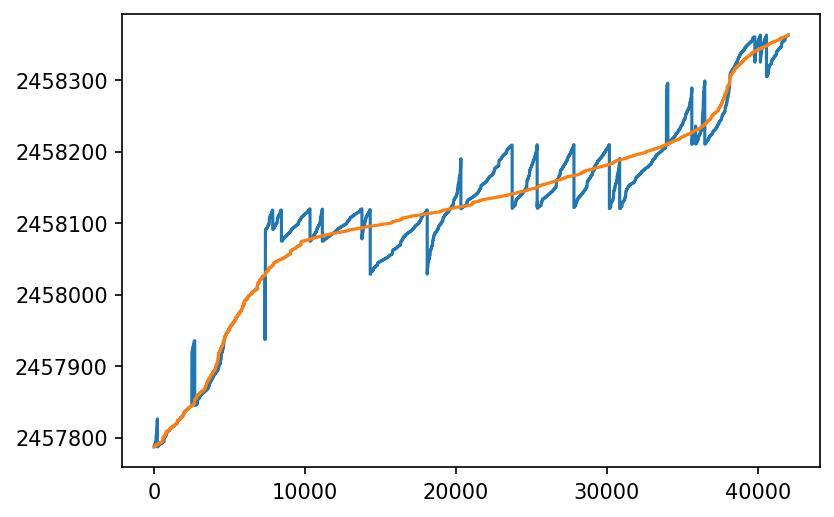

In [334]:
plt.plot(range(len(t_bRing)), t_bRing)

sort_idx_bRing = np.argsort(t_bRing)

plt.plot(range(len(t_bRing)), t_bRing[sort_idx_bRing])

In [328]:
times_all = [tB15_BJD, tB16_BJD, tB17_BJD, t_bRing[sort_idx_bRing], t_ASTEP17, t_ASTEP18, times]
magnitudes_all = [mB15_gaus/1000, mB16_gaus/1000, mB17_gaus/1000,m_bRing_gaus[sort_idx_bRing], m_ASTEP17_gaus, m_ASTEP18_gaus, mags_gaus]

In [338]:
bRing_len = len(t_bRing[sort_idx_bRing])

In [339]:
bRing_len

42021

In [346]:
t_bRing[sort_idx_bRing][:bRing_len//2]

array([2457787.31215396, 2457787.31215399, 2457787.31584746, ...,
       2458125.20610148, 2458125.20986253, 2458125.21337652])

In [347]:
t_bRing[sort_idx_bRing][bRing_len//2:]

array([2458125.21711859, 2458125.22071864, 2458125.22441853, ...,
       2458362.81290488, 2458362.81633077, 2458362.81855613])

In [348]:
times_all = [tB15_BJD, tB16_BJD, tB17_BJD, t_bRing[sort_idx_bRing][:bRing_len//2], t_bRing[sort_idx_bRing][bRing_len//2:], t_ASTEP17, t_ASTEP18, times]
magnitudes_all = [mB15_gaus/1000, mB16_gaus/1000, mB17_gaus/1000, m_bRing_gaus[sort_idx_bRing][:bRing_len//2], m_bRing_gaus[sort_idx_bRing][bRing_len//2:], m_ASTEP17_gaus, m_ASTEP18_gaus, mags_gaus]

In [371]:
times_all

[array([2457097.98961235, 2457097.98978935, 2457097.98996735, ...,
        2457176.31247614, 2457176.31259514, 2457176.31283414]),
 array([2457697.35263518, 2457697.35498618, 2457697.35522118, ...,
        2457921.92494084, 2457921.92517584, 2457921.92541084]),
 array([2458066.51742584, 2458066.51766084, 2458066.51789684, ...,
        2458233.85225077, 2458233.85248577, 2458233.85272077]),
 array([2457787.31215396, 2457787.31215399, 2457787.31584746, ...,
        2458125.20610148, 2458125.20986253, 2458125.21337652]),
 array([2458125.21711859, 2458125.22071864, 2458125.22441853, ...,
        2458362.81290488, 2458362.81633077, 2458362.81855613]),
 array([2457841.1423336, 2457841.144326 , 2457841.1453762, ...,
        2458011.1659874, 2458011.1669955, 2458011.168025 ]),
 array([2458206.1510377, 2458206.1530305, 2458206.1549982, ...,
        2458315.4373627, 2458315.4383451, 2458315.4396335]),
 array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
        2458516.08417223, 24

In [368]:
times_all[7]

array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
       2458516.08417223, 2458516.08556108, 2458516.08694993])

(2457000, 2458600)

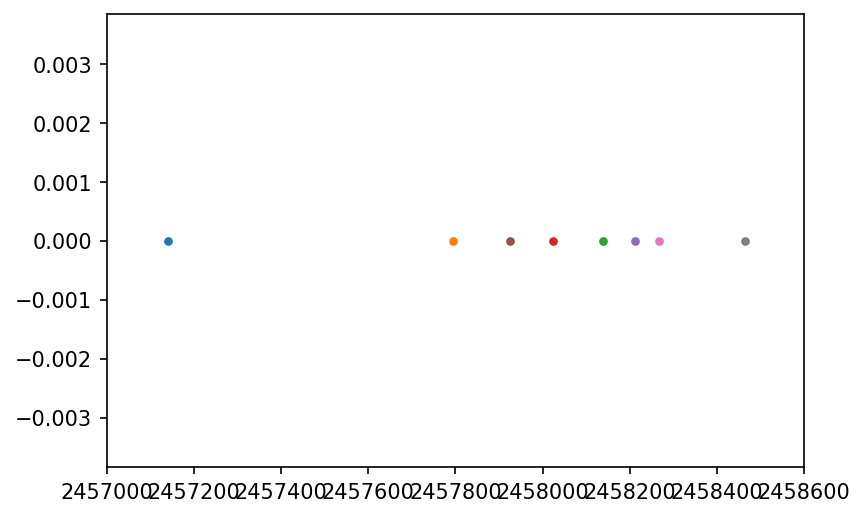

In [370]:
for i in range(8):
    plt.scatter(np.mean(times_all[i]), 0, s=10)
    plt.gca().invert_yaxis()
plt.xlim(0+2457000, 1600+2457000)
#plt.ylim(100/1000, -100/1000)

DEFINE AS FUNTION
CALCULATE FREQS OF BETA PIC
***BRITE***
CALCULATE TIMES
177.30484412907197
0
CREATE MULTISINE MODEL
# of freqs: 9
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
[2457097.98961235 2457097.98978935 2457097.98996735 ... 2458516.08417223
 2458516.08556108 2458516.08694993]
[0.0108805  0.00353349 0.00787454 ... 0.00140022 0.00100278 0.00012563]
0
44235
1
111813
2
165075
3
229684
[2457140.9788552416, 2457793.8176745307, 2458138.9704581723, 2458464.3601464923]
Calc TD
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:394: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


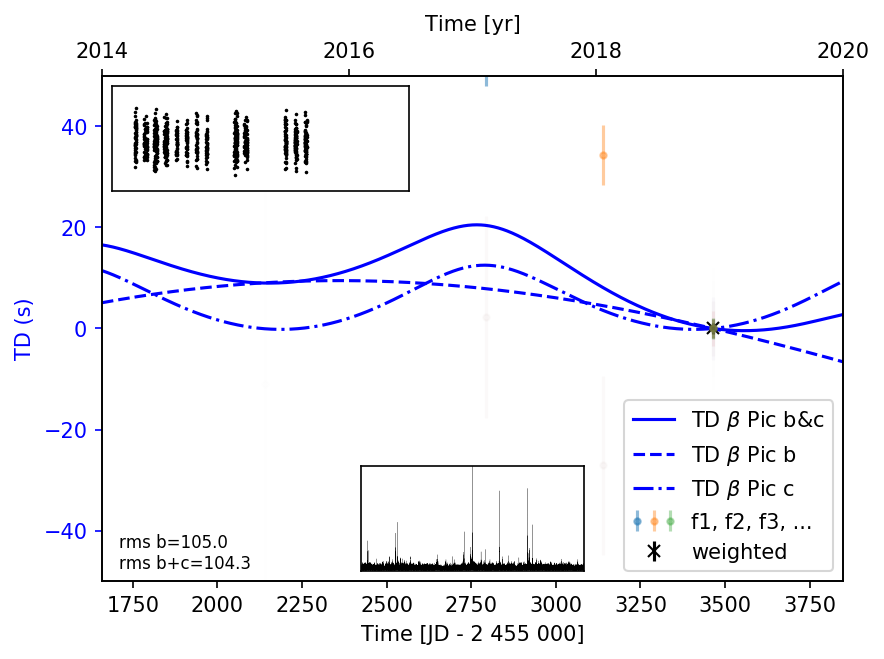

***ASTEP***
CALCULATE TIMES
30.000484593589597
0
CREATE MULTISINE MODEL
# of freqs: 9
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
[2457841.1423336  2457841.144326   2457841.1453762  ... 2458516.08417223
 2458516.08556108 2458516.08694993]
[-0.00060937  0.00054271  0.00233341 ...  0.00140022  0.00100278
  0.00012563]
0
31920
1
64018
2
128627
[2457924.262470069, 2458266.254049932, 2458464.3601464923]
Calc TD
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:731: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


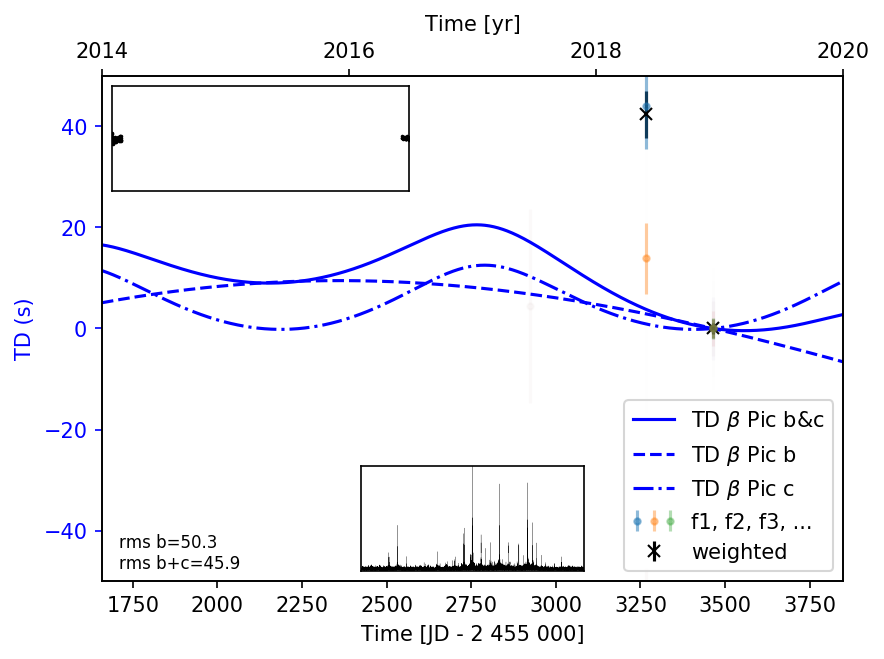

***bRing***
CALCULATE TIMES
29.999720158803175
0
CREATE MULTISINE MODEL
# of freqs: 9
CALCULATE TIME DELAYS (MODEL)
CALCULATE TIME DELAYS (DATA)
[2457787.31215396 2457787.31215399 2457787.31584746 ... 2458516.08417223
 2458516.08556108 2458516.08694993]
[-0.00051409  0.00465882 -0.00119473 ...  0.00140022  0.00100278
  0.00012563]
0
21009
1
42020
2
106629
[2458024.242832022, 2458212.3137655878, 2458464.3601464923]
Calc TD
DOWNLOAD JDs
CALCULATE WEIGHTED VALUES
PLOT EVERYTHING


/home/sebastian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1068: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


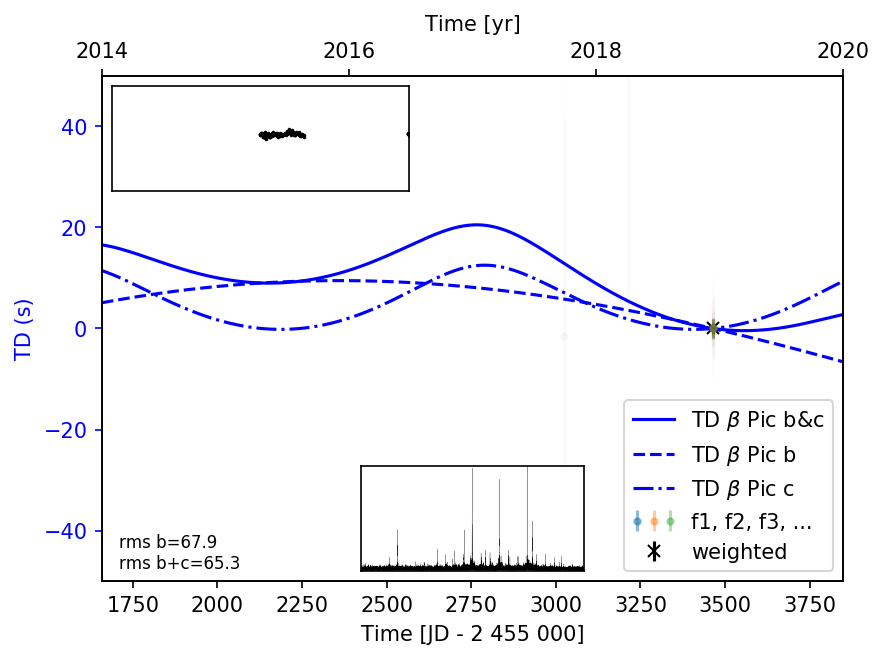

(-50, 50)

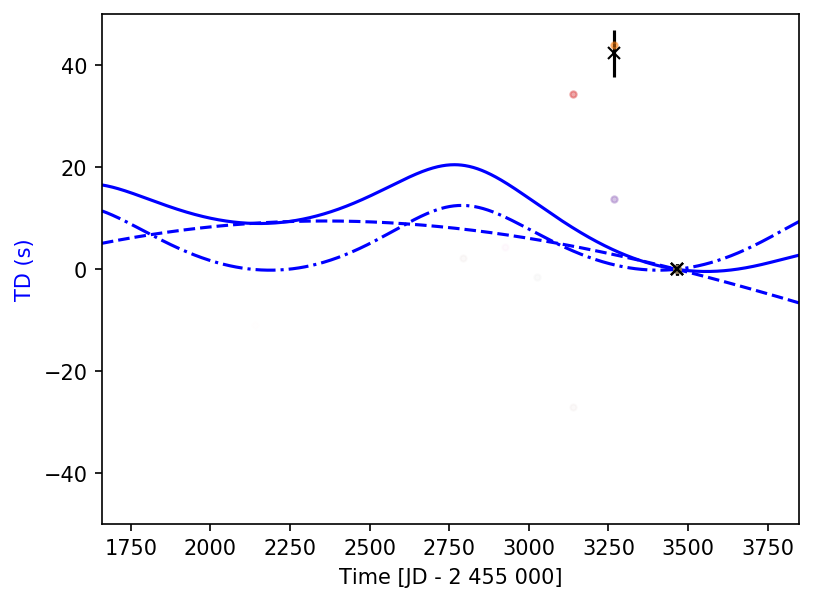

In [435]:
no_freqs_run = 9
no_freqs_run_weighted = 3
noise_TESS_mag_hour_ppm = 0#19.91
noise_hour_ppm = noise_TESS_mag_hour_ppm
#segment_size = 20


# print('DOWNLOAD DATA')
# for name in ['beta Pictoris']:
#     sr = lk.search_lightcurvefile(name)
#     print(sr)

#     if len(sr) > 0:

#         #Download data
#         lcfs = sr.download_all()

#         # Use the normalized PDCSAP_FLUX
#         lc0 = lcfs[0].SAP_FLUX.normalize()
#         lc1 = lcfs[0].PDCSAP_FLUX.normalize()

#         # Loop through the rest of the LCFS, appending to the first light curve
#         for lcf in lcfs[1:]:
#             lc0 = lc0.append(lcf.SAP_FLUX.normalize())
#             lc1 = lc1.append(lcf.PDCSAP_FLUX.normalize())

#         #Remove bad quality and nans
#         q0 = lc0.quality == 0
#         lc0 = lc0[q0].remove_nans()
#         q1 = lc1.quality == 0
#         lc1 = lc1[q1].remove_nans()
#         #Plot data
#         ax = lc0.scatter(label = 'SAP_FLUX')
#         lc1.scatter(ax=ax, label = 'PDCSAP_FLUX')

        
#         #Times & Mags
#         times = lc1.time + 2457000
#         mags = -2.5 * np.log10(lc1.flux)
#         mags = mags - np.median(mags)
        
#         x = times
#         y = mags

        
print('DEFINE AS FUNTION')
#Amplitude Spectrum Function
def AS(times, flux, oversample):
    timebase = max(times) - min(times)
    tmin = min(times)
    tmax = max(times)
    df = 1.0 / (tmax - tmin)
    dt = np.median(np.diff(times))
    ny = 0.5 / dt
    oversample = oversample

    freq = np.arange(df, 120, df / oversample)
    model = LombScargle(times, flux)
    power = model.power(freq, method = 'fast', normalization = 'psd')
    fct = np.sqrt(4 / len(times))
    amp = np.sqrt(np.abs(power)) * fct
    
    return((freq, amp))


print('CALCULATE FREQS OF BETA PIC')

#AS
freq, amp = AS(times, mags, 15)
freq=freq[5000:]
amp=amp[5000:]

# PEAKS
max_power = amp.max()
peaks, _ = find_peaks(amp, height=max_power*0.02, distance=200)

# FREQS SORTED BY AMPLITUDE
sort_idx = np.argsort(amp[peaks])[::-1]
f_TESS = freq[peaks][sort_idx]
a_TESS = amp[peaks][sort_idx]
#print(len(f_TESS))









print('***BRITE***')
##############################################################################################
#BRITE + TESS

print('CALCULATE TIMES')


everything = idiot([0,1,2,7], times_all, magnitudes_all)

segment_borders = everything[2]

times_run = everything[0]
magnitudes_run = everything[1]


cadence_hour = 1/(np.median(np.diff(times_run))*24) # Measurements in 1 hour
print(cadence_hour)
noise_run = noise_hour_ppm * 1e-6 * np.sqrt(cadence_hour)
noise_run_ppm = int(noise_run*1e6)
print(noise_run_ppm)



print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

# model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_run, noise_run)

print("# of freqs:", len(f_TESS))

print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_run, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_run, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)




print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_run
magnitudes_TD = magnitudes_run
print(times_TD)
print(magnitudes_TD)

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []


t_edge = []

iteration = 0


# Iterate over lightcurve
for t, y, idx in zip(times_TD, magnitudes_TD, range(len(times_TD))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []

        t_edge.append(t)
        iteration += 1         

print(time_midpoints) 
#phase = np.array(phase).T
#phase_err = np.array(phase_err).T

phase = np.unwrap(phase)
phase -= np.mean(phase)
phase = np.array(phase).T
phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

    

print('DOWNLOAD JDs')
jds = []
for i in np.arange(2014, 2022, 2):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])    



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)



print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim_curve = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim_curve = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2014 = jds[0] - time_offset
t_2016 = jds[1] - time_offset
t_2018 = jds[2] - time_offset
t_2020 = jds[3] - time_offset



#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
# lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim - td_weighted[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
# lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - td_weighted[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
# lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - td_weighted[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-50, 50)
ax1.set_xlim(t_2014, t_2020)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2014,t_2016,t_2018,t_2020])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2014', '2016', '2018', '2020'], fontsize=10)


ax2.set_xlabel('Time [yr]')
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

#y_offset = (y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 - td_weighted[-1]*86400
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, td_weighted*86400-td_weighted[-1]*86400, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, time_delays[i]*86400-time_delays[i][-1]*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-50, 50)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


textstr = '\n'.join((
    'rms b=%.1f' % (rms(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax1.text(0.02, 0.25, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')


fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)




t_td_BT = np.array(time_midpoints)
tau_td_BT = []
for j in range(len(f_TESS)):
    tau_td_BT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
tau_td_BT = np.array(tau_td_BT)
tau_err_td_BT = np.array(time_delays_err)
tau_weighted_td_BT = td_weighted*86400-td_weighted[-1]*86400
tau_err_weighted_td_BT = td_weighted_err*86400



















print('***ASTEP***')
##############################################################################################
#BRITE + ASTEP

print('CALCULATE TIMES')

everything = idiot([5,6,7], times_all, magnitudes_all)

segment_borders = everything[2]

times_run = everything[0]
magnitudes_run = everything[1]


cadence_hour = 1/(np.median(np.diff(times_run))*24) # Measurements in 1 hour
print(cadence_hour)
noise_run = noise_hour_ppm * 1e-6 * np.sqrt(cadence_hour)
noise_run_ppm = int(noise_run*1e6)
print(noise_run_ppm)



print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

#model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_run, noise_run)

print("# of freqs:", len(f_TESS))

print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_run, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_run, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)




print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_run
magnitudes_TD = magnitudes_run
print(times_TD)
print(magnitudes_TD)

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []


t_edge = []

iteration = 0


# Iterate over lightcurve
for t, y, idx in zip(times_TD, magnitudes_TD, range(len(times_TD))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []

        t_edge.append(t)
        iteration += 1         

print(time_midpoints) 
#phase = np.array(phase).T
#phase_err = np.array(phase_err).T

phase = np.unwrap(phase)
phase -= np.mean(phase)
phase = np.array(phase).T
phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

    

print('DOWNLOAD JDs')
jds = []
for i in np.arange(2014, 2022, 2):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])    



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)



print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim_curve = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim_curve = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2014 = jds[0] - time_offset
t_2016 = jds[1] - time_offset
t_2018 = jds[2] - time_offset
t_2020 = jds[3] - time_offset



#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
# lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim - td_weighted[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
# lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - td_weighted[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
# lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - td_weighted[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-50, 50)
ax1.set_xlim(t_2014, t_2020)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2014,t_2016,t_2018,t_2020])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2014', '2016', '2018', '2020'], fontsize=10)


ax2.set_xlabel('Time [yr]')
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

#y_offset = (y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 - td_weighted[-1]*86400
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, td_weighted*86400-td_weighted[-1]*86400, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, time_delays[i]*86400-time_delays[i][-1]*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-50, 50)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


textstr = '\n'.join((
    'rms b=%.1f' % (rms(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax1.text(0.02, 0.25, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')


fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)




t_td_AT = np.array(time_midpoints)
tau_td_AT = []
for j in range(len(f_TESS)):
    tau_td_AT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
tau_td_AT = np.array(tau_td_AT)
tau_err_td_AT = np.array(time_delays_err)
tau_weighted_td_AT = td_weighted*86400-td_weighted[-1]*86400
tau_err_weighted_td_AT = td_weighted_err*86400



















print('***bRing***')
##############################################################################################
#bRing + TESS

print('CALCULATE TIMES')

everything = idiot([3,4,7], times_all, magnitudes_all)

segment_borders = everything[2]

times_run = everything[0]
magnitudes_run = everything[1]


cadence_hour = 1/(np.median(np.diff(times_run))*24) # Measurements in 1 hour
print(cadence_hour)
noise_run = noise_hour_ppm * 1e-6 * np.sqrt(cadence_hour)
noise_run_ppm = int(noise_run*1e6)
print(noise_run_ppm)



print('CREATE MULTISINE MODEL')

#Phases
f_TESS = f_TESS[:no_freqs_run]
a_TESS = a_TESS[:no_freqs_run]
p_TESS = dft_phase(times, mags, f_TESS)/(2*np.pi)

#model_times = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_run, noise_run)

print("# of freqs:", len(f_TESS))

print('CALCULATE TIME DELAYS (MODEL)')
#_b
star_planet_ratio_b = 1.8 / 11 * 1048
a2sini_b = 9.66 * np.sin(np.deg2rad(88.81))
e_b = 0.08
varpi_b = np.deg2rad(205.8)
Porb_b = 22.47*365.25
tp_b = 2455992

#_c
star_planet_ratio_c = 1.8 / 8.9 * 1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.81))
e_c = 0.24
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

y_tau_b = tau(times_run, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b = vrad(times_KIC, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c = tau(times_run, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c = vrad(times_KIC, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)




print('CALCULATE TIME DELAYS (DATA)')


times_TD = times_run
magnitudes_TD = magnitudes_run
print(times_TD)
print(magnitudes_TD)

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []


t_edge = []

iteration = 0


# Iterate over lightcurve
for t, y, idx in zip(times_TD, magnitudes_TD, range(len(times_TD))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        #print('{0}/{1}'.format(counter, size))
        # Append the time midpoint
        
        time_slice = np.array(time_slice)
        mag_slice = np.array(mag_slice)
        
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = fit_leastsq_my(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []

        t_edge.append(t)
        iteration += 1         

print(time_midpoints) 
#phase = np.array(phase).T
#phase_err = np.array(phase_err).T

phase = np.unwrap(phase)
phase -= np.mean(phase)
phase = np.array(phase).T
phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

    

print('DOWNLOAD JDs')
jds = []
for i in np.arange(2014, 2022, 2):
    times_utc = ['{0}-01-01T12:00:00'.format(i)]
    t = Time(times_utc, format='isot', scale='utc')
    #print(t)
    #print(t.jd)
    jds.append(t.jd[0])    



print('CALCULATE WEIGHTED VALUES')

time_delays_tmp = time_delays[:no_freqs_run_weighted]
time_delays_err_tmp = time_delays_err[:no_freqs_run_weighted]

td_weighted = []
td_weighted_err = []
for i in range(len(time_midpoints)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_tmp)):
        #print(j)
        tds.append(time_delays_tmp[j][i])
        tds_err.append(time_delays_err_tmp[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
    td_weighted_err.append((1/sum(1/tds_err**2))**(1/2))
td_weighted = np.array(td_weighted)
td_weighted_err = np.array(td_weighted_err)



print('PLOT EVERYTHING')
times_sim = np.linspace(jds[0], jds[-1], 1000)

y_tau_b_sim_curve = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
#y_vrad_b_sim = vrad(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim_curve = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)
#y_vrad_c_sim = vrad(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

time_offset = 2455000

t_2014 = jds[0] - time_offset
t_2016 = jds[1] - time_offset
t_2018 = jds[2] - time_offset
t_2020 = jds[3] - time_offset



#ax1.set_xlim(jds[0] - time_offset, jds[-1] - time_offset)
# lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim - td_weighted[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
# lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - td_weighted[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
# lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - td_weighted[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")
ax1.set_xlabel('Time [JD - 2 455 000]')

ax1.set_ylabel('TD (s)', color='b')
ax1.tick_params('y', colors='b')
ax1.set_ylim(-50, 50)
ax1.set_xlim(t_2014, t_2020)

#ax2 = ax1.twinx()
# lns2 = ax2.plot(times_sim - time_offset, y_vrad_b + y_vrad_c, 'r', label = "RV curve")
# ax2.plot(times_sim - time_offset, y_vrad_b , 'r', label = "RV curve", ls = '--')
# ax2.plot(times_sim - time_offset, y_vrad_c, 'r', label = "RV curve", ls = '-.')
# ax2.set_ylabel('v$_{rad}$ (m/s)', color='r')
# ax2.tick_params('y', colors='r')

#lns = lns1+lns2
#labs = [l.get_label() for l in lns]


ax2 = ax1.twiny()
ax2.tick_params(axis='x', rotation=0)

ax2.set_xticks([t_2014,t_2016,t_2018,t_2020])

#ax1.set_xlim(1070,1090)
#ax1.set_ylim(-120,70)

xmin1, xmax1 = ax1.get_xlim()
ax2.set_xlim(xmin1,xmax1)
ax2.set_xticklabels(['2014', '2016', '2018', '2020'], fontsize=10)


ax2.set_xlabel('Time [yr]')
ax2.xaxis.set_label_coords(0.5,1.09)


#ax1.set_xlabel('BJD - 2457000.0 [d]')
#ax1.set_ylabel('magnitudes [mmag]')

#ttl = ax1.title
#ttl.set_position([.5, 1.05])

#ax1.set_title('bRing+BLb')


#lns3 = ax1.axvspan(min(times_KIC) - time_offset, max(times_KIC) - time_offset, alpha=0.5,  label='TESS')
# lns4 = ax1.axvspan(min(tB15_BJD) - time_offset, max(tB15_BJD) - time_offset, alpha=0.35, color='darkgreen', label='BRITE')
# ax1.axvspan(min(tB16_BJD) - time_offset, max(tB16_BJD) - time_offset, alpha=0.35, color='darkgreen')
# ax1.axvspan(min(tB17_BJD) - time_offset, max(tB17_BJD) - time_offset, alpha=0.35, color='darkgreen')
# lns5 = ax1.axvspan(min(t_bRing) - time_offset, max(t_bRing) - time_offset, alpha=0.5, color='k', label='bRing')
# lns6 = ax1.axvspan(min(t_ASTEP) - time_offset, 2458011.168025- time_offset, alpha=0.35, color='red', label='ASTEP')
# ax1.axvspan(2458206.1510377- time_offset, max(t_ASTEP) - time_offset, alpha=0.35, color='red')


y_tau_b_sim = tau(np.array(time_midpoints), star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(np.array(time_midpoints), star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

lns11 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
lns12 = ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
lns13 = ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

#y_offset = (y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 - td_weighted[-1]*86400
#ax1.scatter(np.array(time_midpoints) - time_offset, td_weighted*86400+y_offset, marker='x', c='k')   
lns2 = ax1.errorbar(np.array(time_midpoints) - time_offset, td_weighted*86400-td_weighted[-1]*86400, yerr = td_weighted_err*86400, fmt='.', marker='x', c='k', label = 'weighted')

leg_errbar = []
for i in range(no_freqs_run):
    #ax1.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)
    lns3 = ax1.errorbar(np.array(time_midpoints) - time_offset, time_delays[i]*86400-time_delays[i][-1]*86400, yerr = time_delays_err[i]*86400, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.set_ylim(-50, 50)
    leg_errbar.append(lns3)

from mpl_toolkits.axes_grid.inset_locator import inset_axes
inset_axes1 = inset_axes(ax1, 
                    width="40%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=2)
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
plt.xlim(min(times_TD)+1, min(times_TD)+3)
#plt.title('One day zoom')
#plt.xticks([min(times_TD)+1, min(times_TD)+3])
#plt.yticks([min(magnitudes_TD), 0, max(magnitudes_TD)])
plt.xticks([])
plt.yticks([])

inset_axes2 = inset_axes(ax1, 
                    width="30%", # width = 30% of parent_bbox
                    height=0.7, # height : 1 inch
                    loc=8)
plt.plot(AS(times_TD, magnitudes_TD, 2)[0], AS(times_TD, magnitudes_TD, 2)[1]*1e6, lw=0.1, c='k')
plt.xlim(35, 60)
plt.ylim(0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6)
#plt.title('AS')
#plt.xticks([35, 60])
#plt.yticks([0, max(AS(times_TD, magnitudes_TD, 2)[1])*1e6])
plt.xticks([])
plt.yticks([])



# lns = [lns1[0], lns2[0], lns4, lns5, lns6, lns3]
# labs = [l.get_label() for l in lns]

#ax1.legend()
#ax1.legend(lns, labs, loc=4)

lns = [lns11[0], lns12[0], lns13[0], lns2]#lns2[0], lns4, lns5, lns6, lns3]
labs = [l.get_label() for l in lns]

#https://stackoverflow.com/questions/52038171/how-to-create-two-legend-objects-for-a-single-plot-instance/52040748#52040748
ax1.legend(handles = lns[:3]+[tuple(leg_errbar[:3])]+lns[3:], labels=labs[:3]+['f1, f2, f3, ...']+labs[3:],loc=4,
               handler_map = {tuple: matplotlib.legend_handler.HandlerTuple(None)})


textstr = '\n'.join((
    'rms b=%.1f' % (rms(y_tau_b_sim*86400-(td_weighted*86400+y_offset)), ),
    'rms b+c=%.1f' % (rms((y_tau_b_sim+y_tau_c_sim)*86400- (td_weighted*86400+y_offset)), )))
ax1.text(0.02, 0.25, textstr, transform=ax.transAxes, fontsize=8,
        verticalalignment='top')


fig.tight_layout()
plt.show()

#fig.savefig("TD_Kepler-Seg{0}-NoF{1}-NoFw{2}-Noisehr{3}-len{4}.png".format(segment_size, no_freqs_run, no_freqs_run_weighted, noise_hour_ppm, len(times_TD)), dpi=400)




t_td_RT = np.array(time_midpoints)
tau_td_RT = []
for j in range(len(f_TESS)):
    tau_td_RT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
tau_td_RT = np.array(tau_td_RT)
tau_err_td_RT = np.array(time_delays_err)
tau_weighted_td_RT = td_weighted*86400-td_weighted[-1]*86400
tau_err_weighted_td_RT = td_weighted_err*86400



###########################################################################
#ALL TOGETHER NOW!!!


fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

for i in range(no_freqs_run):
    ax1.errorbar(t_td_BT - time_offset, tau_td_BT[i], yerr = tau_err_td_BT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.errorbar(t_td_AT - time_offset, tau_td_AT[i], yerr = tau_err_td_AT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
    ax1.errorbar(t_td_RT - time_offset, tau_td_RT[i], yerr = tau_err_td_RT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**3)/2)
ax1.errorbar(t_td_BT - time_offset, tau_weighted_td_BT, yerr = tau_err_weighted_td_BT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_AT - time_offset, tau_weighted_td_AT, yerr = tau_err_weighted_td_AT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_RT - time_offset, tau_weighted_td_RT, yerr = tau_err_weighted_td_RT, fmt='.', marker='x', c='k')


ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

ax1.set_xlabel('Time [JD - 2 455 000]')
ax1.set_ylabel('TD (s)', color='b')

ax1.set_xlim(t_2014, t_2020)
ax1.set_ylim(-50,50)

In [395]:
tau_td_BT

array([[ -128.02703338,    53.79382819,    66.69446617,     0.        ],
       [  610.77198786,   155.20480656,    34.35404302,     0.        ],
       [  539.32063798,   257.17481679,   153.62008272,     0.        ],
       [ 1045.77746311,   555.42899775,   262.7961347 ,     0.        ],
       [  589.84940165,   272.8533694 ,   143.71623154,     0.        ],
       [ -126.25094199,     2.21468356,   -27.10363762,     0.        ],
       [-1150.76718265,   131.63021259,   172.35091959,     0.        ],
       [  -10.98246777,  1975.62319785,  2003.78899303,     0.        ],
       [-1055.93944166,  1894.08702421,   685.60754877,     0.        ]])

In [394]:
len(tau_td_BT)

9

In [390]:
len(tau_td_AT)

9

In [434]:

tau_err_weighted_td_RT

array([0.42327357, 0.42345422, 0.68742071])

(-200, 1200)

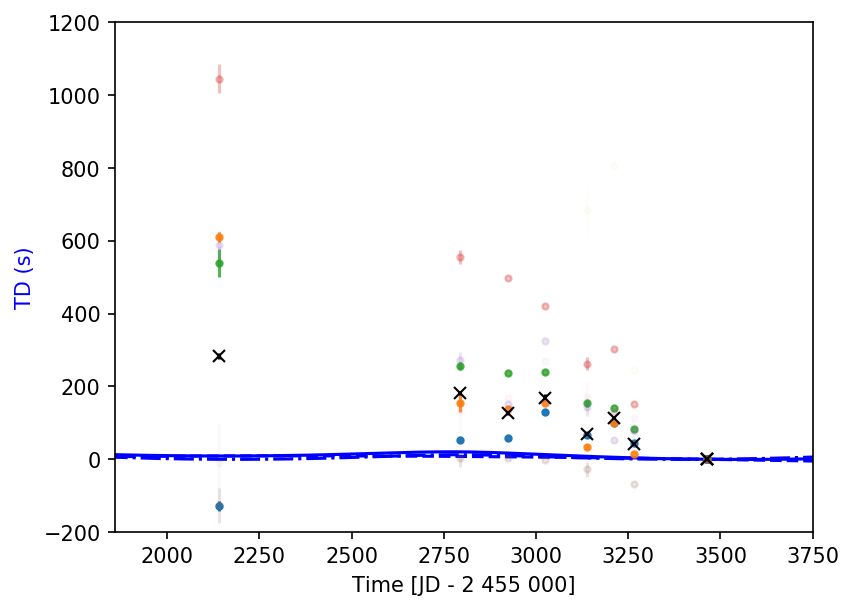

In [411]:
###########################################################################
#ALL TOGETHER NOW!!!


fig, ax1 = plt.subplots(1,1, figsize=(6, 4.5))

for i in range(9):
    ax1.errorbar(t_td_BT - time_offset, tau_td_BT[i], yerr = tau_err_td_BT[i]*100000, fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**2), c = 'C{0}'.format(i))
    ax1.errorbar(t_td_AT - time_offset, tau_td_AT[i], yerr = tau_err_td_AT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**2), c = 'C{0}'.format(i))
    ax1.errorbar(t_td_RT - time_offset, tau_td_RT[i], yerr = tau_err_td_RT[i], fmt='.', alpha = ((a_TESS[i]/a_TESS[0])**2), c = 'C{0}'.format(i))
ax1.errorbar(t_td_BT - time_offset, tau_weighted_td_BT, yerr = tau_err_weighted_td_BT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_AT - time_offset, tau_weighted_td_AT, yerr = tau_err_weighted_td_AT, fmt='.', marker='x', c='k')
ax1.errorbar(t_td_RT - time_offset, tau_weighted_td_RT, yerr = tau_err_weighted_td_RT, fmt='.', marker='x', c='k')


ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve + y_tau_c_sim_curve - y_tau_b_sim[-1] - y_tau_c_sim[-1]) *86400, 'b', label = r"TD $\beta$ Pic b&c")
ax1.plot(times_sim - time_offset, (y_tau_b_sim_curve - y_tau_b_sim[-1]) *86400, 'b', ls = '--', label = r"TD $\beta$ Pic b")
ax1.plot(times_sim - time_offset, (y_tau_c_sim_curve - y_tau_c_sim[-1]) *86400, 'b', ls = '-.', label = r"TD $\beta$ Pic c")

ax1.set_xlabel('Time [JD - 2 455 000]')
ax1.set_ylabel('TD (s)', color='b')

ax1.set_xlim(t_2014+200, t_2020-100)
ax1.set_ylim(-200,1200)

In [181]:
idiot([3,6], times_all_cutout_corr, model_all_cutout)

(array([2457787.31215396, 2457787.31283506, 2457787.31351615, ...,
        2458516.08517335, 2458516.08585442, 2458516.08653548]),
 array([0.00044978, 0.00072745, 0.00096729, ..., 0.00138875, 0.0010382 ,
        0.00062044]),
 array([     0, 781018, 928626]))

In [177]:
time_midpoints

[2457136.7522608717, 2457818.3520136303, 2458151.822266328, 2458463.5628661783]

In [173]:
properties(times,0)

(datetime.datetime(2018, 10, 19, 9, 41, 4, 494860),
 datetime.datetime(2019, 2, 1, 14, 5, 12, 474360),
 105.18342568865046,
 0.009507201286256475,
 120.00003308057785,
 359.9999007582938)

In [175]:
properties(tB15_BJD,0)

(datetime.datetime(2015, 3, 16, 11, 45, 2, 507021),
 datetime.datetime(2015, 6, 2, 19, 30, 28, 869689),
 78.32322179013863,
 0.012767605534402392,
 10.367998480796814,
 4166.667277200444)

In [176]:
min(times)+105.18/2-min(tB15_BJD)+78.32/2

1404.6639118961432

In [167]:
td_weighted[-1]*86400

-9.236045240136496

In [162]:
def rms2(array):
    array = np.array(array)
    tmp = np.sqrt(np.mean((array)**2))
    return tmp

(-1, 1)

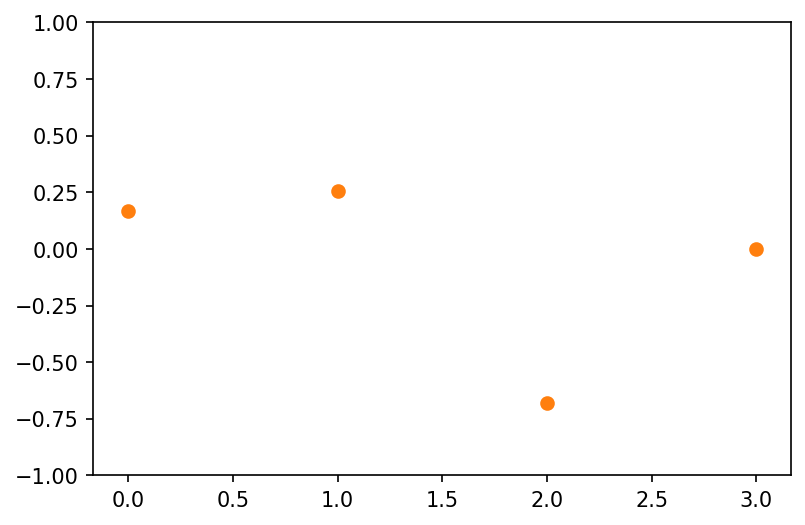

In [161]:
plt.scatter(range(4),y_tau_b_sim*86400-(td_weighted*86400+y_offset))
plt.scatter(range(4),(y_tau_b_sim+y_tau_c_sim)*86400-(td_weighted*86400+y_offset))

plt.ylim(-1,1)

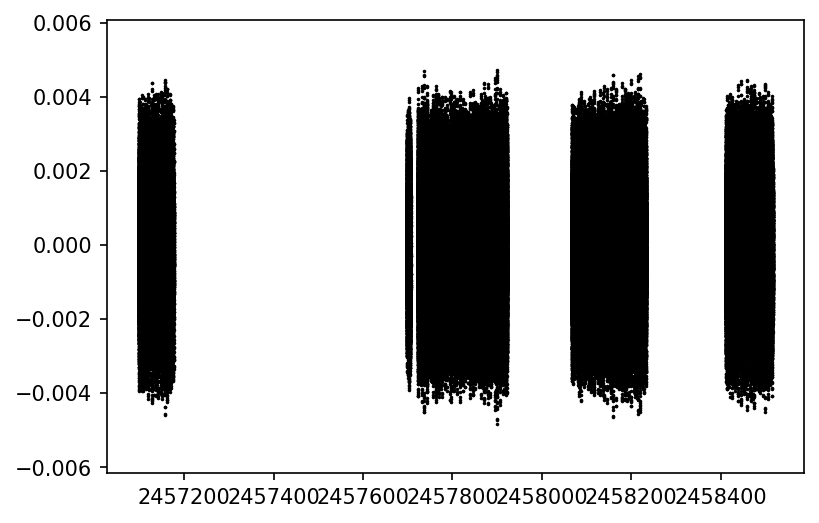

In [157]:
plt.scatter(times_TD, magnitudes_TD, s=0.5, c='k')
#plt.xlim(min(times_TD)+1, min(times_TD)+3)

In [148]:
min(times_TD)-2454833

2264.9893924375065

In [136]:
len(time_midpoints)

4

In [144]:
no_freqs_run

9

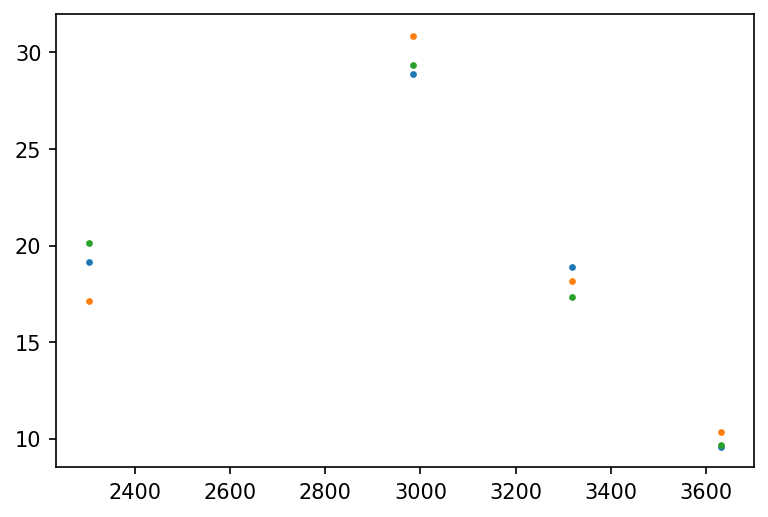

In [143]:
for i in range(3):
    plt.scatter(np.array(time_midpoints) - time_offset, time_delays[i]*86400+y_offset, s=5)

In [133]:
td_weighted[-1]*86400 

-750.155635234531

In [132]:
(y_tau_b_sim[-1] + y_tau_c_sim[-1]) *86400 

9.889114150285538

In [129]:
y_tau_b_sim[-1]*86400

17.588712016064733

In [130]:
y_tau_c_sim[-1]*86400

-7.699597865779194

In [117]:
y_offset

760.0447493848166

In [123]:
time_midpoints

[2457136.7522608717, 2457818.3520136303, 2458151.822266328, 2458463.5628661783]

In [125]:
time_delays[0]

array([ 0.01007212,  0.00206335, -0.00162055, -0.0092165 , -0.00281258,
        0.00114263,  0.00382137, -0.00627428,  0.00282445])

# tess ASTEP

0
229515
Calc LS fit
1
376126
Calc LS fit
2
517971
Calc LS fit
[[4.80624957 4.77657567 4.76157759]
 [2.43060621 2.40332552 2.39196346]
 [1.32593395 1.28566183 1.27897975]
 [5.34665102 5.27413268 5.27812478]
 [0.96044408 0.93528872 0.9319564 ]
 [2.16106192 2.11754755 2.11604342]
 [3.00432793 2.9536841  2.94150232]
 [6.223169   6.20215946 6.18807152]
 [2.62304847 2.71776776 2.70335272]]
[[ 1.61590856  1.58623465  1.57123658]
 [-0.7597348  -0.7870155  -0.79837756]
 [-1.86440707 -1.90467919 -1.91136126]
 [ 2.15631001  2.08379167  2.08778376]
 [-2.22989694 -2.2550523  -2.25838462]
 [-1.02927909 -1.07279346 -1.0742976 ]
 [-0.18601308 -0.23665691 -0.24883869]
 [ 3.03282799  3.01181844  2.99773051]
 [-0.56729254 -0.47257326 -0.4869883 ]]
Calc TD
Plot TD


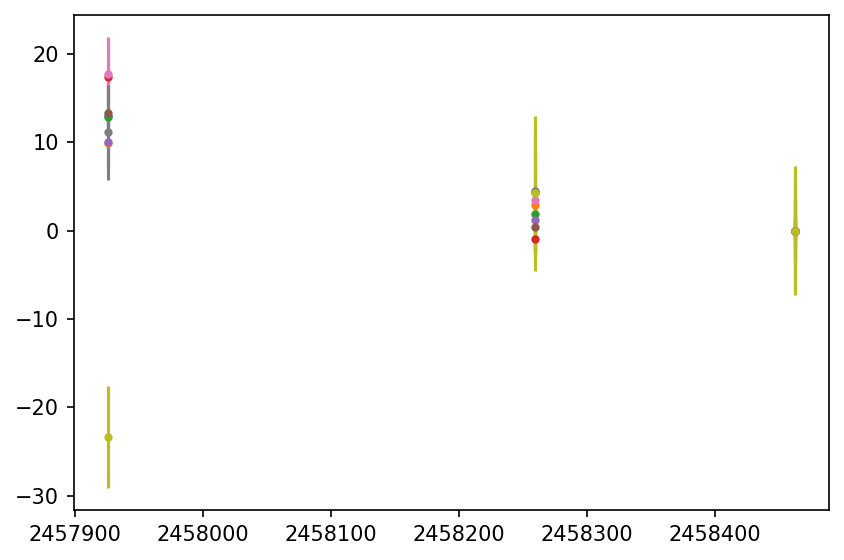

In [435]:
everything = idiot([4,5,6], times_all_cutout_corr, model_all_cutout)

segment_borders = everything[2]

times = everything[0]
magnitudes = everything[1]

y_tau_b_AT = tau(times, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_AT = tau(times, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

times = times - y_tau_b_AT - y_tau_c_AT

time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

iteration = 0

# Iterate over lightcurve
for t, y, idx in zip(times, magnitudes, range(len(times))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        
        # Append the time midpoint
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        
        print('Calc LS fit')
        sol = phases_simon(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))

        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []
        
        iteration += 1 

phase = np.array(phase).T
print(phase)
phase = np.unwrap(phase)
phase -= np.mean(phase)
print(phase)

phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

print('Plot TD')
fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))
for i in range(len(f_TESS)):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax.errorbar(time_midpoints, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.')    
    #ax[0].set_ylim(-800, 800)
    #ax[1].set_ylim(-800, 800)
    
#plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)


t_td_AT = time_midpoints
tau_td_AT = []
for j in range(len(f_TESS)):
    tau_td_AT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
tau_err_td_AT = time_delays_err

# tess bring

In [374]:
idiot([3,6], times_all_cutout_corr, model_all_cutout)

(array([2457787.31215396, 2457787.31283504, 2457787.31351622, ...,
        2458516.08524646, 2458516.08592753, 2458516.08660869]),
 array([0.0001282 , 0.00035641, 0.00055992, ..., 0.0015316 , 0.00121657,
        0.00083009]),
 array([     0, 766358, 908203]))

0
453178
Calc LS fit
1
766357
Calc LS fit
2
908202
Calc LS fit
[[4.7999098  4.77660574 4.76157759]
 [2.43104612 2.40799473 2.39196346]
 [1.31753523 1.2856723  1.27897975]
 [5.33390653 5.2840851  5.27812478]
 [0.96678543 0.93468878 0.9319564 ]
 [2.15411338 2.13475992 2.11604342]
 [2.9905528  2.95103149 2.94150232]
 [6.21815897 6.20273604 6.18807152]
 [2.77714411 2.54419464 2.70335272]]
[[ 1.61092858  1.58762451  1.57259637]
 [-0.7579351  -0.7809865  -0.79701777]
 [-1.871446   -1.90330893 -1.91000147]
 [ 2.14492531  2.09510388  2.08914355]
 [-2.22219579 -2.25429244 -2.25702483]
 [-1.03486784 -1.05422131 -1.07293781]
 [-0.19842843 -0.23794974 -0.2474789 ]
 [ 3.02917774  3.01375482  2.9990903 ]
 [-0.41183712 -0.64478658 -0.48562851]]
Calc TD
Plot TD


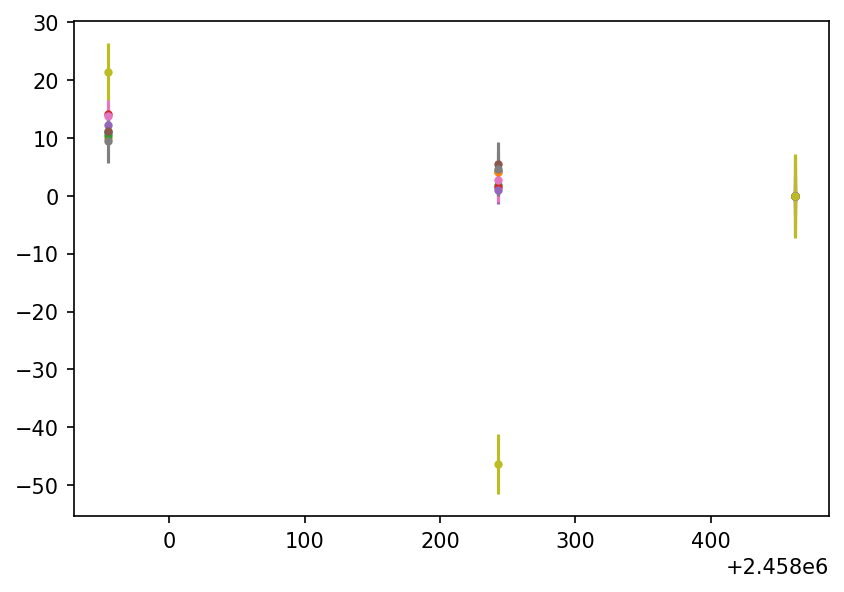

In [437]:
everything = idiot([3,6], times_all_cutout_corr, model_all_cutout)

segment_borders = np.array([     0, 766358//2 + 70000, 766358, 908203])

times = everything[0]
magnitudes = everything[1]

y_tau_b_RT = tau(times, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_RT = tau(times, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

times = times - y_tau_b_RT - y_tau_c_RT

time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

iteration = 0

# Iterate over lightcurve
for t, y, idx in zip(times, magnitudes, range(len(times))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        
        # Append the time midpoint
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        
        print('Calc LS fit')
        sol = phases_simon(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))

        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []
        
        iteration += 1 

phase = np.array(phase).T
print(phase)
phase = np.unwrap(phase)
phase -= np.mean(phase)
print(phase)

phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

print('Plot TD')
fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))
for i in range(len(f_TESS)):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax.errorbar(time_midpoints, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.')    
    #ax[0].set_ylim(-800, 800)
    #ax[1].set_ylim(-800, 800)
    
#plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)


t_td_RT = time_midpoints
tau_td_RT = []
for j in range(len(f_TESS)):
    tau_td_RT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
    tau_err_td_RT = time_delays_err

(-10, 20)

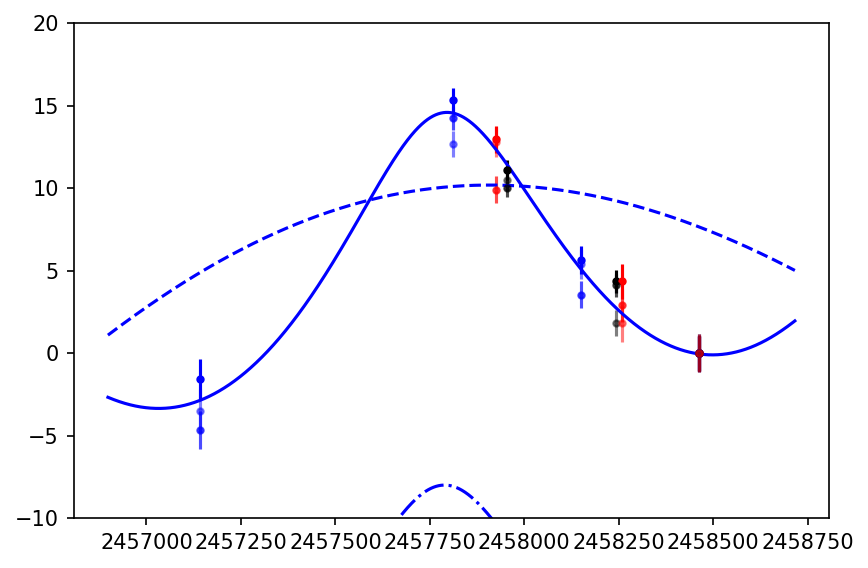

In [443]:
#_b
star_planet_ratio_b = 1.85 / 10 *1048
a2sini_b = 9 * np.sin(np.deg2rad(88.9))
e_b = 0.1
varpi_b = np.deg2rad(189)
Porb_b = 20*365.25
tp_b = 2456380

#_c
star_planet_ratio_c = 1.85 / 8.9 *1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.9))
e_c = 0.27
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

times_sim = np.linspace(min(times_all[0])-200, max(times_all[6])+200, 4000)

y_tau_b_sim = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))

#for i in range(4):
[ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[0][i], yerr = tau_err_td_BT[0][i]*86400, fmt='.', c='b', label='f1 BRITE') for i in range(4)]
[ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[0][i], yerr = tau_err_td_RT[0][i]*86400, fmt='.', c='k', label='f1 BRITE') for i in range(3)]
[ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[0][i], yerr = tau_err_td_AT[0][i]*86400, fmt='.', c='r', label='f1 BRITE') for i in range(3)]

[ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[1][i], yerr = tau_err_td_BT[1][i]*86400, fmt='.', c='b', label='f1 BRITE', alpha=0.7) for i in range(4)]
[ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[1][i], yerr = tau_err_td_RT[1][i]*86400, fmt='.', c='k', label='f1 BRITE', alpha=0.7) for i in range(3)]
[ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[1][i], yerr = tau_err_td_AT[1][i]*86400, fmt='.', c='r', label='f1 BRITE', alpha=0.7) for i in range(3)]

[ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[2][i], yerr = tau_err_td_BT[2][i]*86400, fmt='.', c='b', label='f1 BRITE', alpha=0.5) for i in range(4)]
[ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[2][i], yerr = tau_err_td_RT[2][i]*86400, fmt='.', c='k', label='f1 BRITE', alpha=0.5) for i in range(3)]
[ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[2][i], yerr = tau_err_td_AT[2][i]*86400, fmt='.', c='r', label='f1 BRITE', alpha=0.5) for i in range(3)]

y_offset= 12.5

ax.plot(times_sim, (y_tau_b_sim + y_tau_c_sim) *86400-y_offset, 'b', label = "TD curve")
ax.plot(times_sim, (y_tau_b_sim) *86400-y_offset, 'b', label = "TD curve", ls = '--')
ax.plot(times_sim, (y_tau_c_sim) *86400-y_offset, 'b', label = "TD curve", ls = '-.')

ax.set_ylim(-10, 20)

#ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[0][i], yerr = tau_err_td_BT[0][i]*86400, fmt='.', c='b', label='f1 BRITE')
    #ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[0][i], yerr = tau_err_td_BT[0][i]*86400, fmt='.', c='b', label='f1 BRITE')

# everything at once (simulated)

In [407]:
everythingg = idiot([0,1,2,3,4,5,6], times_all_cutout_corr, model_all_cutout)

In [ ]:
times_all_cutout_corr[i], model_all_cutout[i]

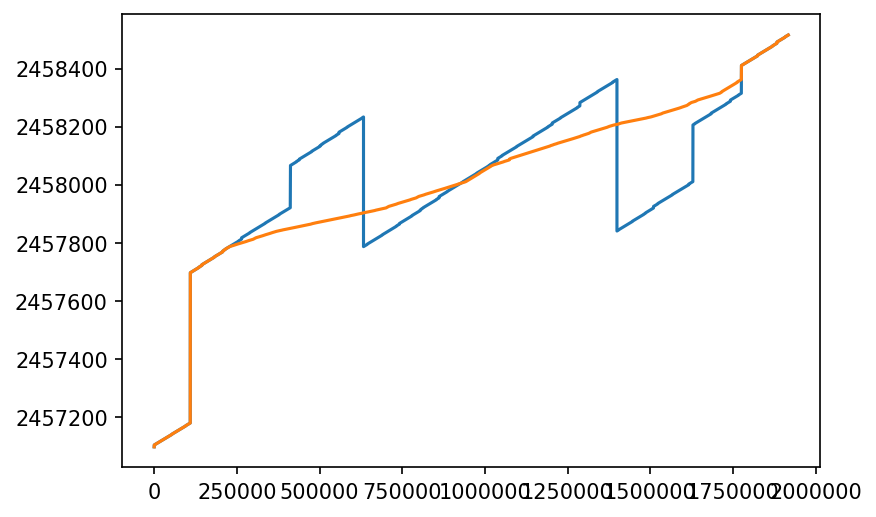

In [409]:
plt.plot(range(len(everythingg[0])), everythingg[0])

sort_idx = np.argsort(everythingg[0])

plt.plot(range(len(everythingg[0])), everythingg[0][sort_idx])

In [422]:
segment_size = 20

times_TD = everythingg[0][sort_idx]
magnitudes_TD = everythingg[1][sort_idx]

time_0 = times_TD[0]
time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

t_edge = []

counter = 1

# Iterate over lightcurve
for t, y in zip(times_TD, magnitudes_TD):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if t - time_0 > segment_size:
        
        print('{0}/{1}'.format(counter, int((max(times_TD )-min(times_TD ))//segment_size)))
        # Append the time midpoint
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        
        
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        sol = phases_simon(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))
        
        #print(sol)
        
        
        print(phase_guess)
        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_0 = t
        time_slice, mag_slice = [], []

        t_edge.append(t)
        
        counter += 1
        
phase = np.array(phase).T
phase_err = np.array(phase_err).T

# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

1/70
[4.71918045 2.32734488 1.21852059 5.28600302 0.8854734  2.16084532
 2.89706508 6.14681264 2.56353466]
2/70
[4.72500729 2.34292145 1.23190931 5.22356047 0.88772138 2.06343508
 2.90135917 6.15182976 2.60268922]
3/70
[4.7189645  2.34076233 1.23354222 5.23350731 0.89776731 2.05907752
 2.84309792 6.13855461 2.77333117]
4/70
[4.73195395 2.33491183 1.228899   5.25060288 0.89672841 2.02359493
 2.9693681  6.11717843 2.48721395]
5/70
[4.67026239 2.2943942  1.29014656 5.46134215 0.86117426 1.88385504
 2.4598486  6.07118081 5.390939  ]
6/70
[4.72017356 2.36221286 1.21651033 5.17404876 0.89348749 2.14085342
 2.94385529 6.17719367 2.61692496]
7/70
[4.7269469  2.31866569 1.23051483 5.27067619 0.8954028  2.08476281
 3.02370718 6.16926387 2.27159713]
8/70
[4.73994383 2.340674   1.22309962 5.23343162 0.89636921 2.09225277
 2.81267019 6.12546299 2.2904724 ]
9/70
[4.72572549 2.34139815 1.24008304 5.20105699 0.88493995 2.0911531
 3.00478961 6.14607072 2.34948937]
10/70
[4.7170049  2.33622666 1.2323031

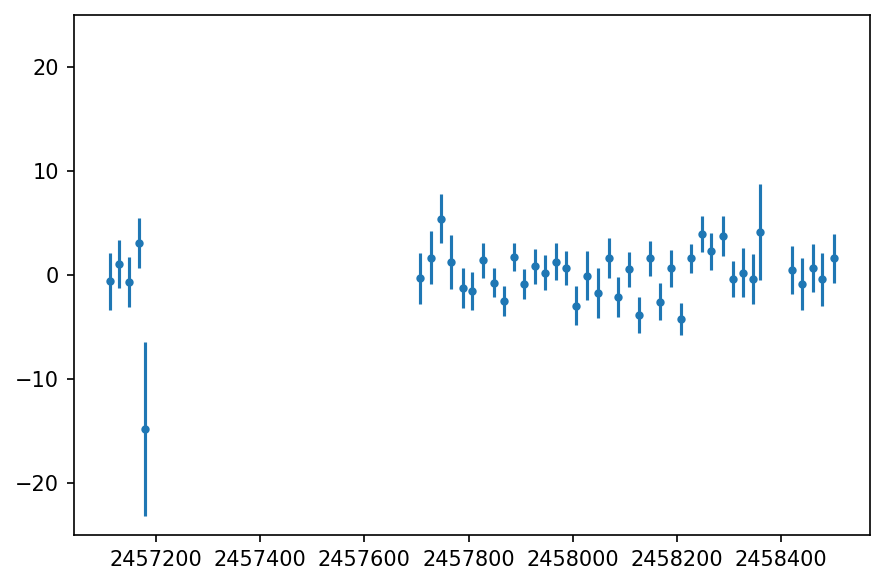

In [433]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
for i in [0]:#range(9):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax.errorbar(time_midpoints, time_delays[i]*86400, yerr = time_delays_err[i]*86400, fmt='.')    
    ax.set_ylim(-25, 25)

    
plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)

# Use real timestamps

In [445]:
times_all

[array([2457097.98961235, 2457097.98978935, 2457097.98996735, ...,
        2457176.31247614, 2457176.31259514, 2457176.31283414]),
 array([2457697.35263518, 2457697.35498618, 2457697.35522118, ...,
        2457921.92494084, 2457921.92517584, 2457921.92541084]),
 array([2458066.51742584, 2458066.51766084, 2458066.51789684, ...,
        2458233.85225077, 2458233.85248577, 2458233.85272077]),
 array([2457787.31215396, 2457787.31584746, 2457787.31954098, ...,
        2458362.62456007, 2458362.62825376, 2458362.63194745]),
 array([2457841.1423336, 2457841.144326 , 2457841.1453762, ...,
        2458011.1659874, 2458011.1669955, 2458011.168025 ]),
 array([2458206.1510377, 2458206.1530305, 2458206.1549982, ...,
        2458315.4373627, 2458315.4383451, 2458315.4396335]),
 array([2458410.90352425, 2458410.90491317, 2458410.90630209, ...,
        2458516.08417223, 2458516.08556108, 2458516.08694993])]

In [765]:
y_tmp

[array([47.43903298, 53.69160236, 50.49211222, 54.23794952, 39.06318864,
        46.5428208 , 48.91898731, 43.52777037, 47.28565013]),
 array([0.00104348, 0.00096971, 0.0009324 , 0.00056387, 0.00043969,
        0.0004109 , 0.0002324 , 0.00020798, 0.00016299]),
 array([4.72425741, 2.34121674, 1.23126998, 5.23298898, 0.89336735,
        2.08093781, 2.88939929, 6.15356524, 2.49080712]),
 array([2458440.        , 2458440.00050025, 2458440.0010005 , ...,
        2458440.9989995 , 2458440.99949975, 2458441.        ]),
 array([ 0.00106339,  0.00111736,  0.02159819, ..., -0.02079264,
         0.00250124,  0.00267   ])]

In [464]:
precision_ppm = 1000
precision = precision_ppm * 1e-6

model_all_real = []

for i in range(len(times_all)):
    tmp = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, times_all[i], precision)
    model_all_real.append(tmp[4])

fig, ax = plt.subplots(1, 1, figsize=(10, 4))
x_tmp = np.linspace(2458440,2458441,1500)
y_tmp = lc_model_times(f_TESS, a_TESS, p_TESS*2*np.pi, x_tmp, 0)
ax.plot(x_tmp, y_tmp[4], c='k', zorder=0, lw=0.5)
ax.scatter(times_all[6], model_all_real[6], s=1, c='r')
ax.set_xlim(2458440,2458441)

ax.invert_yaxis()

ax.set_xlabel('Time [BJD]')
ax.set_ylabel('Inst. Magnitudes [mag]')

plt.tight_layout()
#plt.savefig('lc_{0}ppm.png'.format(precision_ppm), dpi=400, tight_layout=True)

NameError: name 'times_all' is not defined

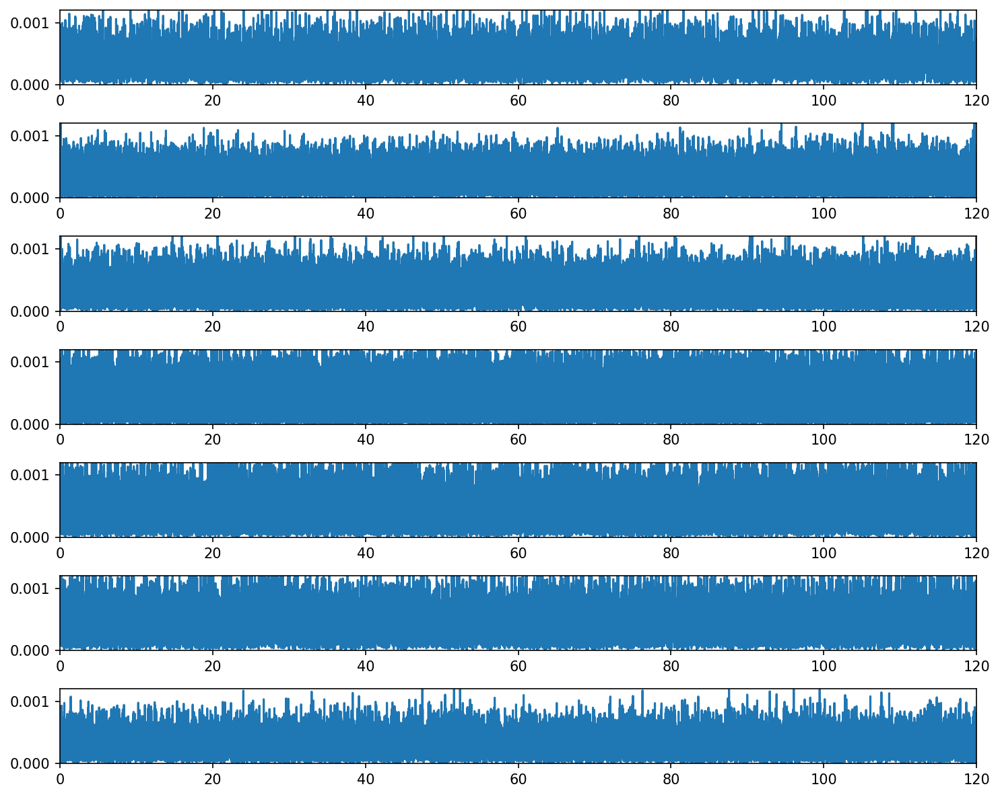

In [864]:
fig, ax = plt.subplots(7, 1, figsize=(10, 8))

for i in range(len(times_all)):
    freq_seg, amp_seg = AS(times_all[i], model_all_real[i], 5)
    ax[i].plot(freq_seg, amp_seg)
    ax[i].set_ylim(0, 0.0012)
    ax[i].set_xlim(0, 120)
    
plt.tight_layout()
plt.savefig('AS_{0}ppm.png'.format(precision_ppm), dpi=400, tight_layout=True)

0
44235
Calc LS fit
1
111813
Calc LS fit
2
165075
Calc LS fit
3
229684
Calc LS fit
[[4.79769652 5.26092644 4.11575948 5.10414622]
 [2.34974848 2.63418378 2.01263803 1.8085707 ]
 [0.82529718 1.59735331 1.25338669 1.37161528]
 [5.38416073 5.18911585 0.73029167 4.37044991]
 [1.00667396 1.4240013  1.16537051 1.79463001]
 [1.55269658 2.09829627 1.80772917 1.82355742]
 [1.41531201 3.47769751 2.95182678 2.45539368]
 [4.44274848 5.59359149 6.19234271 5.46426319]
 [1.30979877 2.23153054 3.82944121 1.85015535]]
[[ 1.77059701  2.23382692  1.08865996  2.0770467 ]
 [-0.67735104 -0.39291574 -1.01446149 -1.21852882]
 [-2.20180233 -1.4297462  -1.77371283 -1.65548424]
 [ 2.35706121  2.16201634  3.98637746  1.34335039]
 [-2.02042556 -1.60309822 -1.861729   -1.2324695 ]
 [-1.47440293 -0.92880324 -1.21937034 -1.20354209]
 [-1.6117875   0.450598   -0.07527273 -0.57170583]
 [ 1.41564897  2.56649197  3.1652432   2.43716368]
 [-1.71730075 -0.79556897  0.8023417  -1.17694417]]
Calc TD
Plot TD


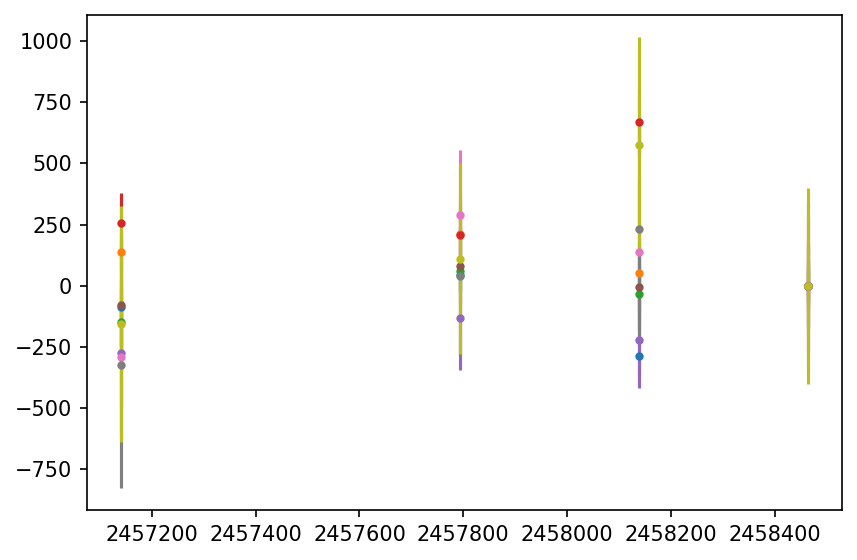

In [865]:
everything = idiot([0,1,2,6], times_all, model_all_real)

segment_borders = everything[2]

times = everything[0]
magnitudes = everything[1]

y_tau_b_BT = tau(times, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_BT = tau(times, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

times = times - y_tau_b_BT - y_tau_c_BT

time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

iteration = 0

# Iterate over lightcurve
for t, y, idx in zip(times, magnitudes, range(len(times))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        
        # Append the time midpoint
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        
        print('Calc LS fit')
        sol = phases_simon(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))

        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []
        
        iteration += 1 

phase = np.array(phase).T
print(phase)
phase = np.unwrap(phase)
phase -= np.mean(phase)
print(phase)

phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

print('Plot TD')
fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))
for i in range(len(f_TESS)):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax.errorbar(time_midpoints, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.')    
    #ax[0].set_ylim(-800, 800)
    #ax[1].set_ylim(-800, 800)
    
#plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)


t_td_BT = time_midpoints
tau_td_BT = []
for j in range(len(f_TESS)):
    tau_td_BT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
tau_err_td_BT = time_delays_err

0
32005
Calc LS fit
1
64243
Calc LS fit
2
128852
Calc LS fit
[[4.08724823 4.29210294 5.10414622]
 [2.33025933 2.87504286 1.8085707 ]
 [1.36905725 1.43779567 1.37161528]
 [0.63704608 5.88722399 4.37044991]
 [1.52439625 1.66441491 1.79463001]
 [3.12814739 2.09949258 1.82355742]
 [4.09581369 2.54958793 2.45539368]
 [3.4691517  0.38950264 5.46426319]
 [4.83525643 4.74281966 1.85015535]]
[[ 1.91659692  2.12145163  2.93349491]
 [ 0.15960802  0.70439155 -0.36208061]
 [-0.80159406 -0.73285564 -0.79903603]
 [-1.53360523 -2.56661263 -4.08338671]
 [-0.64625505 -0.5062364  -0.3760213 ]
 [ 0.95749608 -0.07115873 -0.34709389]
 [ 1.92516238  0.37893662  0.28474237]
 [ 1.29850039 -1.78114867 -2.98957342]
 [ 2.66460512  2.57216835 -0.32049596]]
Calc TD
Plot TD


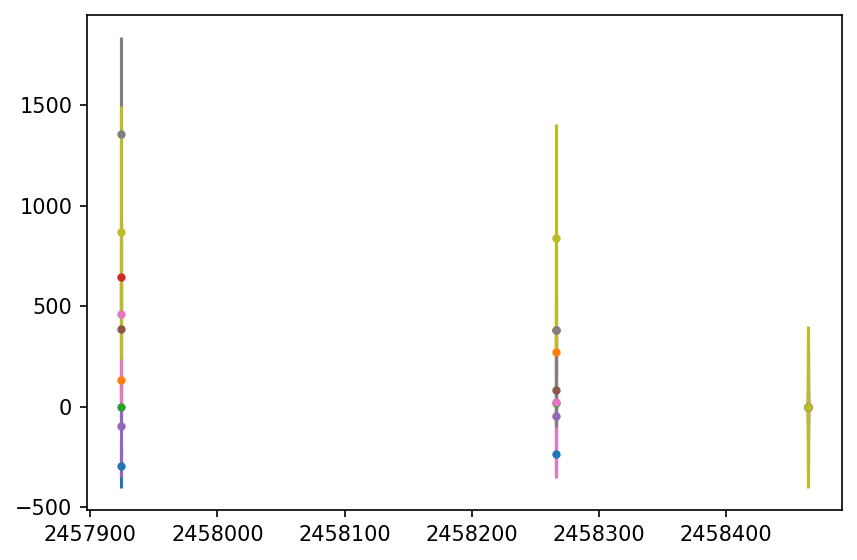

In [866]:
everything = idiot([4,5,6], times_all, model_all_real)

segment_borders = everything[2]

times = everything[0]
magnitudes = everything[1]

y_tau_b_AT = tau(times, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_AT = tau(times, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

times = times - y_tau_b_AT - y_tau_c_AT

time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

iteration = 0

# Iterate over lightcurve
for t, y, idx in zip(times, magnitudes, range(len(times))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        
        # Append the time midpoint
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        
        print('Calc LS fit')
        sol = phases_simon(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))

        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []
        
        iteration += 1 

phase = np.array(phase).T
print(phase)
phase = np.unwrap(phase)
phase -= np.mean(phase)
print(phase)

phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

print('Plot TD')
fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))
for i in range(len(f_TESS)):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax.errorbar(time_midpoints, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.')    
    #ax[0].set_ylim(-800, 800)
    #ax[1].set_ylim(-800, 800)
    
#plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)


t_td_AT = time_midpoints
tau_td_AT = []
for j in range(len(f_TESS)):
    tau_td_AT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
tau_err_td_AT = time_delays_err

# tess bring

In [867]:
idiot([3,6], times_all, model_all_real)

(array([2457787.31215396, 2457787.31584746, 2457787.31954098, ...,
        2458516.08417223, 2458516.08556108, 2458516.08694993]),
 array([ 0.04096046, -0.07114675, -0.00770104, ...,  0.04706129,
         0.02443596,  0.01558408]),
 array([     0,  42027, 106636]))

0
21012
Calc LS fit
1
42026
Calc LS fit
2
106635
Calc LS fit
[[4.03145061 4.02190276 5.10414622]
 [2.17699154 1.18910865 1.8085707 ]
 [0.75464432 1.35381323 1.37161528]
 [4.57701642 5.04949573 4.37044991]
 [2.01114038 0.84079694 1.79463001]
 [2.1627676  3.56375468 1.82355742]
 [5.95309947 1.92679054 2.45539368]
 [0.75548764 5.44117874 5.46426319]
 [1.95594289 0.33905574 1.85015535]]
[[ 1.28525729  1.27570944  2.3579529 ]
 [-0.56920178 -1.55708467 -0.93762262]
 [-1.991549   -1.39238009 -1.37457804]
 [ 1.8308231   2.30330241  1.62425659]
 [-0.73505294 -1.90539638 -0.95156331]
 [-0.58342572  0.81756136 -0.9226359 ]
 [ 3.20690615  5.46378253  5.99238567]
 [-1.99070568 -3.58819989 -3.56511543]
 [-0.79025043 -2.40713758 -0.89603797]]
Calc TD
Plot TD


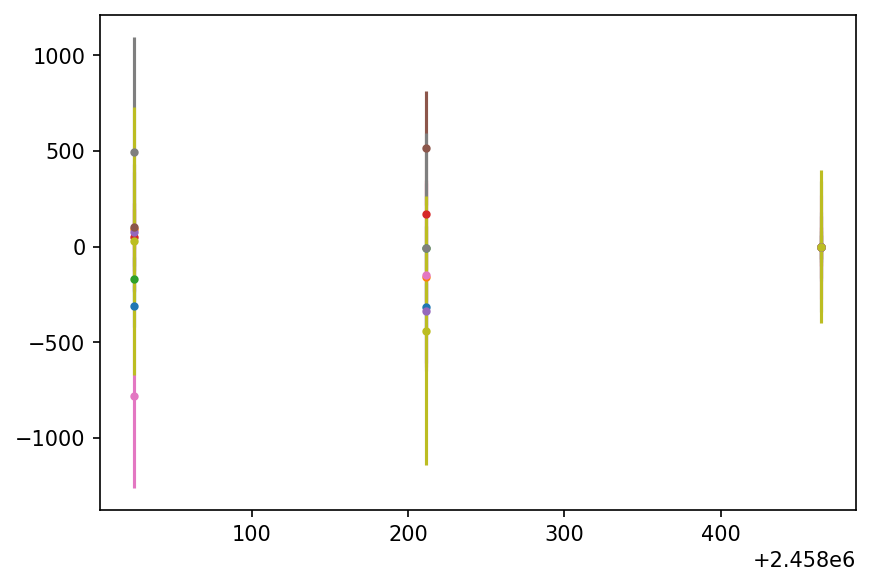

In [868]:
everything = idiot([3,6], times_all, model_all_real)

segment_borders = np.array([     0, 42027//2, 42027, 106636])

times = everything[0]
magnitudes = everything[1]

y_tau_b_RT = tau(times, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_RT = tau(times, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

times = times - y_tau_b_RT - y_tau_c_RT

time_slice, mag_slice, phase, phase_err = [], [], [], []
time_delays, time_delays_err, time_midpoints = [], [], []

iteration = 0

# Iterate over lightcurve
for t, y, idx in zip(times, magnitudes, range(len(times))):
    time_slice.append(t)
    mag_slice.append(y)

    # In each segment
    if idx == segment_borders[iteration+1]-1:
        print(iteration)
        print(idx)
        
        # Append the time midpoint
        time_midpoints.append(np.mean(time_slice))

        # And the phases for each frequency
        phase_guess = dft_phase(time_slice, mag_slice, f_TESS)
        
        print('Calc LS fit')
        sol = phases_simon(time_slice, mag_slice, f_TESS, a_TESS, phase_guess/(2*np.pi))

        phase.append(phase_guess)
        phase_err.append(sol[3]*2*np.pi)
        
        time_slice, mag_slice = [], []
        
        iteration += 1 

phase = np.array(phase).T
print(phase)
phase = np.unwrap(phase)
phase -= np.mean(phase)
print(phase)

phase_err = np.array(phase_err).T

print('Calc TD')
# Phase wrapping patch
for ph, ph_err, f in zip(phase, phase_err, f_TESS):
    td = ph / (2*np.pi*f)
    time_delays.append(td-np.mean(td))
    time_delays_err.append(ph_err / (2*np.pi*f))

print('Plot TD')
fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))
for i in range(len(f_TESS)):
    #ax[0].scatter(time_midpoints, time_delays[i]*86400, s=5)
    ax.errorbar(time_midpoints, (time_delays[i]-time_delays[i][-1])*86400, yerr = time_delays_err[i]*86400, fmt='.')    
    #ax[0].set_ylim(-800, 800)
    #ax[1].set_ylim(-800, 800)
    
#plt.tight_layout()
#fig.savefig('f_TESS1.png', tight_layout=True)


t_td_RT = time_midpoints
tau_td_RT = []
for j in range(len(f_TESS)):
    tau_td_RT.append(np.array([i*86400 for i in time_delays][j]-[i*86400 for i in time_delays][j][-1]))
    tau_err_td_RT = time_delays_err

# weightefd

In [869]:
time_midpoints_all = t_td_BT+t_td_RT+t_td_AT
time_delays_all = np.concatenate((tau_td_BT,tau_td_RT,tau_td_AT),axis=1)
time_delays_err_all = np.concatenate((tau_err_td_BT,tau_err_td_RT,tau_err_td_AT),axis=1)

In [870]:
indices = np.array([0,1,2,3,4])
time_delays_all = time_delays_all[indices]
time_delays_err_all = time_delays_err_all[indices]

In [871]:
td_weighted = []
for i in range(len(time_midpoints_all)):
    #print(i)
    tds, tds_err = [], []
    for j in range(len(time_delays_all)):
        #print(j)
        tds.append(time_delays_all[j][i])
        tds_err.append(time_delays_err_all[j][i])
    tds = np.array(tds)
    tds_err = np.array(tds_err)
    td_weighted.append(sum(tds/tds_err**2)/sum(1/tds_err**2))
td_weighted = np.array(td_weighted)

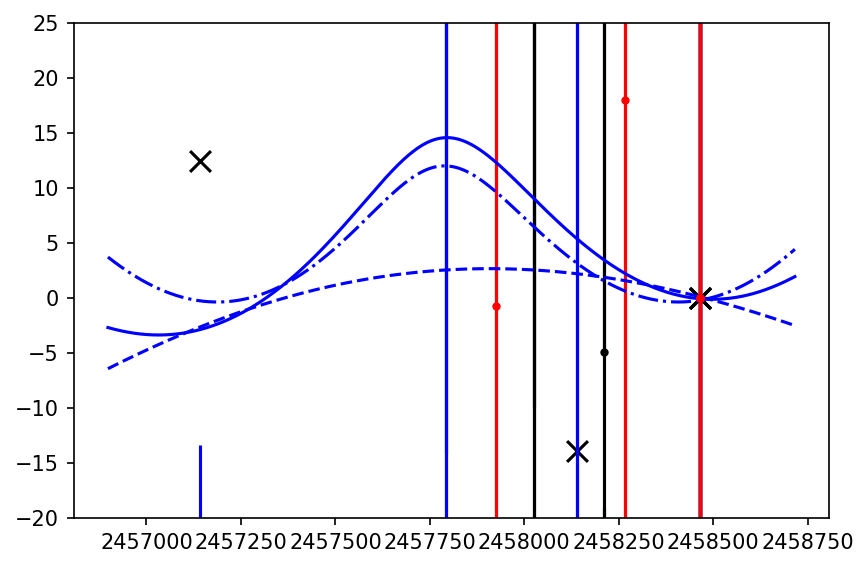

In [872]:
#_b
star_planet_ratio_b = 1.85 / 10 *1048
a2sini_b = 9 * np.sin(np.deg2rad(88.9))
e_b = 0.1
varpi_b = np.deg2rad(189)
Porb_b = 20*365.25
tp_b = 2456380

#_c
star_planet_ratio_c = 1.85 / 8.9 *1048
a2sini_c = 2.7 * np.sin(np.deg2rad(88.9))
e_c = 0.27
varpi_c = np.deg2rad(-95)
Porb_c = 1220
tp_c = 2454117

times_sim = np.linspace(min(times_all[0])-200, max(times_all[6])+200, 4000)

y_tau_b_sim = tau(times_sim, star_planet_ratio_b, a2sini_b, e_b, varpi_b, Porb_b, tp_b, 100)
y_tau_c_sim = tau(times_sim, star_planet_ratio_c, a2sini_c, e_c, varpi_c, Porb_c, tp_c, 100)

fig, ax = plt.subplots(1, 1, figsize=(6.5, 3.5*2.5/2))


# [ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[0][i], yerr = tau_err_td_BT[0][i]*86400, fmt='.', c='b', label='f1 BRITE') for i in range(4)]
# [ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[0][i], yerr = tau_err_td_RT[0][i]*86400, fmt='.', c='k', label='f1 BRITE') for i in range(3)]
# [ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[0][i], yerr = tau_err_td_AT[0][i]*86400, fmt='.', c='r', label='f1 BRITE') for i in range(3)]

# [ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[1][i], yerr = tau_err_td_BT[1][i]*86400, fmt='.', c='b', label='f1 BRITE', alpha=0.7) for i in range(4)]
# [ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[1][i], yerr = tau_err_td_RT[1][i]*86400, fmt='.', c='k', label='f1 BRITE', alpha=0.7) for i in range(3)]
# [ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[1][i], yerr = tau_err_td_AT[1][i]*86400, fmt='.', c='r', label='f1 BRITE', alpha=0.7) for i in range(3)]

# [ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[2][i], yerr = tau_err_td_BT[2][i]*86400, fmt='.', c='b', label='f1 BRITE', alpha=0.5) for i in range(4)]
# [ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[2][i], yerr = tau_err_td_RT[2][i]*86400, fmt='.', c='k', label='f1 BRITE', alpha=0.5) for i in range(3)]
# [ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[2][i], yerr = tau_err_td_AT[2][i]*86400, fmt='.', c='r', label='f1 BRITE', alpha=0.5) for i in range(3)]



[[ax.errorbar(np.array(t_td_BT[i]), tau_td_BT[ii][i], yerr = tau_err_td_BT[ii][i]*86400, fmt='.', c='b', label='f1 BRITE') for i in range(4)] for ii in indices]
[[ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[ii][i], yerr = tau_err_td_RT[ii][i]*86400, fmt='.', c='k', label='f1 BRITE') for i in range(3)] for ii in indices]
[[ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[ii][i], yerr = tau_err_td_AT[ii][i]*86400, fmt='.', c='r', label='f1 BRITE') for i in range(3)] for ii in indices]


y_offset= 12.5

ax.plot(times_sim, (y_tau_b_sim + y_tau_c_sim) *86400-y_offset, 'b', label = "TD curve")
ax.plot(times_sim, (y_tau_b_sim) *86400-y_offset-7.5, 'b', label = "TD curve", ls = '--')
ax.plot(times_sim, (y_tau_c_sim) *86400-y_offset+20, 'b', label = "TD curve", ls = '-.')

ax.scatter(np.array(time_midpoints_all), td_weighted, marker='x', c='k', s=100)    

ax.set_ylim(-20, 25)

#ax.errorbar(np.array(t_td_RT[i]), tau_td_RT[0][i], yerr = tau_err_td_BT[0][i]*86400, fmt='.', c='b', label='f1 BRITE')
    #ax.errorbar(np.array(t_td_AT[i]), tau_td_AT[0][i], yerr = tau_err_td_BT[0][i]*86400, fmt='.', c='b', label='f1 BRITE')
        
plt.savefig('realstamps_{0}ppm.png'.format(precision_ppm), dpi=400, tight_layout=True)